# Convert Delay Scan data to q-space, save to HDF5 File
### For data from `FERMI DiProI` endstation

## Import modules

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
import h5py as h5
from h5glance import H5Glance
from sys import platform
import datetime

# Importing custom python modules
import FittingDictParams as ft
import PostProcessing as pp
import misc_fctns as mf

In [2]:
%matplotlib inline
plt.rcParams['figure.figsize'] = (7, 6)
plt.rcParams['figure.dpi']= 200

# plt.rcParams["font.family"] = "Times New Roman"
# plt.rcParams['mathtext.fontset'] = 'stix'

## File path and analysis options

In [3]:
# Sample name
sample = "XFEL08"

# Path to raw data
path = 'Raw_data'

# Should figures be saved?
save_fig_bool = False

# Path to where figures are exported
save_fig_dir = 'Figures_exported'


# Scan_number
scan_im = "WX15_Y16_Scan041"

# Scan background files
scan_BG = "{0}_BG".format(scan_im) # Background = no FEL, no IR
scan_OF = "{0}_OF".format(scan_im) # Only FEL
scan_OL = "{0}_OL".format(scan_im) # Only Laser=IR

# Delay time params
position_t0 =  23.972   # Delay stage position [mm] corresponding to t=0 WX15_Y16_Scan041

# Detector pixel size
pix_size = 0.0135   # Physical pixel size [mm]

## Get the OS type for formating file paths

In [4]:
# Identify system OS to set formatting for path strings
if platform == "linux" or platform == "linux2":
    concat_3 = "{0}/{1}/{2}/rawdata"
    concat_2 = "{0}/{1}"
    concat_1 = "/"
elif platform == "darwin":
    concat_3 = "{0}/{1}/{2}/rawdata"
    concat_2 = "{0}/{1}"
    concat_1 = "/"
elif platform == "win64":
    concat_3 = "{0}\\{1}\\{2}\\rawdata"
    concat_2 = "{0}\\{1}"
    concat_1 = "\\"
else:
    concat_3 = "{0}\\{1}\\{2}\\rawdata"
    concat_2 = "{0}\\{1}"
    concat_1 = "\\"

## Get list of files to analyze
- This section adapted from Emmauelle Jal's example (2020-07-23)

In [5]:
# Build path for each file type; use fctn 'ls' in script file to get list of .h5 files
#============================
# Image data
path_im = concat_3.format(path, sample, scan_im)
li_file_im = mf.ls(path = path_im,\
                  st = ".h5",\
                  show = False,\
                  ret = "name")
nb_file_im = len(li_file_im)

#============================
# Background data
try:
    path_BG = concat_3.format(path, sample, scan_BG)
    li_file_BG = mf.ls(path = path_BG,\
                  st = ".h5",\
                  show = False,\
                  ret = "name")
    nb_file_BG = len(li_file_BG)
    if nb_file_BG > 0:
        bool_BG = True
    else:
        bool_BG = False
except:
    bool_BG = False

#============================
# FEL only data
try:
    path_OF = concat_3.format(path, sample, scan_OF)
    li_file_OF = mf.ls(path = path_OF,\
                  st = ".h5",\
                  show = False,\
                  ret = "name")
    nb_file_OF = len(li_file_OF)
    if nb_file_OF > 0:
        bool_OF = True
    else:
        bool_OF = False
except:
    bool_OF = False

#============================
# OL only data
try:
    path_OL = concat_3.format(path, sample, scan_OL)
    li_file_OL = mf.ls(path = path_OL,\
                  st = ".h5",\
                  show = False,\
                  ret = "name")
    nb_file_OL = len(li_file_OL)
    if nb_file_OL > 0:
        bool_OL = True
    else:
        bool_OL = False
except:
    bool_OL = False

## Load one file to get detector distance and wavelength

In [6]:
# Choose a file from the list
f = h5.File(path_im + concat_1 + li_file_im[0], mode='r')

# OPTIONAL Examine h5 file
import h5glance
h5glance.install_ipython_h5py_display()   # Set display mode to HTML
H5Glance(f)

Raw_data\XFEL08\WX15_Y16_Scan041\rawdata\WX15_Y16_Scan041_446343789.h5/ (1 attributes)
├DPI	(42 children)
├ExperimentalComments	[ASCII string: scalar] (1 attributes)
├FEL	(6 children)
├Laser	(4 children)
├Lecroy	(5 children)
├PAM	(13 children)
├bunches	[int32: 300]
├image	(1 children)
├photon_diagnostics	(9 children)
└photon_source	(8 children)

In [7]:
# Get sample-to-detector distance
det_pos = f['DPI/CCDZ'][()]   # [mm]
det_dis = 45 + det_pos - 7  # [mm] Convert CCD_Z to sample-to-detector distance
lambda_Slaser = f["photon_source/SeedLaser/Wavelength"][()]   # [nm]
Harmo1 = f["photon_source/FEL01/harmonic_number"][()]
wavelen = lambda_Slaser / Harmo1   # [nm]
Energy1 = f["/Laser/Energy1"][()]
fluence = round(np.average(Energy1), 1)
print(f'Detector distance = {det_dis} mm')
print(f'FEL wavelength = {wavelen} [nm]')
print(f'Laser fluence = {fluence} [uJ]')

Detector distance = 80.0 mm
FEL wavelength = 18.72 [nm]
Laser fluence = 16.0 [uJ]


## Define ROI for normalization
### This serves as a proxy for FEL intensity I_0

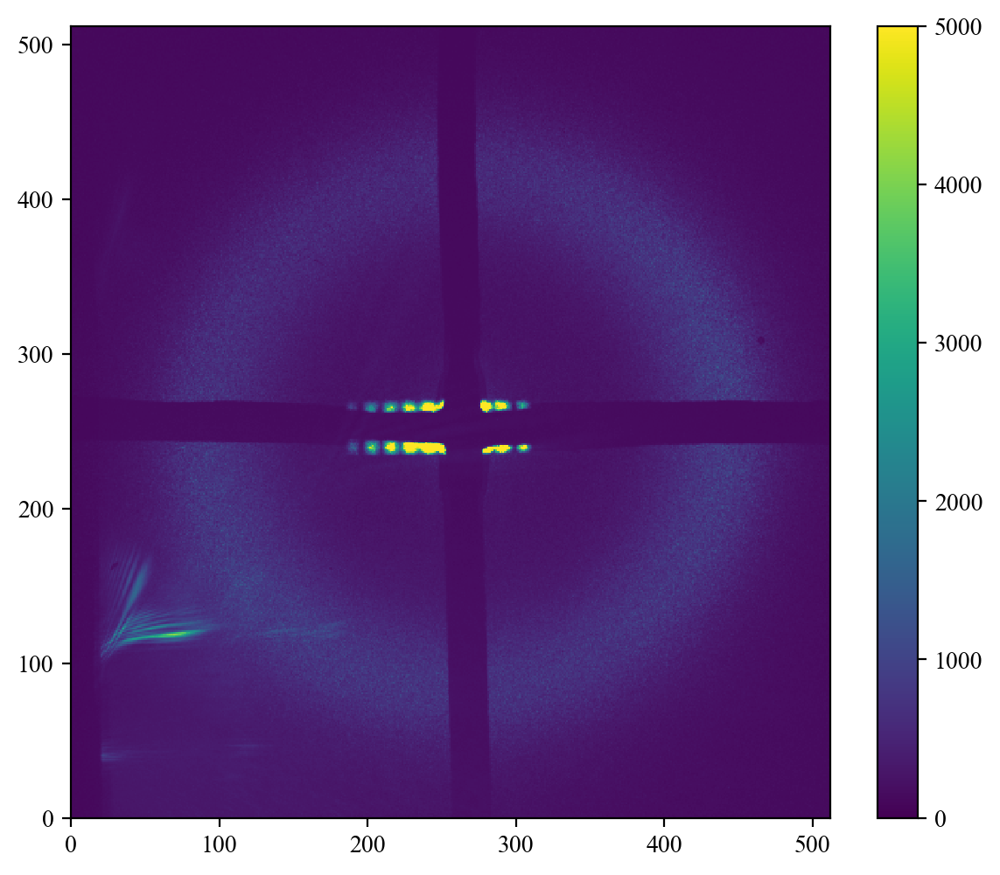

In [8]:
im = np.rot90(f['image/ccd1'][:], k=-1)
im = np.array(im)
plt.pcolormesh(im, vmin=0, vmax=5000, shading='auto')
plt.colorbar()

In [9]:
np.shape(im)[0]

512

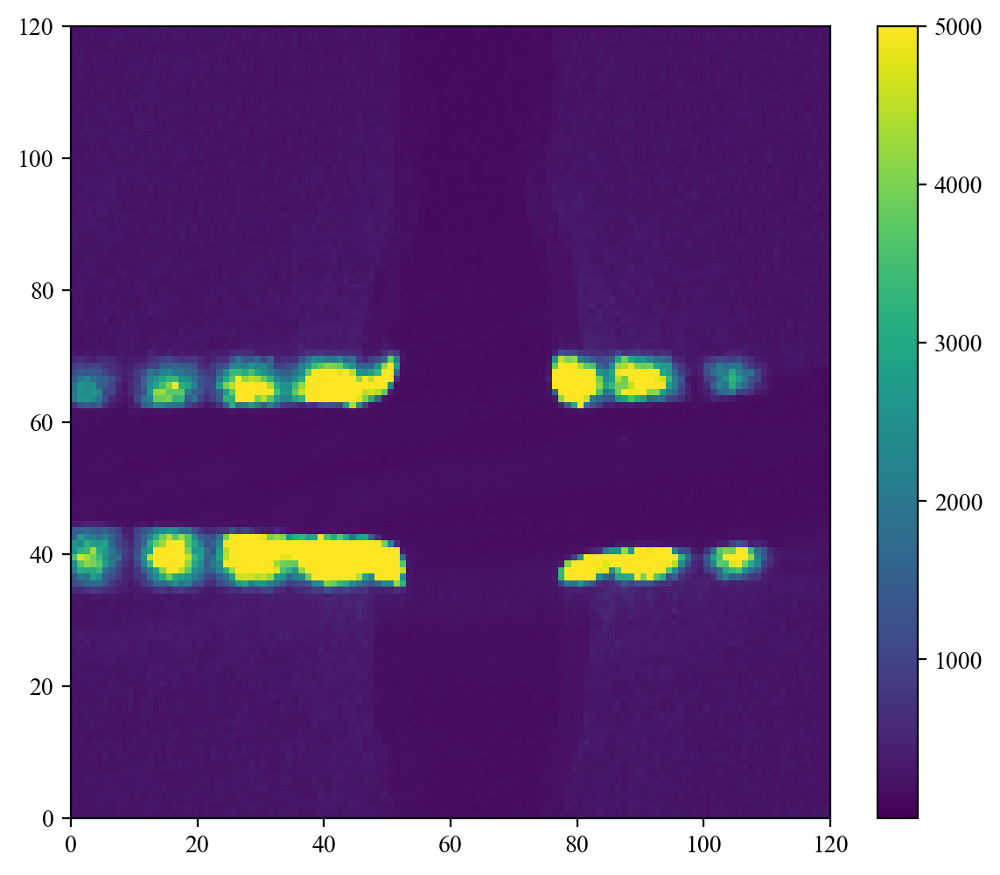

In [10]:
# Get detector binning factor. The full detector size was 2048 x 2048 pixels
if np.shape(im)[0] != 2048:
    factor = 2048/np.shape(im)[0]
    #remainder = 2048%np.shape(im)[0];
    try:
        2048%np.shape(im)[0] == 0
    except:
        print('Number of pixels is not a factor of 2048 !!')
    eff_pix_size = factor*pix_size
else:
    factor = 2048/np.shape(im)[0]
    eff_pix_size = pix_size

# This is the ROI used for normalizing scans
roi = im[int(200*4/factor):int(320*4/factor), int(200*4/factor):int(320*4/factor)]

# Showing the ROI
plt.pcolormesh(roi, vmin=0.2, vmax=5000, shading='auto')
plt.colorbar()

In [11]:
# Taking the mean of ROI to check if the values are in expected range
roi_mean = np.mean(roi)
roi_max = np.max(roi)
print(roi_mean)
print(roi_max)

565.3952083333334
25824


## Loop over the lists to load background data
- This section adapted from Emmauelle Jal's example (2020-07-23)

In [12]:
#============================
# Background data
if bool_BG == True:
    print()
    print("=== Background ===")
    data_BG = []
    delay_BG = []
    for i in range(0, nb_file_BG):
        # sometime it is impossible to get data
        try:
            name_file_BG = li_file_BG[i]
            path_BG_i = concat_2.format(path_BG, name_file_BG)
            
            f     = h5.File(path_BG_i, 'r')
            BG    = np.rot90(f['image/ccd1'][:], k=-1)
            delay = f['DPI/DelayLine'][()]
            
            data_BG.append(BG)
            delay_BG.append(delay)
            print(name_file_BG)
        except:
            pass
    
    data_BG = np.array(data_BG)
    delay_BG = np.array(delay_BG)
    t_del_BG = 20/2.99792458 * (delay_BG - position_t0)

#============================
# FEL only data
if bool_OF == True:
    print()
    print("=== Only FEL ===")
    data_OF = []
    delay_OF = []
    for i in range(0, nb_file_OF):
        # sometime it is impossible to get data
        try:
            name_file_OF = li_file_OF[i]
            path_OF_i = concat_2.format(path_OF, name_file_OF)
            
            f     = h5.File(path_OF_i, 'r')
            OF    = np.rot90(f['image/ccd1'][:], k=-1)
            delay = f['DPI/DelayLine'][()]
            
            data_OF.append(OF)
            delay_OF.append(delay)
            print(name_file_OF)
        except:
            pass
    
    data_OF = np.array(data_OF)
    delay_OF = np.array(delay_OF)
    t_del_OF = 20/2.99792458 * (delay_OF - position_t0)

#============================
# OL only data
if bool_OL == True:
    print()
    print("=== Only Laser ===")
    data_OL = []
    delay_OL = []
    for i in range(0, nb_file_OL):
        # sometOLe it is impossible to get data
        try:
            name_file_OL = li_file_OL[i]
            path_OL_i = concat_2.format(path_OL, name_file_OL)
            
            f     = h5.File(path_OL_i, 'r')
            OL    = np.rot90(f['image/ccd1'][:], k=-1)
            delay = f['DPI/DelayLine'][()]
            
            data_OL.append(OL)
            delay_OL.append(delay)
            print(name_file_OL)
        except:
            pass
    
    data_OL = np.array(data_OL)
    delay_OL = np.array(delay_OL)
    t_del_OL = 20/2.99792458 * (delay_OL - position_t0)



=== Background ===
WX15_Y16_Scan041_BG_446350240.h5
WX15_Y16_Scan041_BG_446362870.h5
WX15_Y16_Scan041_BG_446375770.h5
WX15_Y16_Scan041_BG_446388311.h5
WX15_Y16_Scan041_BG_446400841.h5
WX15_Y16_Scan041_BG_446413471.h5
WX15_Y16_Scan041_BG_446426116.h5

=== Only FEL ===
WX15_Y16_Scan041_OF_446346159.h5
WX15_Y16_Scan041_OF_446358776.h5
WX15_Y16_Scan041_OF_446371606.h5
WX15_Y16_Scan041_OF_446384075.h5
WX15_Y16_Scan041_OF_446396744.h5
WX15_Y16_Scan041_OF_446409315.h5
WX15_Y16_Scan041_OF_446422049.h5

=== Only Laser ===
WX15_Y16_Scan041_OL_446349243.h5
WX15_Y16_Scan041_OL_446361857.h5
WX15_Y16_Scan041_OL_446374717.h5
WX15_Y16_Scan041_OL_446387240.h5
WX15_Y16_Scan041_OL_446399855.h5
WX15_Y16_Scan041_OL_446412468.h5
WX15_Y16_Scan041_OL_446425134.h5


## Average background and clear memory

In [13]:
# Method 1: use BG files
#if bool_BG == True:
#    BG_mean = 0 #np.mean(data_BG, axis = 0)
##    data_im_subBG = data_im - BG_mean
##else:   # No BG data loaded
#    scan_BG = 'None'

In [14]:
# Method 2: use OL files
# This became preferred method when we saw that some OL photons leak through to one corner of detector
if bool_OL == True:
    BG_mean = np.mean(data_OL, axis = 0)
else:   # No BG data loaded
    scan_OL = 'None'

In [15]:
# Clear memory
del data_BG
del data_OF
del data_OL
del delay_BG
del delay_OF
del delay_OL
del t_del_BG
del t_del_OF
del t_del_OL

## Compute pixel positions and q values

In [16]:
ax_size = BG_mean.shape

# This is the default center of scattering aka the center of image. This will be fitted further in code
center_X_pixel = 2048/factor/2
center_Y_pixel = 2048/factor/2

# If pixels have been binned together, compute effective pixel size
if ax_size[0] != 2048:
    (num_bin, remainder) = np.divmod(2048, ax_size[0])
    if remainder != 0:
        print('Number of pixels is not a factor of 2048 !!')
    eff_pix_size = num_bin * pix_size
    print(f'Effective pixel size = {eff_pix_size} [um]')
else:
    eff_pix_size = pix_size

# Create X and Y arrays with pixel positions
    # Note: Both X and Y values increase with col index (unlike EuXFEL files)
x = np.arange(-ax_size[1]/2, ax_size[1]/2, 1) * eff_pix_size
y = np.arange(-ax_size[0]/2, ax_size[0]/2, 1) * eff_pix_size

center_X_mm = (-np.shape(im)[0]/2 + center_X_pixel)*eff_pix_size
center_Y_mm = (-np.shape(im)[1]/2 + center_Y_pixel)*eff_pix_size

center_X = 2 * np.pi * np.sin(np.arctan(center_X_mm / det_dis)) / wavelen
center_Y = 2 * np.pi * np.sin(np.arctan(center_Y_mm / det_dis)) / wavelen

# Apply fitted shift so that diffraction pattern is centered at (0,0)
x = x - center_X_mm
y = y - center_Y_mm

Effective pixel size = 0.054 [um]


In [17]:
xx1, yy1 = np.meshgrid(x, y)

In [18]:
# Convert pixel positions to q values [1/nm]
qx = 2 * np.pi * np.sin(np.arctan(x / det_dis)) / wavelen
qy = 2 * np.pi * np.sin(np.arctan(y / det_dis)) / wavelen
# Generate Cartesian q coordinates (qxx,qyy) for every pixel in the detector [1/nm]
qxx, qyy = np.meshgrid(qx, qy)

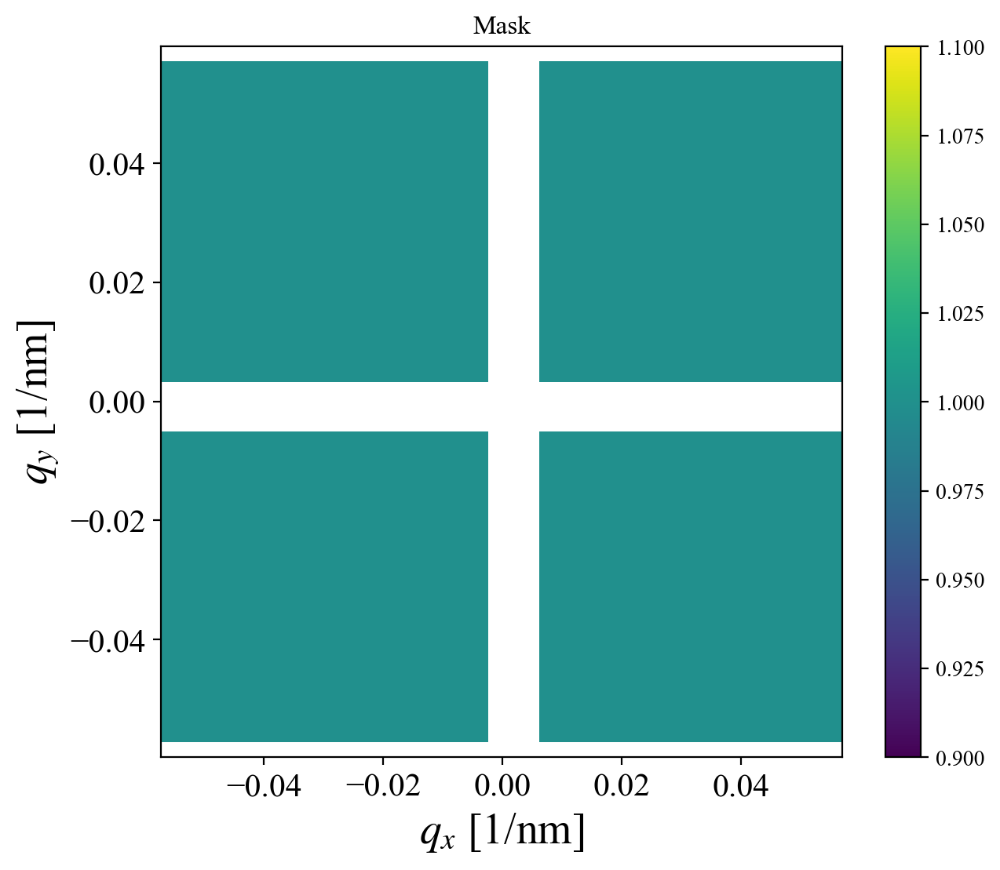

In [19]:
# Gernerating a mask for the beam block
mask = np.zeros((np.shape(im)[0], np.shape(im)[1])) + 1
mask = mask.astype("float")

# Offset for mask as it is not centered on the detector center
mask_offset_X = 35
mask_offset_Y = 15

mask[:,round((949+mask_offset_X)/factor):round((1099+mask_offset_X)/factor)] = 0;
mask[round((949-mask_offset_Y)/factor):round((1099-mask_offset_Y)/factor),:] = 0;
mask_nan = np.zeros((np.shape(im)[0], np.shape(im)[1])) + 1
mask_nan = mask.astype("float")
mask_nan[:,round((949+mask_offset_X)/factor):round((1099+mask_offset_X)/factor)] = np.nan;
mask_nan[round((949-mask_offset_Y)/factor):round((1099-mask_offset_Y)/factor),:] = np.nan;

mask_flat = mask_nan.flatten()

plt.pcolormesh(qx, qy, mask_nan, shading='auto')
plt.colorbar()
plt.axis('equal')
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('$q_x$ [1/nm]',fontsize=20)
plt.ylabel('$q_y$ [1/nm]',fontsize=20)
plt.title(f'Mask')
plt.show()

In [20]:
# Generating a logical ring mask

outer_r = 1000/factor
inner_r = 300/factor

ring_mask_size_x = np.shape(im)[0]
ring_mask_size_y = np.shape(im)[1]

ring_xx, ring_yy = np.meshgrid(np.arange(0, ring_mask_size_x, 1), np.arange(0, ring_mask_size_y, 1))

array2D = (ring_yy - center_Y_pixel)**2 + (ring_xx - center_X_pixel)**2
ringPixels_logical_1 = array2D >= inner_r**2 
#ringPixels_logical_2 = array2D <= outer_r**2
ring_mask = ringPixels_logical_1#*ringPixels_logical_2
ring_mask = ring_mask.astype('float')
ring_mask[ring_mask == 0] = np.nan # or use np.nan

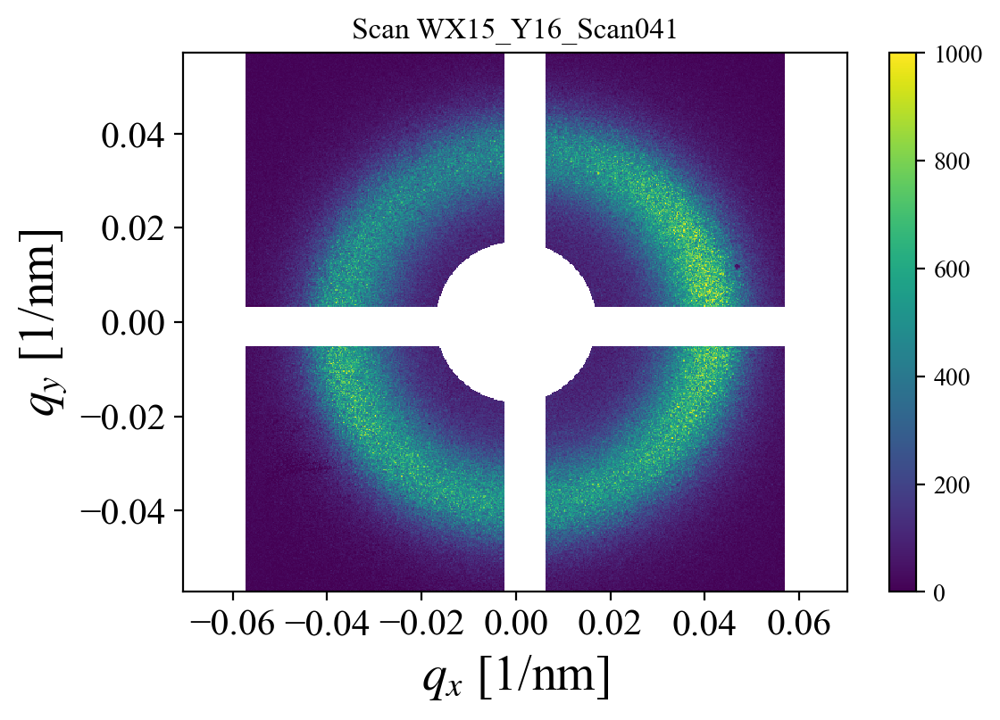

In [21]:
im_subBG = im - BG_mean

# Plotting the single imported image to check masking 
%matplotlib inline
plt.rcParams['figure.dpi']= 200
plt.pcolormesh(qx, qy, im_subBG*mask_nan*ring_mask, vmin=0, vmax=1000, shading='auto')
#plt.pcolormesh(qx, qy, im_subBG*mask_nan, vmin=0, vmax=1000, shading='auto')
plt.colorbar()
plt.axis('equal')
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('$q_x$ [1/nm]',fontsize=20)
plt.ylabel('$q_y$ [1/nm]',fontsize=20)
plt.title(f'Scan {scan_im}')
plt.show()

## Loop to load each image

In [22]:
# Initialize lists that will be filled in loop
delay_im = []
fel_e = []   # FEL photon energy [eV]
IR_e = []   # IR pump pulse energy [uJ]

In [23]:
center_X_mm

0.0

In [24]:
# Importing all scan images

print("=== Images ===")
# initialize list
data_im_subBG_final = np.empty((nb_file_im, np.shape(im)[0], np.shape(im)[1]), dtype = np.float32)
for i in range(0, nb_file_im):
    try:
        name_file_im = li_file_im[i]
        path_im_i = concat_2.format(path_im, name_file_im) # final path for each image
        f     = h5.File(path_im_i, 'r') # Import all data from h5 file
        im    = np.rot90(f['image/ccd1'][:], k=-1) # Read image and rotate it
        delay = f['DPI/DelayLine'][()]   # [mm]
        lambda_Slaser = f["photon_source/SeedLaser/Wavelength"][()]   # [nm]
        Harmo1 = f["photon_source/FEL01/harmonic_number"][()]
        wavelen = lambda_Slaser / Harmo1   # [nm]
        FEL_E = 1239.842 / wavelen   # [eV]; equivalent to E = h*c/(lambda*1e-9)
        IR = f["Laser/Energy1"][()]   # [µJ]; one value for every shot
        
        delay_im.append(delay) # appending delay positions for calculating delay time for pump probe
        fel_e.append(round(FEL_E,2)) # FEL energy
        IR_e.append(round(np.nanmean(IR),2))   # Average IR energy for all shots
    except:
        pass
    
    print(name_file_im)

    # Change image into numpy array
    data_im = np.array(im)
    
    # Subtract background image
    data_im_subBG = data_im - BG_mean

    # Normalize to ROI (proxy for FEL intensity I_0)
    roi = data_im_subBG[200:320, 200:320]
    norm = np.mean(roi)
    data_im_subBG = data_im_subBG / norm
    
    # Append normalized image data to data array
    data_im_subBG_final[i] = data_im_subBG
    

=== Images ===
WX15_Y16_Scan041_446343789.h5
WX15_Y16_Scan041_446344810.h5
WX15_Y16_Scan041_446347224.h5
WX15_Y16_Scan041_446348214.h5
WX15_Y16_Scan041_446351536.h5
WX15_Y16_Scan041_446352608.h5
WX15_Y16_Scan041_446353958.h5
WX15_Y16_Scan041_446355003.h5
WX15_Y16_Scan041_446356353.h5
WX15_Y16_Scan041_446357411.h5
WX15_Y16_Scan041_446359771.h5
WX15_Y16_Scan041_446360818.h5
WX15_Y16_Scan041_446364441.h5
WX15_Y16_Scan041_446365487.h5
WX15_Y16_Scan041_446366888.h5
WX15_Y16_Scan041_446367954.h5
WX15_Y16_Scan041_446369263.h5
WX15_Y16_Scan041_446370295.h5
WX15_Y16_Scan041_446372648.h5
WX15_Y16_Scan041_446373695.h5
WX15_Y16_Scan041_446377033.h5
WX15_Y16_Scan041_446378023.h5
WX15_Y16_Scan041_446379281.h5
WX15_Y16_Scan041_446380315.h5
WX15_Y16_Scan041_446381707.h5
WX15_Y16_Scan041_446382761.h5
WX15_Y16_Scan041_446385136.h5
WX15_Y16_Scan041_446386177.h5
WX15_Y16_Scan041_446389594.h5
WX15_Y16_Scan041_446390657.h5
WX15_Y16_Scan041_446391961.h5
WX15_Y16_Scan041_446393027.h5
WX15_Y16_Scan041_44639437

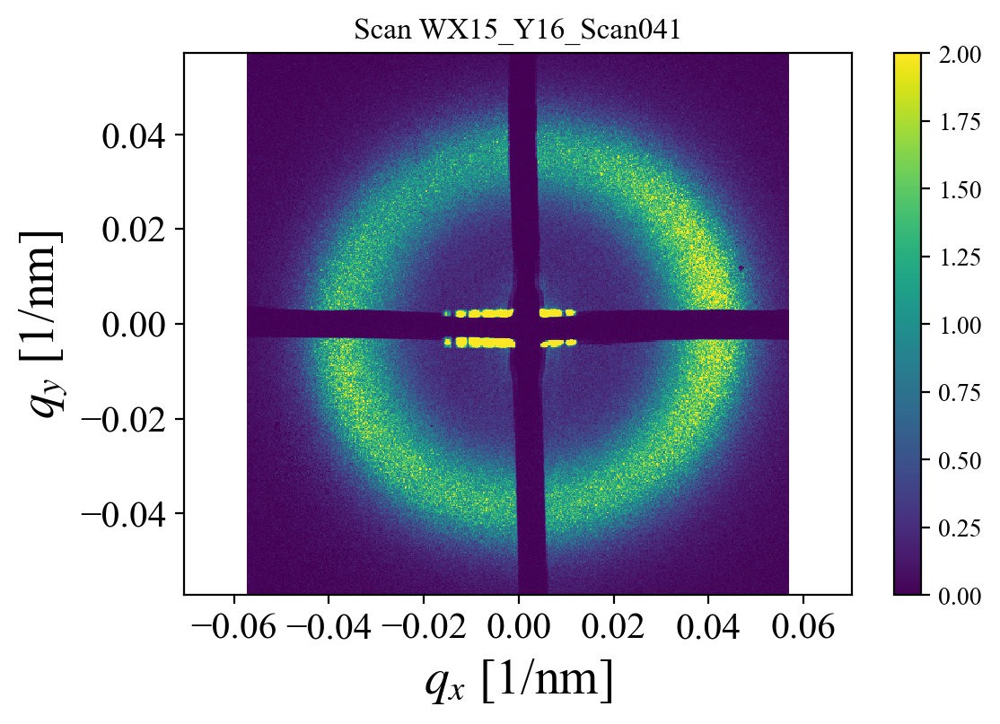

In [25]:
# Open one image to check if everything looks good
plt.rcParams['figure.dpi']= 200
plt.pcolormesh(qx, qy, data_im_subBG_final[2, :, :], vmin=0, vmax=2, shading='auto')
plt.colorbar()
plt.axis('equal')
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('$q_x$ [1/nm]',fontsize=20)
plt.ylabel('$q_y$ [1/nm]',fontsize=20)
plt.title(f'Scan {scan_im}')
plt.show()

In [26]:
np.shape(data_im_subBG_final)

(58, 512, 512)

In [27]:
np.shape(data_im_subBG)

(512, 512)

In [28]:
#position_t0 =  24.355
# delay_im = np.array(delay_im)
# t_del_im = 20/2.99792458 * (delay_im - position_t0) 

In [29]:
# Convert delay position [mm] to delay time [ps]
delay_im = np.array(delay_im)
t_del_im = 20/2.99792458 * (delay_im - position_t0)   # Equivalent to c = 299792458. * 1e3 * 1e-12 mm/ps

# Average FEL and IR readings for all files in the scan 
fel_e = np.array(fel_e)
fel_e_mean = round(np.mean(fel_e),2)
IR_e = np.array(IR_e)
IR_e_mean = round(np.mean(IR_e),2)

In [30]:
# Averaging frames taken at same delay time because in all scans there are two images at the same delay for averaging noise out
final_delay_time = np.unique(t_del_im)
data_im_avged = np.empty((np.shape(final_delay_time)[0], np.shape(im)[0], np.shape(im)[1]), dtype = np.float32)
for i in range(0, np.shape(final_delay_time)[0]):
    index_for_sum = np.where(t_del_im == final_delay_time[i])
    sum_for_avg = np.zeros((np.shape(im)[0], np.shape(im)[1]))
    index_for_sum_list = list(index_for_sum[0])
    for j in range(0, np.shape(index_for_sum_list)[0]):
        sum_for_avg = sum_for_avg + data_im_subBG_final[index_for_sum_list[j], :, :]# images_backg_corr{index_for_sum(j, 1), 1}
    data_im_avged[i] = sum_for_avg/np.shape(index_for_sum_list)[0]

In [31]:
np.shape(data_im_subBG)

(512, 512)

In [32]:
np.shape(data_im_avged)

(28, 512, 512)

In [33]:
np.shape(final_delay_time)[0]

28

In [34]:
np.shape(final_delay_time)

(28,)

In [35]:
# Printing the final delay time for the scan
final_delay_time

array([-2.300258  , -1.30023284, -0.30020769, -0.25017307, -0.20013846,
       -0.15010384, -0.10006923, -0.05003461,  0.        ,  0.05003461,
        0.10006923,  0.15010384,  0.20013846,  0.25017307,  0.30020769,
        0.40027691,  0.50034614,  0.74985209,  1.00002516,  2.00071744,
        3.0007426 ,  4.00076776,  5.00079292,  6.0014852 ,  7.00151036,
        8.00153552,  9.00156067, 10.00225296])

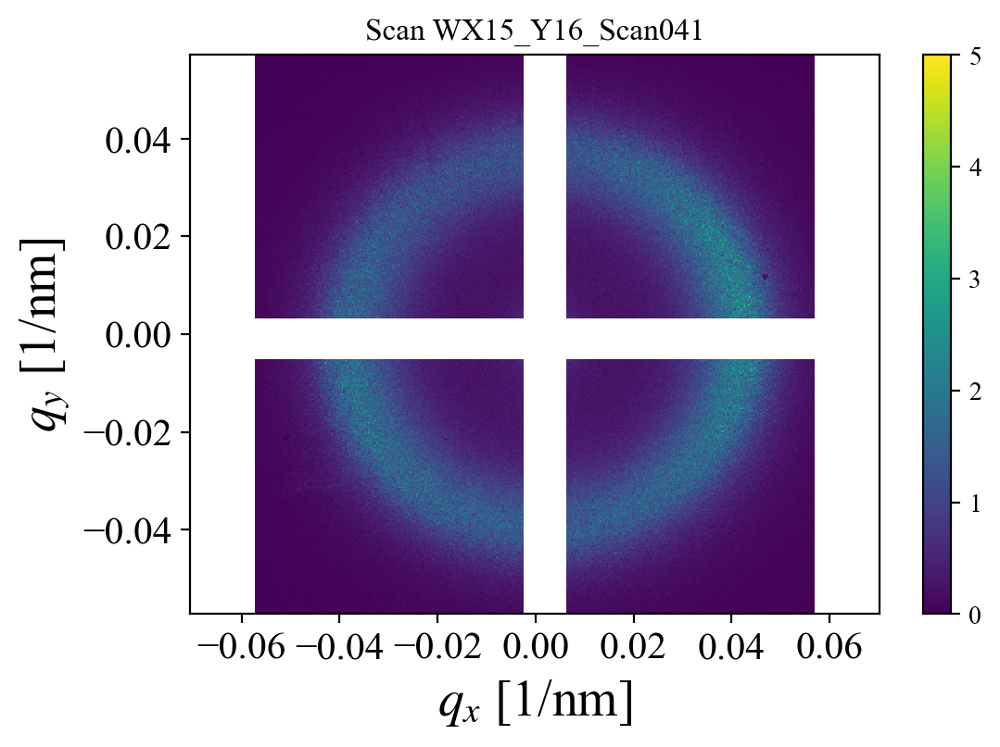

In [36]:
%matplotlib inline
plt.rcParams['figure.dpi']= 200

plt.pcolormesh(qx, qy, data_im_avged[0, :, :]*mask_nan, vmin=0, vmax=5, shading='auto')
plt.colorbar()
plt.axis('equal')
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('$q_x$ [1/nm]',fontsize=20)
plt.ylabel('$q_y$ [1/nm]',fontsize=20)
plt.title(f'Scan {scan_im}')
plt.show()

In [37]:
# Shell width for azimuthal integration
shell_width = 0.0005   # [1/nm]

# Define radial wavenumber
qxmax = np.max(np.abs(qx))
qymax = np.max(np.abs(qy))
qmax = np.max([qxmax, qymax])
q = np.arange(0, qmax, shell_width*2)

# Fitting fctn needs image as numpy array, not xarray DataArray
image_masked = np.array(data_im_avged[0, :, :]*mask_nan)


In [38]:
# Extracting center from the scattering 
px, py, perrx, perry = pp.ExtractCenter(xx1,yy1,ax_size,data_im_avged[0, :, :],0)

In [39]:
# Converting center into pixels
pix_X_cent = round(px/pix_size)
pix_Y_cent = round(py/pix_size)

# Error in center finding in pixels
pix_X_cent_err = round(perrx/pix_size)
pix_Y_cent_err = round(perry/pix_size)

In [40]:
print('X center is '+str(pix_X_cent)+'+-'+str(pix_X_cent_err)+' pixels')
print('X center is '+str(pix_Y_cent)+'+-'+str(pix_Y_cent_err)+' pixels')

X center is 44+-1 pixels
X center is -25+-1 pixels


In [41]:
px

0.5872864673191216

In [42]:
py

-0.33245712701476343

In [43]:
pix_Y_cent

-25

In [44]:
# Error in 
perrx

0.01064277836318121

In [45]:
perry

0.010637084524911392

In [46]:
# Update x and y axis so the new center is at zero
x = x - px
y = y - py

In [47]:
# Convert pixel positions to q values [1/nm]
qx = 2 * np.pi * np.sin(np.arctan(x / det_dis)) / wavelen
qy = 2 * np.pi * np.sin(np.arctan(y / det_dis)) / wavelen
# Generate Cartesian q coordinates (qxx,qyy) for every pixel in the detector [1/nm]
qxx, qyy = np.meshgrid(qx, qy)

In [48]:
# Shell width for azimuthal integration
shell_width = 0.0005   # [1/nm]

# Define radial wavenumber
qxmax = np.max(np.abs(qx))
qymax = np.max(np.abs(qy))
qmax = np.max([qxmax, qymax])
q = np.arange(0, qmax, shell_width*2)

# Fitting fctn needs image as numpy array, not xarray DataArray
image_masked = np.array(data_im_avged[0, :, :]*mask_nan)

# Azimuthal integration
#Intensity_Avg, Intensity_Int, _, _ = pp.Integrator(qxx,qyy,q,image_masked,image_masked*0,ax_size,0,0,shell_width,0,0)

In [49]:
xx1, yy1 = np.meshgrid(x, y)

In [50]:
# Azimuthal integration
Intensity_Avg1, Intensity_Int1, _, im_sum1 = pp.Integrator(qxx, qyy, q, data_im_avged[0, :, :], data_im_avged[0, :, :]*0, ax_size,0,0,shell_width,[60, 80] ,0)
Intensity_Avg2, Intensity_Int2, _, im_sum2 = pp.Integrator(qxx, qyy, q, data_im_avged[0, :, :], data_im_avged[0, :, :]*0, ax_size,0,0,shell_width,[240, 250] ,0)

<function matplotlib.pyplot.show(close=None, block=None)>

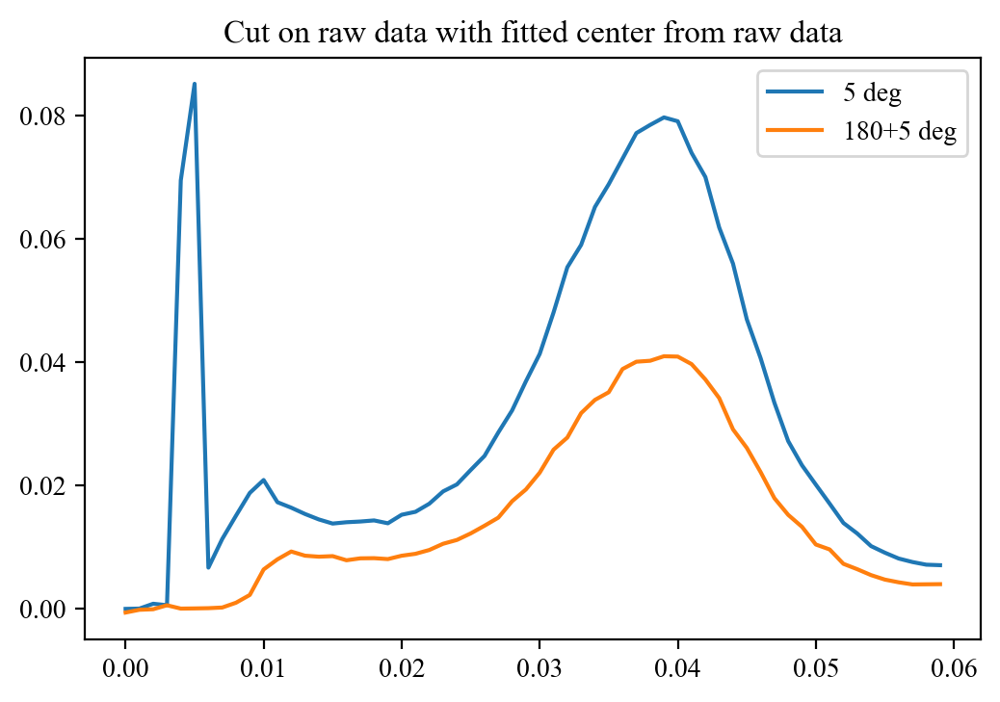

In [51]:
plt.plot(q, Intensity_Avg1, label = '5 deg')
plt.plot(q, Intensity_Avg2, label = '180+5 deg')
#plt.ylim(0, 0.1)
plt.legend()
plt.title('Cut on raw data with fitted center from raw data')
plt.show

In [52]:
# Generating a new logical ring mask with updated center

outer_r = 1000/factor
inner_r = 250/factor

ring_mask_size_x = np.shape(im)[0]
ring_mask_size_y = np.shape(im)[1]

ring_xx, ring_yy = np.meshgrid(np.arange(0, ring_mask_size_x, 1), np.arange(0, ring_mask_size_y, 1))

#array2D = (ring_yy - round(pix_Y_cent/factor))**2 + (ring_xx - round(pix_X_cent/factor))**2
array2D = (ring_yy - (center_Y_pixel + round(pix_Y_cent/factor)))**2 + (ring_xx - (center_X_pixel + round(pix_X_cent/factor)))**2
ringPixels_logical_1 = array2D >= inner_r**2 
#ringPixels_logical_2 = array2D <= outer_r**2
ring_mask = ringPixels_logical_1#*ringPixels_logical_2
ring_mask = ring_mask.astype('float')
ring_mask[ring_mask == 0] = np.nan # or use np.nan

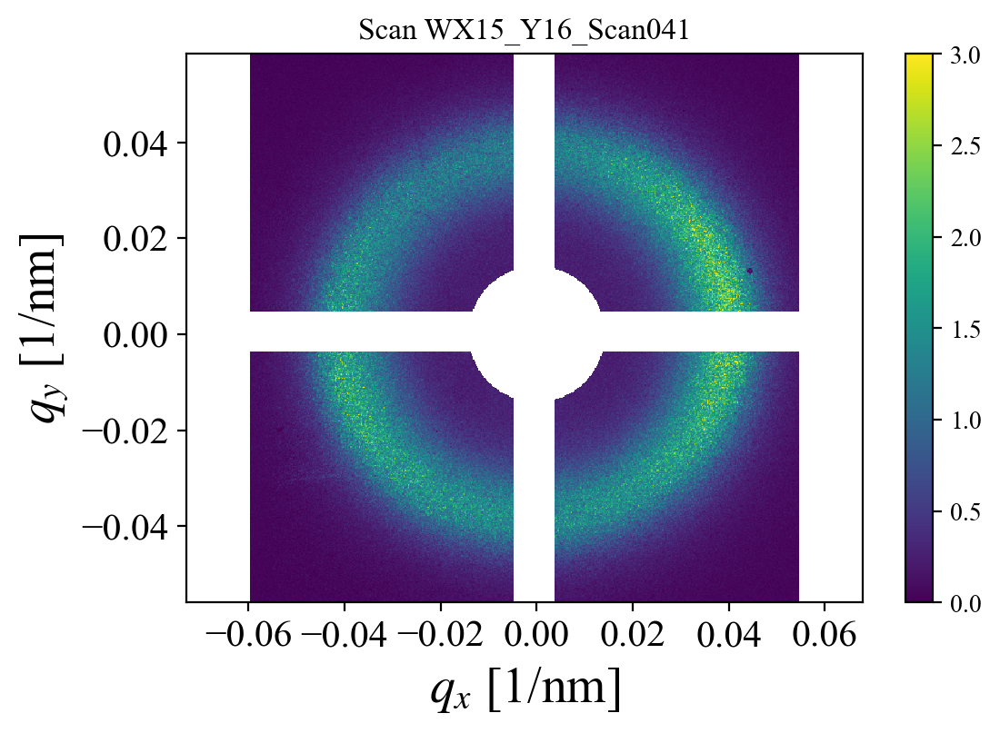

In [53]:
# Check if the center looks good

%matplotlib inline
plt.rcParams['figure.dpi']= 200
plt.pcolormesh(qx, qy, data_im_avged[0, :, :]*mask_nan*ring_mask, vmin=0, vmax=3, shading='auto')
plt.colorbar()
plt.axis('equal')
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('$q_x$ [1/nm]',fontsize=20)
plt.ylabel('$q_y$ [1/nm]',fontsize=20)
plt.title(f'Scan {scan_im}')
plt.show()

# Iterative 2D fitting procedure

### Final 2D fit eqn with variable names for readability
$$
\begin{equation}
\begin{aligned}
& I^2(q, \theta)= \\
& B+I_0\left[\frac{1}{\left[\frac{\left(q-q_0\right)}{\Gamma_0}\right]^2+1}\right]^2+\left[\frac{1}{\left[\frac{\left(q-q_1\right)}{\Gamma_1}\right]^2+1}\right]^2\left[\frac{I_1}{2}\left(\cos \left(\theta-\varphi_1\right)+1\right)\right]+\left[\frac{1}{\left[\frac{\left(q-q_1\right)}{\Gamma_1}\right]^2+1}\right]^2\left[\frac{I_3}{2}\left(\cos \left(3\left(\theta-\varphi_1\right)\right)+1\right)\right] \\
& +\left[\frac{1}{\left[\frac{\left(q-q_2\right)}{\Gamma_2}\right]^2+1}\right]^2\left[\frac{I_2}{2}\left(\cos \left(2\left(\theta-\varphi_2\right)\right)+1\right)\right]+\left[\frac{1}{\left[\frac{\left(q-q_2\right)}{\Gamma_2}\right]^2+1}\right]^2\left[\frac{I_4}{2}\left(\cos \left(4\left(\theta-\varphi_2\right)\right)+1\right)\right] \\
&
\end{aligned}
\end{equation}
$$

## Step 1: Azimuthal integration, fit mean radius and width

In [54]:
ax_size = im.shape

# For fitting with SciPy `curve_fit`, need object that combines flattened qxx and qyy
xyflat = np.empty((ax_size[0]*ax_size[1], 2))
xyflat[:,0] = qxx.flatten()
xyflat[:,1] = qyy.flatten()

In [55]:
# Shell width for azimuthal integration
shell_width = 0.0005   # [1/nm]

# Define radial wavenumber
qxmax = np.max(np.abs(qx))
qymax = np.max(np.abs(qy))
qmax = np.max([qxmax, qymax])
q = np.arange(0, qmax, shell_width*2)

# Fitting fctn needs image as numpy array, not xarray DataArray
image_masked = np.array(data_im_avged[0, :, :]*mask_nan)

# Azimuthal integration
Intensity_Avg, Intensity_Int, _, _ = pp.Integrator(qxx,qyy,q,image_masked,image_masked*0,ax_size,0,0,shell_width,0,0)

d:\Beamtimes\Fermi_beamtime\Export\PostProcessing.py:198: RuntimeWarning: invalid value encountered in true_divide
  Intensity[idR] = np.nansum(Probe.flatten()/(Shell_sum-Shell_mask_sum))


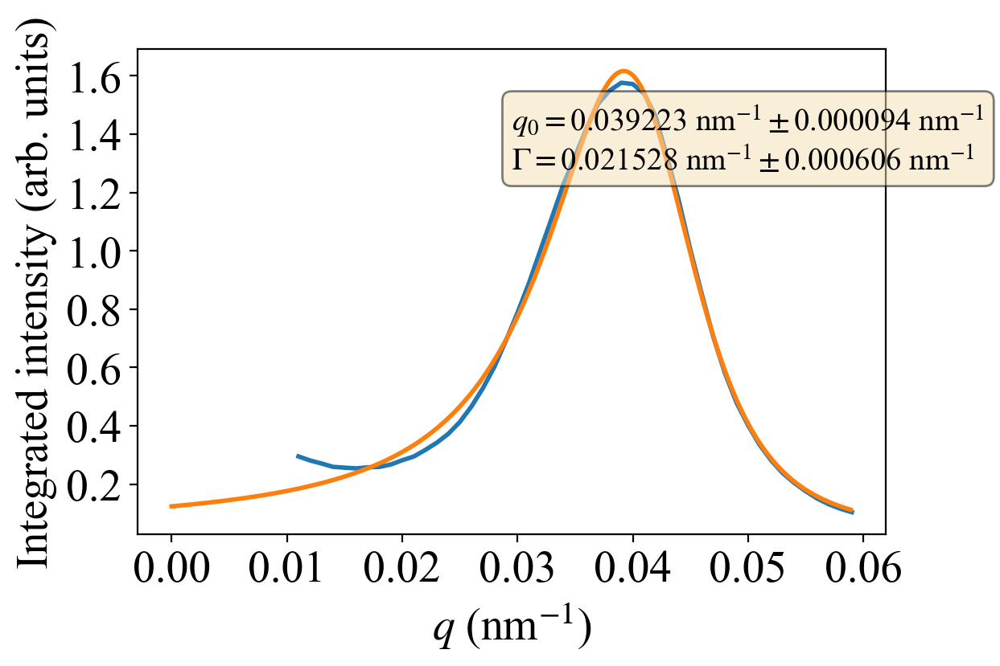

In [56]:
# Low cutoff
qcut_min = 0.01

# High cutoff
qcut_max = 0.06

# Remove data mask
Intensity_Cut = np.ones(np.size(Intensity_Int))
Intensity_Cut[q <= qcut_min] = 0
Intensity_Cut[q >= qcut_max] = 0
index = np.where(Intensity_Cut, True, False)

# Peak guess
q0 = q[np.argmax(Intensity_Int)]

# Minimum peak to fit
qmin = q0/2

# Model
model = 'LinAsymLorentzian'

#model = 'LinLorentzian_1'

#Fit
params, fit = ft.Fit_1D_Data(model, q, Intensity_Cut*Intensity_Avg, index, q0, qmin)

In [57]:
# Fit results
params

{'qpk': 0.03922277609824832,
 'dqpk': 9.44690947505781e-05,
 'Gamma': 0.021528088428192666,
 'dGamma': 0.0006056126999433492,
 'Q': 0,
 'dQ': 0,
 'Apk': array([1.07915403]),
 'dApk': array([0.021348]),
 'Other': array([ 0.19203502, 29.6297922 ]),
 'dOther': array([0.0228542 , 2.39356955])}

## Step 2: Multiply data by ring with roughly correct radius and width
#### Gives more weight to most important pixels

In [58]:
# 2D Lorentzian model (no lobes)
def Lorentzian2D_fit(xyflat, *args):
    u = xyflat[:,0]
    v = xyflat[:,1]
    q = np.sqrt(u**2+v**2)
    return (args[0]+args[3]/((q-args[1])**2/(args[2])**2+1))**2

# 2D Lorentzian model (no lobes)
def Lorentzian2D(qxx, qyy, *args):
    u = qxx
    v = qyy
    q = np.sqrt(u**2+v**2)
    return (args[0]+args[3]/((q-args[1])**2/(args[2])**2+1))**2

In [59]:
# Allocate parameters
pfit = (params['Other'][0], params['qpk'], params['Gamma'], params['Apk'][0])

# Build 2D ring fit
Ring = Lorentzian2D(qxx, qyy, *pfit)

# Normalize
Ring = Ring / params['Apk'][0]

# Mask data
step2 = image_masked * Ring

In [60]:
# Flatten data
step_ring = image_masked.flatten()
index = ~np.isnan(step_ring)

pfit = (params['Other'][0], params['qpk'], params['Gamma'], params['Apk'][0])

# Initial parameters and bounds
#                     'B'       'q0'    'Gamma'     'A0'        
p0   = np.array([pfit[0], pfit[1]*0.9, pfit[2],  pfit[3]])
B_lo = np.array([     0.,          0.,     0.,        0.])
B_hi = np.array([     1,   pfit[1]*2, pfit[2]*10.,   10.])
B = (B_lo, B_hi)

# Fit
popt, pcov = curve_fit(Lorentzian2D_fit, xyflat[index], step_ring[index], p0, bounds=B)
perr = np.sqrt(np.diag(pcov))
perr

array([2.12864926e-03, 5.95583890e-06, 2.61639119e-05, 2.00817924e-03])

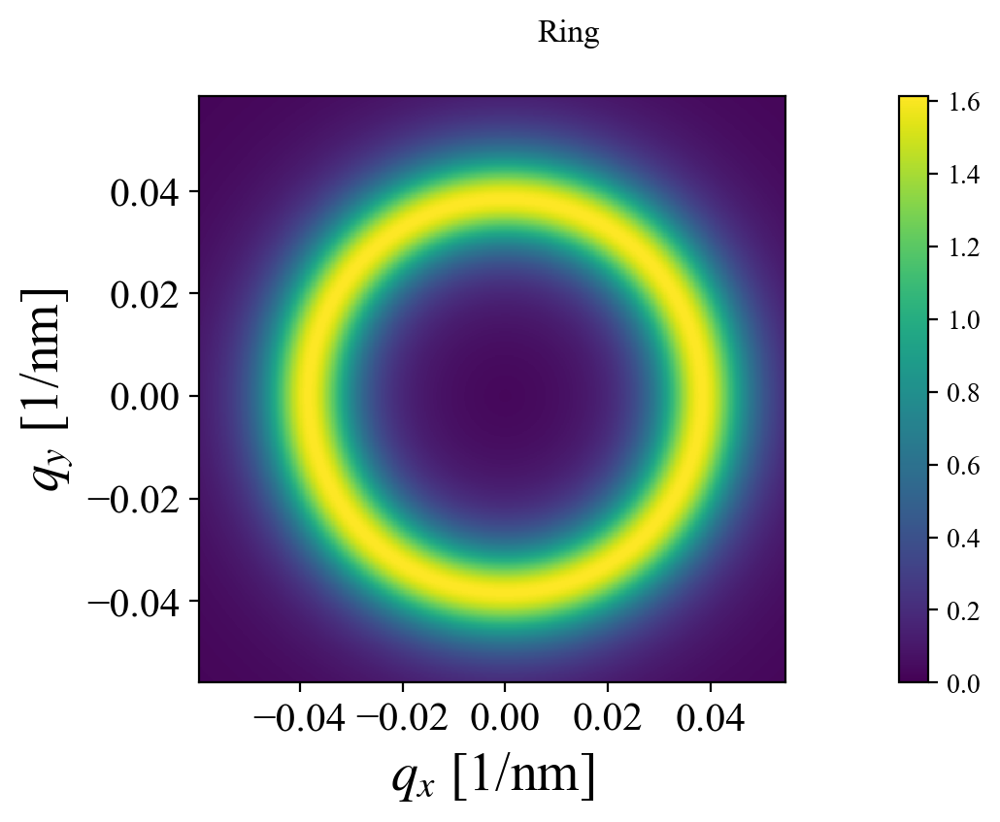

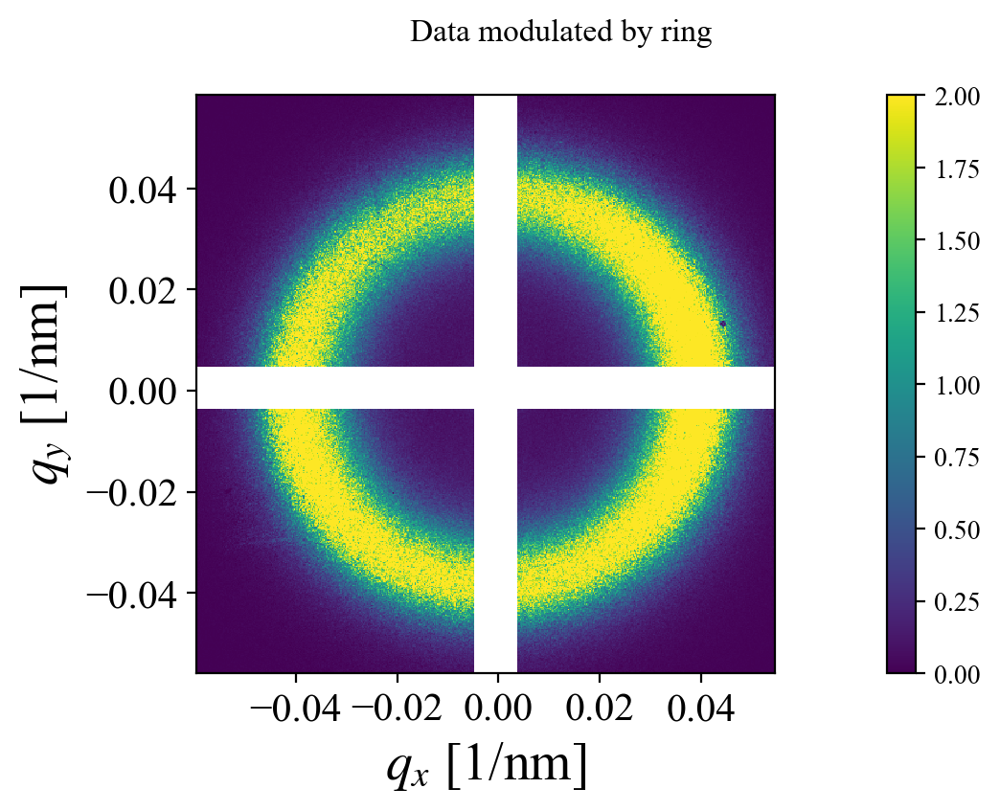

In [61]:
# Parameters
parameters = [popt[0], popt[1], popt[2], popt[3]]

# Compute final fit
Fit_ring = Lorentzian2D(qxx, qyy, *parameters)


# Plot final fit
plt.figure()
plt.pcolormesh(qxx, qyy, Fit_ring, vmin=0, #vmax=0.01,
               shading='auto')
plt.colorbar()
plt.axis('image')
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.suptitle('Ring')
plt.xlabel('$q_x$ [1/nm]',fontsize=20)
plt.ylabel('$q_y$ [1/nm]',fontsize=20)
plt.show()

# Plot
plt.figure()
plt.pcolormesh(qxx, qyy, step2, vmin=0, vmax=2, 
               shading='auto')
plt.colorbar()
plt.axis('image')
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.suptitle(f'Data modulated by ring')
plt.xlabel('$q_x$ [1/nm]',fontsize=20)
plt.ylabel('$q_y$ [1/nm]',fontsize=20)
plt.show()

## Step 3: Fit with lobed ring to determine azimuthal angle
#### Fixed params: ring radius, width, and radial asymmetry

In [62]:
# 2D Lorentzian with Lobes model
def Lorentzian2D_Lobe(xyflat, *args):
    u = xyflat[:,0]
    v = xyflat[:,1]
    global q0, Gamma, a   # Params defined outside this fctn; not adjusted when fitting
    global mask_flat, index   # Access mask and index defined outside this fctn
    theta = np.arctan2(u,v)
    q = np.sqrt(u**2+v**2)
    
    
    return ((args[0] +\
            np.abs(args[1])/((q-q0)**2/(Gamma)**2+1)+\
            (1/((q-q0)**2/(Gamma)**2+1))*\
            (np.abs(args[2])*(np.sin(theta-args[4]))**2 + args[3]*(np.sin(2*theta-2*args[4]))**2))**2)*mask_flat[index]

#     ring = args[0]+np.abs(args[3])/((q-q0)**2/(Gamma)**2+1)**2
    
#     second_lobe = 1/((q-q0)**2/(Gamma)**2+1)**2*((args[2])/2*(np.sin(2*theta-2*args[4])+1))
#     fourth_lobe = 1/((q-q0)**2/(Gamma)**2+1)**2*((args[3])/2*(np.sin(4*theta-4*args[4])+1))
#     return (ring + second_lobe + fourth_lobe)

# 2D Lorentzian Full model
def Lorentzian2D_Full(qxx, qyy, *args):
    u = qxx
    v = qyy
    theta = np.arctan2(u,v)
    q = np.sqrt(u**2+v**2)
    return (args[0]+\
            np.abs(args[3])/((q-args[1])**2/(args[2])**2+1)+\
            (1/((q-args[4])**2/(args[5])**2+1))*\
            (np.abs(args[6])*(np.sin(theta-args[8]))**2 + args[7]*(np.sin(2*theta-2*args[8]))**2))**2

#     ring = args[0]+np.abs(args[3])/((q-args[1])**2/(args[2])**2+1)**2
    
#     second_lobe = 1/((q-args[4])**2/(args[5])**2+1)**2*((args[6])/2*(np.sin(2*theta-2*args[8])+1))
#     fourth_lobe = 1/((q-args[4])**2/(args[5])**2+1)**2*((args[7])/2*(np.sin(4*theta-4*args[8])+1))
#     return (ring + second_lobe + fourth_lobe)

In [63]:
# Flatten data
step3 = step2.flatten()

# Define index of all points to use for fitting
index = ~np.isnan(step3)

# Lock ring radius, linewidth, and asymmetry
q0 = params['qpk']
Gamma = params['Gamma']
#a = params['Other'][1]

# Initial parameters and bounds
#                'B'    'A0'   'A1'   'A2'    'phi'
p0   = np.array([0.1,    5,     0,     0.,    np.pi*3/4])
B_lo = np.array([0.,     0.,    -1.,   -1,    0.])
B_hi = np.array([1,      20,    1,     1,     np.pi])
B = (B_lo, B_hi)
        
# Fit
popt, pcov = curve_fit(Lorentzian2D_Lobe, xyflat[index], step3[index], p0, bounds=B)

print('Fitted params')
print(popt)

perr = np.sqrt(np.diag(pcov))

print('Error')
print(perr)

Fitted params
[ 5.90212793e-22  1.14062884e+00  2.20167681e-01 -2.92818651e-02
  2.93260358e+00]
Error
[0.0028259  0.00367609 0.00207396 0.00195128 0.00402272]


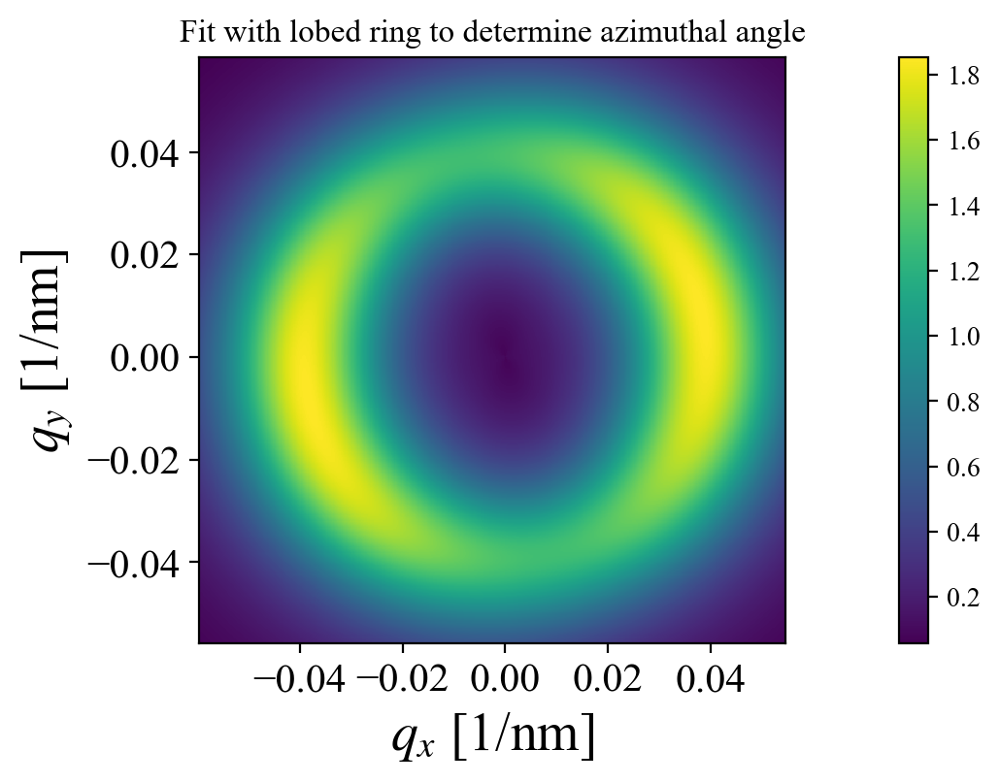

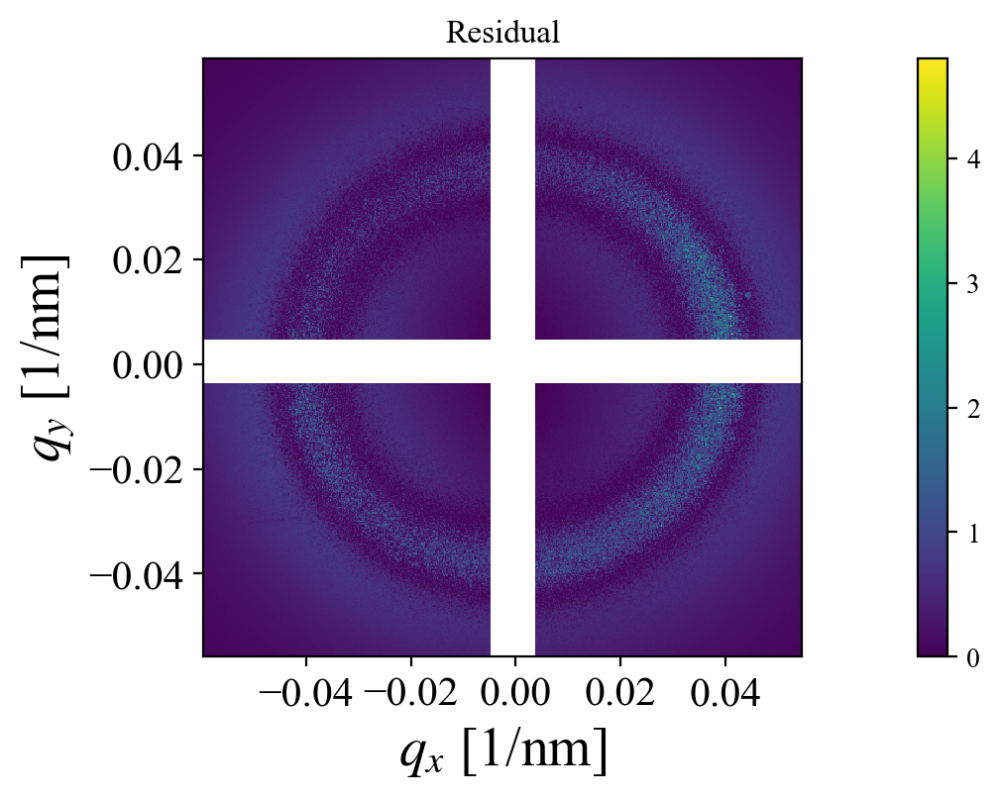

In [64]:
# Parameters
parameters = [popt[0], q0, Gamma, popt[1], q0, Gamma, abs(popt[2]), abs(popt[3]), popt[4]]

# Plot full fctn for params determined thus far
plt.pcolormesh(qxx, qyy, Lorentzian2D_Full(qxx, qyy, *parameters), #vmin=0, vmax=0.0001, 
               shading='auto')
plt.colorbar()
plt.axis('image')
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('$q_x$ [1/nm]',fontsize=20)
plt.ylabel('$q_y$ [1/nm]',fontsize=20)
plt.title('Fit with lobed ring to determine azimuthal angle')
plt.show()

residual = Lorentzian2D_Full(qxx, qyy, *parameters)*mask - step2
# Plot residuals
plt.figure()
plt.pcolormesh(qxx, qyy, np.abs(residual), vmin=0, #vmax=0.00001, 
               shading='auto')
plt.colorbar()
plt.axis('image')
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('$q_x$ [1/nm]',fontsize=20)
plt.ylabel('$q_y$ [1/nm]',fontsize=20)
plt.title('Residual')
plt.show()

## Step 4: Fit with lobed ring to determine radius and width
#### Fixed: lobe angle and radial asymmetry

In [65]:
# 2D Lorentzian with Lobes locked
def Lorentzian2D_Rings(xyflat, *args):
    u = xyflat[:,0]
    v = xyflat[:,1]
    global phi, a   # Params defined outside this fctn; not adjusted when fitting
    theta = np.arctan2(u,v)
    q = np.sqrt(u**2+v**2)
    return (args[0]+\
            np.abs(args[3])/((q-args[1])**2/(args[2])**2+1)+\
            (1/((q-args[4])**2/(args[5])**2+1))*\
            (np.abs(args[6])*(np.sin(theta-phi))**2 + args[7]*(np.sin(2*theta-2*phi))**2))**2

In [66]:
# Flatten data
image_masked = np.array(data_im_avged[0, :, :]*mask_nan*ring_mask)
step4 = image_masked.flatten()
index = ~np.isnan(step4)

# Lock the asymmetry and lobe angle
phi = popt[4]

# Initial parameters and bounds
#                'B'      'q0'   'Gamma'     'A0'     'q0'    'Gamma'    'A1'     'A2'
p0   = np.array([popt[0], q0*0.9, Gamma,     popt[1], q0*1.1, Gamma,     popt[2], popt[3]])
B_lo = np.array([0.,      0.,     0.,        0.,      0.,     0.,        -5,      -5.])
B_hi = np.array([5.,      q0*2,   Gamma*10., 20.,      q0*2,   Gamma*10., 5.,      5.])
B = (B_lo, B_hi)

# Fit
popt, pcov = curve_fit(Lorentzian2D_Rings, xyflat[index], step4[index], p0, bounds=B)
perr = np.sqrt(np.diag(pcov))

with np.printoptions(precision=4):
    print('CI')
    print(p0)
    print('fit')
    print(popt)
    print('Error')
    print(perr)

CI
[ 5.9021e-22  3.5300e-02  2.1528e-02  1.1406e+00  4.3145e-02  2.1528e-02
  2.2017e-01 -2.9282e-02]
fit
[ 0.0677  0.0374  0.0124  1.0879  0.0425  0.0045  0.3619 -0.0086]
Error
[2.0749e-03 8.2798e-06 3.1602e-05 2.0339e-03 1.6537e-05 2.3198e-05
 1.2465e-03 1.1405e-03]


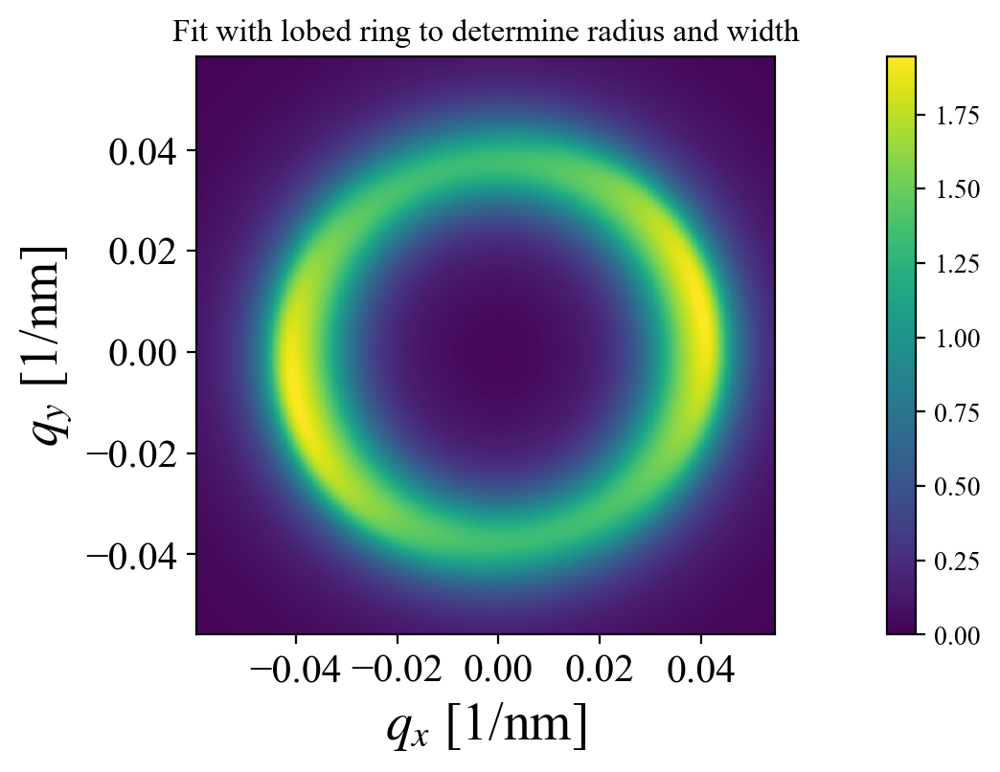

In [67]:
# Parameters
#parameters = [popt[0], popt[1], popt[2], a, popt[3], popt[4], popt[5], a, popt[6], popt[7], phi]
parameters = [popt[0], popt[1], popt[2], popt[3], popt[4], popt[5], popt[6], popt[7], phi]

# Plot
plt.figure()
plt.pcolormesh(qxx, qyy, Lorentzian2D_Full(qxx, qyy, *parameters), vmin=0, #vmax=0.01, 
               shading='auto')
plt.colorbar()
plt.axis('image')
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('$q_x$ [1/nm]',fontsize=20)
plt.ylabel('$q_y$ [1/nm]',fontsize=20)
plt.title('Fit with lobed ring to determine radius and width')
plt.show()

## Step 5: Fit with lobed ring, fixing only lobe angle

In [68]:
# 2D Symmetric Lorentzian Full model
def Lorentzian2D_RingsSym(xyflat, *args):
    u = xyflat[:,0]
    v = xyflat[:,1]
    global phi   # Param defined outside this fctn; not adjusted when fitting
    theta = np.arctan2(u,v)
    q = np.sqrt(u**2+v**2)
    return (args[0]+\
            np.abs(args[3])/((q-args[1])**2/(args[2])**2+1)+\
            (1/((q-args[4])**2/(args[5])**2+1))*\
            (np.abs(args[6])*(np.sin(theta-phi))**2 + args[7]*(np.sin(2*theta-2*phi))**2))**2

In [69]:
# Initial parameters and bounds
#                'B'         'q0'    'Gamma0'      'A0'     'q1'       'Gamma1'   'A1'     'A2'
p0   = np.array([popt[0],   popt[1],   popt[2],  popt[3],   popt[4],   popt[5], popt[6], popt[7]])
B_lo = np.array([     0.,        0.,        0.,       0.,        0.,        0.,      -5,     -5.])
B_hi = np.array([     5., popt[1]*2, popt[2]*5,       10., popt[4]*2, popt[5]*5,      5.,      5.])
B = (B_lo, B_hi)

# Fit
popt, pcov = curve_fit(Lorentzian2D_RingsSym, xyflat[index], step4[index], p0, bounds=B)
perr = np.sqrt(np.diag(pcov))

with np.printoptions(precision=4):
    print('CI')
    print(p0)
    print('fit')
    print(popt)
    print('Error')
    print(perr)

CI
[ 0.0677  0.0374  0.0124  1.0879  0.0425  0.0045  0.3619 -0.0086]
fit
[ 0.0677  0.0374  0.0124  1.0879  0.0425  0.0045  0.3619 -0.0086]
Error
[2.0749e-03 8.2798e-06 3.1602e-05 2.0339e-03 1.6537e-05 2.3198e-05
 1.2465e-03 1.1404e-03]


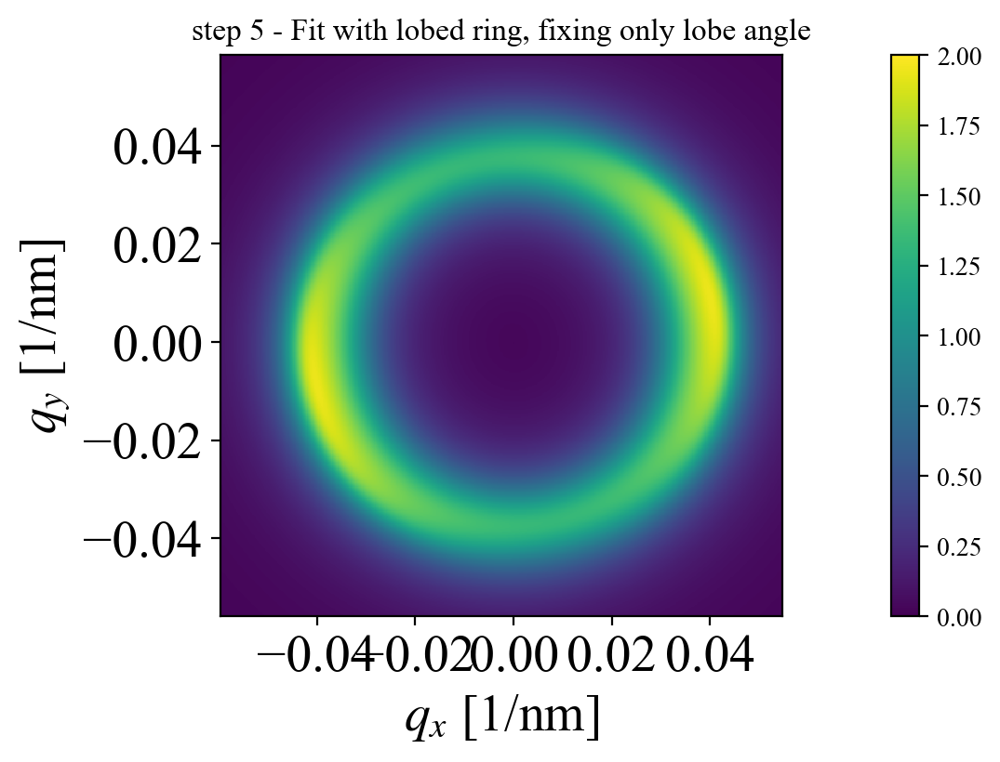

In [70]:
# Parameters
parameters = [popt[0], popt[1], popt[2], popt[3], popt[4], popt[5], popt[6], popt[7], phi]

# Plot
plt.figure()
plt.pcolormesh(qxx, qyy, Lorentzian2D_Full(qxx, qyy, *parameters), vmin=0, vmax=2, 
               shading='auto')
plt.colorbar()
plt.axis('image')
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlabel('$q_x$ [1/nm]',fontsize=20)
plt.ylabel('$q_y$ [1/nm]',fontsize=20)
plt.title('step 5 - Fit with lobed ring, fixing only lobe angle')
plt.show()

## Step 6: Fit even harmonics with good guesses

In [71]:
# 2D Asymmetric Lorentzian Full model
def Lorentzian2D_FullFit(xyflat, *args):
    u = xyflat[:,0]
    v = xyflat[:,1]
    theta = np.arctan2(u,v)
    q = np.sqrt(u**2+v**2)
    return (args[0]+\
            np.abs(args[3])/((q-args[1])**2/(args[2])**2+1)+\
            (1/((q-args[4])**2/(args[5])**2+1))*\
            (np.abs(args[6])*(np.sin(theta-args[8]))**2 + args[7]*(np.sin(2*theta-2*args[8]))**2))**2

In [72]:
def Lorentzian2D_FullFit_sum(xyflat, *args):
    u = xyflat[:,0]
    v = xyflat[:,1]
    theta = np.arctan2(u,v)
    q = np.sqrt(u**2+v**2)
    B = args[0]
    A_ring = (np.abs(args[3])/((q-args[1])**2/(args[2])**2+1))
    A_lobe = ((1/((q-args[4])**2/(args[5])**2+1))*\
            (np.abs(args[6])*(np.sin(theta-args[8]))**2 + args[7]*(np.sin(2*theta-2*args[8]))**2))
    return B + A_ring**2 + A_lobe**2

def Lorentzian2D_FullFit_interference(xyflat, *args):
    u = xyflat[:,0]
    v = xyflat[:,1]
    theta = np.arctan2(u,v)
    q = np.sqrt(u**2+v**2)
    B = args[0]
    A_ring = (np.abs(args[3])/((q-args[1])**2/(args[2])**2+1))
    A_lobe = ((1/((q-args[4])**2/(args[5])**2+1))*\
            (np.abs(args[6])*(np.sin(theta-args[8]))**2 + args[7]*(np.sin(2*theta-2*args[8]))**2))
    CT = args[9] * A_ring * A_lobe * np.cos(theta-args[10])
    return B + A_ring**2 + A_lobe**2 + CT

In [73]:
# 2D Lorentzian Full model
def Lorentzian2D_Full(qxx, qyy, *args):
    u = qxx
    v = qyy
    theta = np.arctan2(u,v)
    q = np.sqrt(u**2+v**2)
    return (args[0]+\
            np.abs(args[3])/((q-args[1])**2/(args[2])**2+1)+\
            (1/((q-args[4])**2/(args[5])**2+1))*\
            (np.abs(args[6])*(np.sin(theta-args[8]))**2 + args[7]*(np.sin(2*theta-2*args[8]))**2))**2

def Lorentzian2D_Full_sum(qxx, qyy, *args):
    u = qxx
    v = qyy
    theta = np.arctan2(u,v)
    q = np.sqrt(u**2+v**2)
    return (args[0])+\
            (np.abs(args[3])/((q-args[1])**2/(args[2])**2+1))**2+\
            ((1/((q-args[4])**2/(args[5])**2+1))*\
            (np.abs(args[6])*(np.sin(theta-args[8]))**2 + args[7]*(np.sin(2*theta-2*args[8]))**2))**2

def Lorentzian2D_Full_interference(qxx, qyy, *args):
    u = qxx
    v = qyy
    theta = np.arctan2(u,v)
    q = np.sqrt(u**2+v**2)
    B = args[0]
    A_ring = (np.abs(args[3])/((q-args[1])**2/(args[2])**2+1))
    A_lobe = ((1/((q-args[4])**2/(args[5])**2+1))*\
            (np.abs(args[6])*(np.sin(theta-args[8]))**2 + args[7]*(np.sin(2*theta-2*args[8]))**2))
    CT = args[9] * A_ring * A_lobe * np.cos(theta-args[10])
    return B + A_ring**2 + A_lobe**2 + CT

# 2D Lorentzian model (no lobes)
def Lorentzian2D(qxx, qyy, *args):
    u = qxx
    v = qyy
    q = np.sqrt(u**2+v**2)
    return (args[2]/((q-args[0])**2/(args[1])**2+1))**2

#def Lorentzian2D(qxx, qyy, *args):
#    u = qxx
#    v = qyy
#    q = np.sqrt(u**2+v**2)
#    return (args[0]+args[3]/((q-args[1])**2/(args[2])**2+1))**2


# 2D Lorentzian with Lobes model
def Lorentzian2D_Lobe(qxx, qyy, *args):
    u = qxx
    v = qyy
    q = np.sqrt(u**2+v**2)
    theta = np.arctan2(u,v)
    #q = np.sqrt(u**2+v**2)
    return ((1/((q-args[0])**2/(args[1])**2+1))*\
            (np.abs(args[2])*(np.sin(theta-args[4]))**2 + args[3]*(np.sin(2*theta-2*args[4]))**2))**2

### Fitting Symmetric Lorentzian with only 2nd and 4th harmonic to first frame

In [74]:
# Fitting symmetric lorentzian with 2nd and 4th harmonic

image_masked = np.array(data_im_avged[0, :, :]*mask_nan*ring_mask)
# Flatten data
step4 = image_masked.flatten()
index = ~np.isnan(step4)

# Initial parameters and bounds
#                'B'      'q0'     'Gamma0'  'A0'     'q1'      'Gamma1'    'A1'     'A2'   'phi'
p0   = np.array([popt[0], popt[1], popt[2], popt[3], popt[4], popt[5], popt[6], popt[7],   phi])
B_lo = np.array([     0.,      0.,      0.,      0.,      0.,      0.,     -5.,     -5.,    0.])
B_hi = np.array([     5.,      1.,     10.,      10.,      1.,     10.,      5.,      5., np.pi])
B = (B_lo, B_hi)

# Fit
popt_full, pcov_full = curve_fit(Lorentzian2D_FullFit, xyflat[index], step4[index], p0, bounds=B)
perr_full = np.sqrt(np.diag(pcov_full))
with np.printoptions(precision=4):
    #print('B        q0        Gamma0       A0        q1     Gamma1       A1    A2   phi')
    print('CI of full interference')
    print(p0)
    print('fit of full interference')
    print(popt_full)
    print('error of full interference')
    print(perr_full)


CI of full interference
[ 0.0677  0.0374  0.0124  1.0879  0.0425  0.0045  0.3619 -0.0086  2.9326]
fit of full interference
[ 0.0676  0.0374  0.0124  1.0883  0.0425  0.0045  0.3609 -0.0088  2.9178]
error of full interference
[2.0734e-03 8.2548e-06 3.1552e-05 2.0312e-03 1.6532e-05 2.3187e-05
 1.2485e-03 1.1315e-03 1.5469e-03]


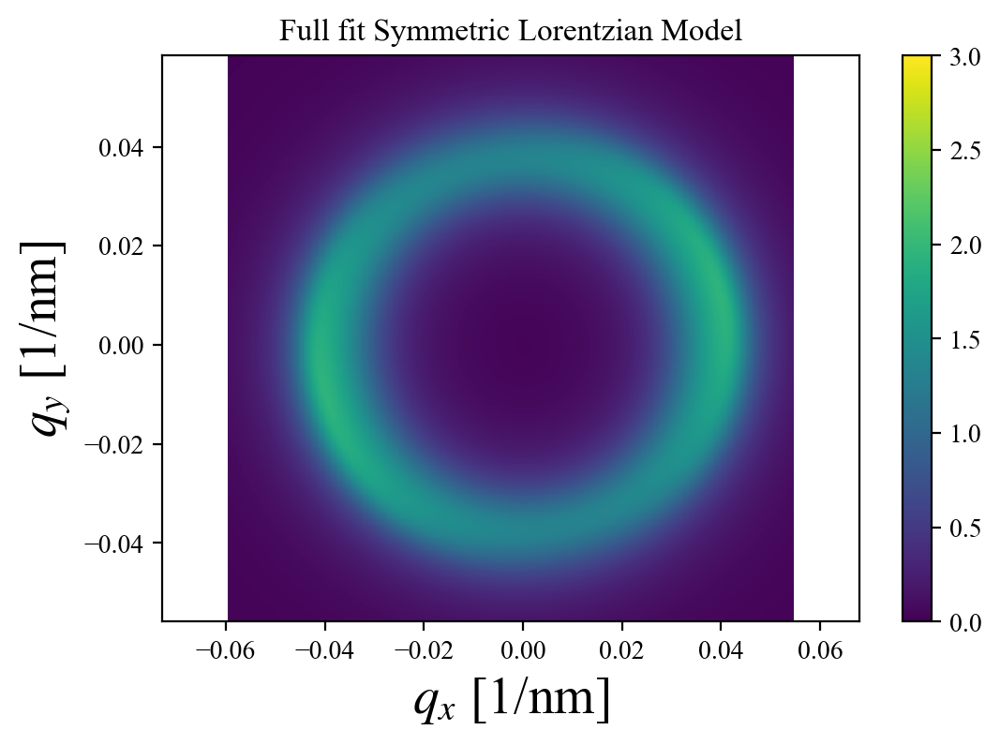

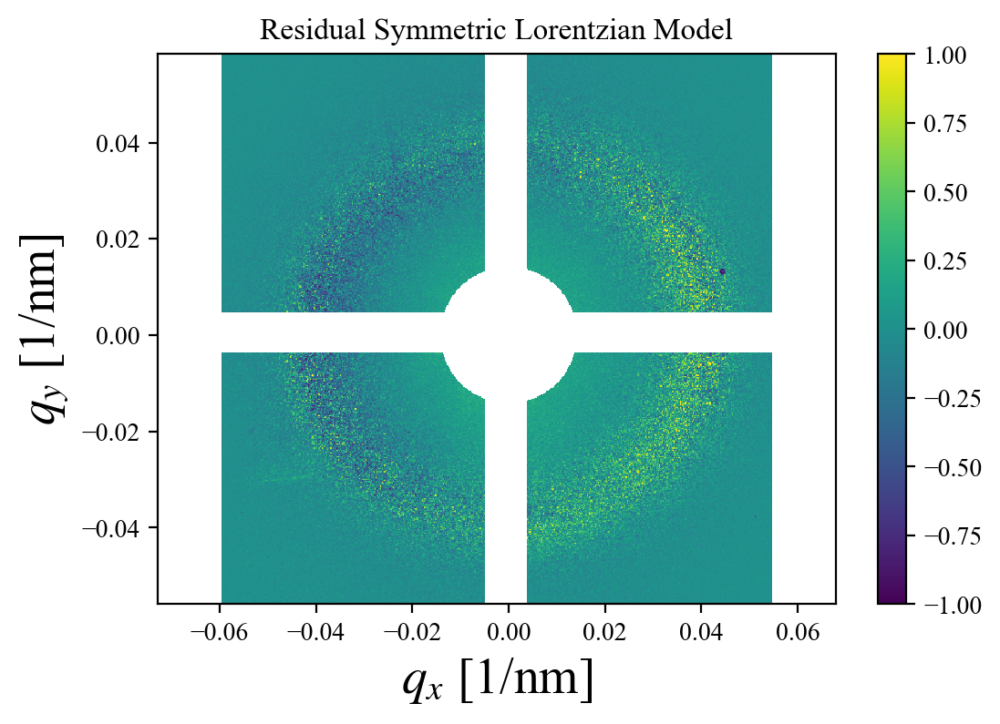

In [75]:
# Parameters
index_images = 0
parameters = [popt_full[0], popt_full[1], popt_full[2], popt_full[3],\
              popt_full[4], popt_full[5], popt_full[6], popt_full[7], popt_full[8]]

# Compute final fit
Fit_full = Lorentzian2D_Full(qxx, qyy, *parameters)

%matplotlib inline
plt.rcParams['figure.dpi']= 200
# Plot the final fit
plt.pcolormesh(qx, qy, Fit_full, vmin=0, vmax=3, shading='auto')
plt.colorbar()
plt.axis('equal')
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.xlabel('$q_x$ [1/nm]',fontsize=20)
plt.ylabel('$q_y$ [1/nm]',fontsize=20)
plt.title('Full fit Symmetric Lorentzian Model')
plt.show()
image_masked = np.array(data_im_avged[index_images, :, :]*mask_nan*ring_mask)

# Plot final residual
plt.pcolormesh(qx, qy, image_masked - Fit_full, vmin=-1, vmax=1, shading='auto')
plt.colorbar()
plt.axis('equal')
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.xlabel('$q_x$ [1/nm]',fontsize=20)
plt.ylabel('$q_y$ [1/nm]',fontsize=20)
plt.title('Residual Symmetric Lorentzian Model')
plt.show()

## Step7 Fitting odd harmonics only to the residual

In [76]:
# 2D Symmetric Lorentzian with two odd and two even harmonics
def Lorentzian2D_OddHarmFit(xyflat, *args):
    u = xyflat[:,0]
    v = xyflat[:,1]
    theta = np.arctan2(u,v)
    q = np.sqrt(u**2+v**2)
    
    backg = args[0]
    first_lobe = 1/((q-args[1])**2/(args[2])**2+1)**2*(abs(args[3])/2*(np.cos(theta-args[5])))
    #sharp
    third_lobe = 1/((q-args[1])**2/(args[2])**2+1)**2*(abs(args[4])/2*(np.cos(3*theta-3*args[5])))
    #Blunt
    #third_lobe = 1/((q-args[1])**2/(args[2])**2+1)**2*(abs(args[4])/2*(np.sin(3*theta-3*args[5]+3*2*np.pi*0)))
    
    return backg + first_lobe + third_lobe

In [77]:
# Fitting symmetric lorentzian with 1nd and 3th harmonic on residual
residual = image_masked - Fit_full

residual_masked = np.array(residual*mask_nan*ring_mask)
# Flatten data
step6 = residual_masked.flatten()
index = ~np.isnan(step6)

# Initial parameters and bounds
#                    'B'             'q1'           'Gamma1'               'A1'                    'A3'                'phi1'
#p0   = np.array([popt_full[0],   popt_full[4],   popt_full[5]*2,     popt_full[6]/5,         popt_full[7]/5,      popt_full[8]])
p0   = np.array([popt_full[0],   popt_full[4],   popt_full[5]*2,    abs(popt_full[6]),    abs(popt_full[7])/5,            0])
B_lo = np.array([     0.,              0.,              0.,                  0.,                     0.,                   0.])
B_hi = np.array([     1.,              1.,             10.,                  1.,                     1.,                np.pi])
B = (B_lo, B_hi)

# Fit
popt_res, pcov_res = curve_fit(Lorentzian2D_OddHarmFit, xyflat[index], step6[index], p0, bounds=B)
perr_res = np.sqrt(np.diag(pcov_res))
with np.printoptions(precision=4):
    #print('B        q0        Gamma0       A0        q1     Gamma1       A1    A2   phi')
    print('CI of full interference')
    print(p0)
    print('fit of full interference')
    print(popt_res)
    print('error of full interference')
    print(perr_res)


CI of full interference
[0.0676 0.0425 0.0089 0.3609 0.0018 0.    ]
fit of full interference
[1.7911e-04 3.7565e-02 9.5556e-03 4.4761e-01 9.0006e-21 1.9599e+00]
error of full interference
[3.1857e-04 4.0126e-05 7.9861e-05 2.8574e-03 2.2131e-03 4.9453e-03]


In [78]:
# 2D Symmetric Lorentzian with two odd and two even harmonics
def Lorentzian2D_OddHarmPlot(qxx, qyy, *args):
    u = qxx
    v = qyy
    theta = np.arctan2(u,v)
    q = np.sqrt(u**2+v**2)
    
    backg = args[0]
    first_lobe = 1/((q-args[1])**2/(args[2])**2+1)**2*(abs(args[3])/2*(np.cos(theta-args[5])))
    #sharp
    third_lobe = 1/((q-args[1])**2/(args[2])**2+1)**2*(abs(args[4])/2*(np.cos(3*theta-3*args[5])))
    #Blunt
    #third_lobe = 1/((q-args[1])**2/(args[2])**2+1)**2*(abs(args[4])/2*(np.sin(3*theta-3*args[5]+3*2*np.pi*0)))
    
    return backg + first_lobe + third_lobe

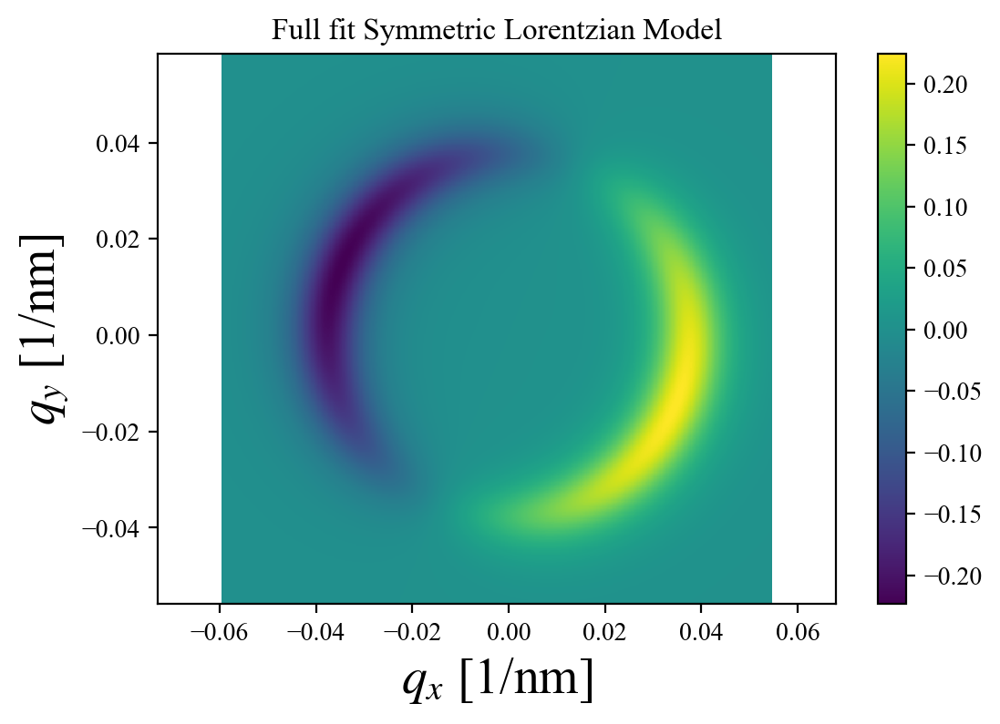

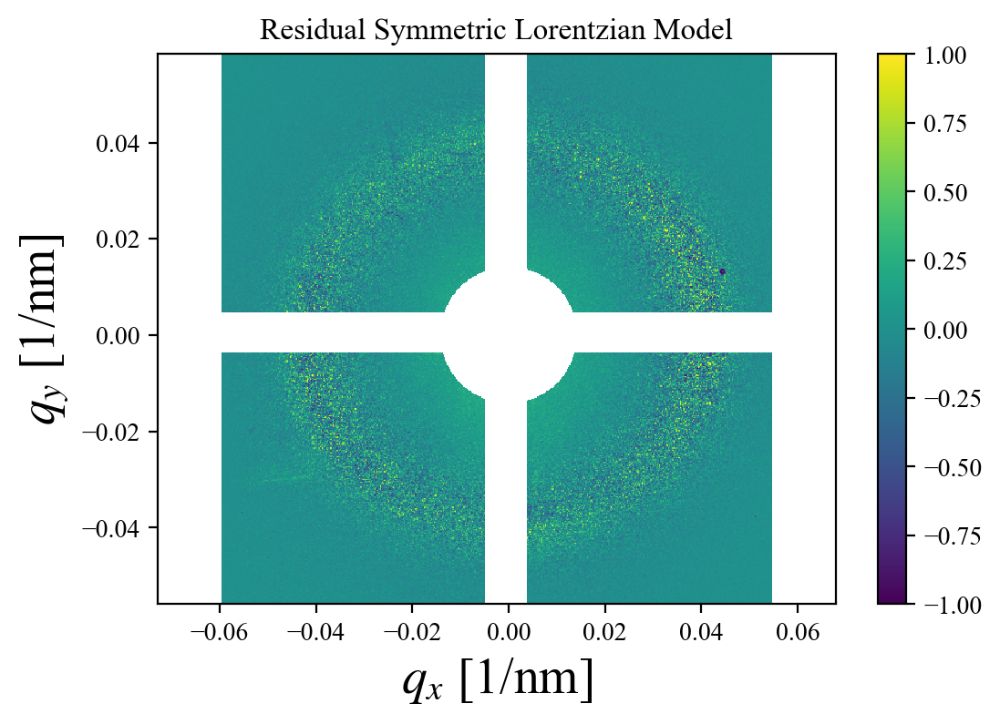

In [79]:
# Parameters
parameters = [popt_res[0], popt_res[1], popt_res[2], popt_res[3],\
              popt_res[4], popt_res[5]]

# Compute final fit
Fit_res = Lorentzian2D_OddHarmPlot(qxx, qyy, *parameters)

%matplotlib inline
plt.rcParams['figure.dpi']= 200
# Plot the final fit
plt.pcolormesh(qx, qy, Fit_res,  shading='auto')
plt.colorbar()
plt.axis('equal')
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.xlabel('$q_x$ [1/nm]',fontsize=20)
plt.ylabel('$q_y$ [1/nm]',fontsize=20)
plt.title('Full fit Symmetric Lorentzian Model')
plt.show()
image_masked = np.array(data_im_avged[index_images, :, :]*mask_nan)

# Plot final residual
plt.pcolormesh(qx, qy, residual*mask_nan-Fit_res, vmin=-1, vmax=1, shading='auto')
plt.colorbar()
plt.axis('equal')
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.xlabel('$q_x$ [1/nm]',fontsize=20)
plt.ylabel('$q_y$ [1/nm]',fontsize=20)
plt.title('Residual Symmetric Lorentzian Model')
plt.show()

## Step8 Fit all four harmonics

In [80]:
# 2D Symmetric Lorentzian with two odd and two even harmonics
def Lorentzian2D_FourHarmFit(xyflat, *args):
    u = xyflat[:,0]
    v = xyflat[:,1]
    theta = np.arctan2(u,v)
    q = np.sqrt(u**2+v**2)
    
    # Oth har or ring
    ring = args[0]+np.abs(args[3])/((q-args[1])**2/(args[2])**2+1)**2

    # First har
    first_lobe = 1/((q-args[4])**2/(args[5])**2+1)**2*(np.abs(args[6])/2*(np.cos(theta-args[8])+1))
    
    #3rd har
    third_lobe = 1/((q-args[4])**2/(args[5])**2+1)**2*(np.abs(args[7])/2*(np.cos(3*theta-3*args[8])+1))
    
    # 2nd har
    second_lobe = 1/((q-args[9])**2/(args[10])**2+1)**2*(np.abs(args[11])/2*(np.cos(2*theta-2*args[13])+1))
    
    #4th har
    fourth_lobe = 1/((q-args[9])**2/(args[10])**2+1)**2*(np.abs(args[12])/2*(np.cos(4*theta-4*args[13])+1))
    
    return ring + first_lobe + third_lobe + second_lobe + fourth_lobe

In [81]:
# Fitting symmetric lorentzian with 2nd and 4th harmonic

image_masked = np.array(data_im_avged[0, :, :]*mask_nan*ring_mask)
# Flatten data
step8 = image_masked.flatten()
index = ~np.isnan(step8)

# Initial parameters and bounds
#                     'B'              'q0'         'Gamma0'         'A0'          'q1'        'Gamma1'         'A1'           'A3'          'phi1'         'q2'         'Gamma2'         'A2'           'A4'          'phi2'
p0   = np.array([popt_full[0]/10,  popt_full[1],  popt_full[2],  popt_full[3],  popt_res[1],  popt_res[2],  popt_res[3],  popt_res[4]/5,  popt_res[5],  popt_full[4],  popt_full[5],  popt_full[6],  popt_full[7],      np.pi/2])
B_lo = np.array([     0.,               0.,             0.,            0.,           0.,           0.,           0.,            0.,             0.,           0.,            0.,           0.,             0.,               0.])
B_hi = np.array([     1.,               1.,            10.,           10.,           1.,          10.,           5.,            5.,          np.pi,           1.,           10.,           5.,             5.,            np.pi])
B = (B_lo, B_hi)

# Fit
popt_fourHar, pcov_fourHar = curve_fit(Lorentzian2D_FourHarmFit, xyflat[index], step4[index], np.abs(p0), bounds=B)
#popt_fourHar, pcov_fourHar = curve_fit(Lorentzian2D_FourHarmFitInterf, xyflat[index], step4[index], p0, bounds=B)
perr_fourHar = np.sqrt(np.diag(pcov_fourHar))
with np.printoptions(precision=4):
    #print('B        q0        Gamma0       A0        q1     Gamma1       A1    A2   phi')
    print('CI of full interference')
    print(p0)
    print('fit of full interference')
    print(popt_fourHar)
    print('error of full interference')
    print(perr_fourHar)


CI of full interference
[ 6.7634e-03  3.7365e-02  1.2379e-02  1.0883e+00  3.7565e-02  9.5556e-03
  4.4761e-01  1.8001e-21  1.9599e+00  4.2511e-02  4.4736e-03  3.6093e-01
 -8.7805e-03  1.5708e+00]
fit of full interference
[2.0904e-02 3.6681e-02 1.3958e-02 1.0530e+00 3.8204e-02 8.3855e-03
 4.7919e-01 2.8248e-13 1.9524e+00 4.1932e-02 6.6584e-03 8.2187e-01
 9.9320e-02 1.3456e+00]
error of full interference
[8.0426e-04 1.2914e-05 3.3143e-05 2.1046e-03 3.1641e-05 5.8784e-05
 2.7644e-03 2.3106e-03 4.8414e-03 1.3738e-05 2.2981e-05 2.5793e-03
 2.3402e-03 1.3892e-03]


In [82]:
# 2D Symmetric Lorentzian with two odd and two even harmonics
def Lorentzian2D_FourHarmPlot(qxx, qyy,return_flag, *args):
    # return_flag : 'all', 'ring', 'odd', 'even'
    u = qxx
    v = qyy
    theta = np.arctan2(u,v)
    q = np.sqrt(u**2+v**2)
    
    ring = args[0]+np.abs(args[3])/((q-args[1])**2/(args[2])**2+1)**2

    first_lobe = 1/((q-args[4])**2/(args[5])**2+1)**2*(np.abs(args[6])/2*(np.cos(theta-args[8])+1))
    
    third_lobe = 1/((q-args[4])**2/(args[5])**2+1)**2*(np.abs(args[7])/2*(np.cos(3*theta-3*args[8])+1))
    
    second_lobe = 1/((q-args[9])**2/(args[10])**2+1)**2*(np.abs(args[11])/2*(np.cos(2*theta-2*args[13])+1))

    fourth_lobe = 1/((q-args[9])**2/(args[10])**2+1)**2*(np.abs(args[12])/2*(np.cos(4*theta-4*args[13])+1))
    
    if return_flag == 'all':
        return ring + first_lobe + third_lobe + second_lobe + fourth_lobe
    elif return_flag == 'ring':
        return ring
    elif return_flag == 'odd':
        return first_lobe + third_lobe
    elif return_flag == 'even':
        return second_lobe + fourth_lobe

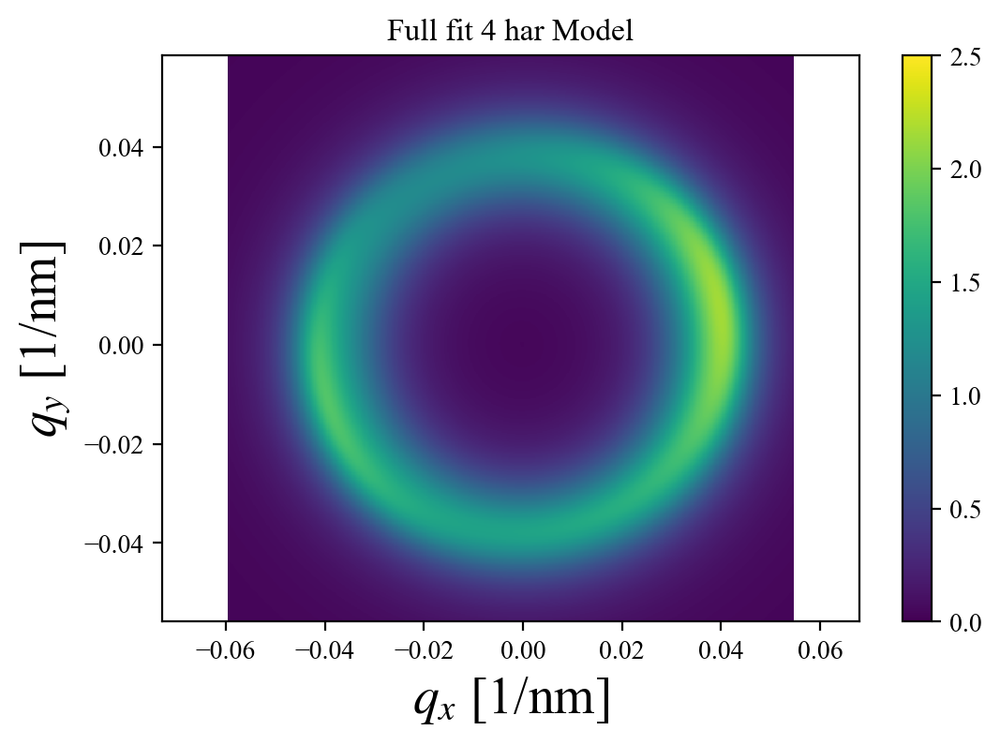

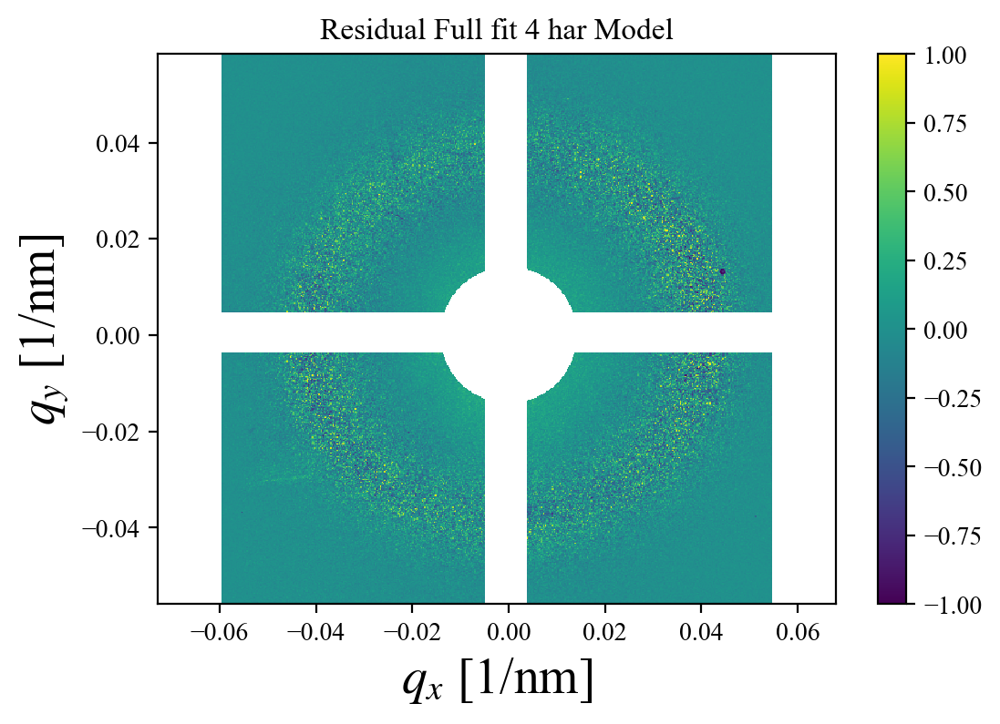

In [83]:
# Parameters
index_images = 0
parameters = [popt_fourHar[0], popt_fourHar[1], popt_fourHar[2], popt_fourHar[3], popt_fourHar[4], popt_fourHar[5], popt_fourHar[6],\
              popt_fourHar[7], popt_fourHar[8], popt_fourHar[9], popt_fourHar[10], popt_fourHar[11], popt_fourHar[12],  popt_fourHar[13]]

# Compute final fit
Fit_fourHar = Lorentzian2D_FourHarmPlot(qxx, qyy,'all', *parameters)

%matplotlib inline
plt.rcParams['figure.dpi']= 200
# Plot the final fit
#plt.pcolormesh(qx, qy, Fit_fourHar, vmin=0, vmax=2, shading='auto')
plt.pcolormesh(qx, qy, Fit_fourHar, vmin=0, vmax=2.5, shading='auto')
plt.colorbar()
plt.axis('equal')
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.xlabel('$q_x$ [1/nm]',fontsize=20)
plt.ylabel('$q_y$ [1/nm]',fontsize=20)
plt.title('Full fit 4 har Model')
plt.show()
image_masked = np.array(data_im_avged[index_images, :, :]*mask_nan*ring_mask)

# Plot final residual
plt.pcolormesh(qx, qy, image_masked - Fit_fourHar, vmin=-1, vmax=1, shading='auto')
plt.colorbar()
plt.axis('equal')
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.xlabel('$q_x$ [1/nm]',fontsize=20)
plt.ylabel('$q_y$ [1/nm]',fontsize=20)
plt.title('Residual Full fit 4 har Model')
plt.show()

### Fitting all images in the scan in for loop with seed parameters from one image 2D fit

In [84]:
for i in range (0, np.shape(final_delay_time)[0]):
    
    
    print(f'==Fitting image no {i}==')
    image_masked = np.array(data_im_avged[i, :, :]*mask_nan*ring_mask)
    # Flatten data
    step4 = image_masked.flatten()
    index = ~np.isnan(step4)
    
    # Initial parameters and bounds
    #                      'B'               'q0'          'Gamma0'             'A0'               'q1'            'Gamma1'            'A1'             'A3'              'phi1'            'q2'             'Gamma2'             'A2'               'A4'             'phi2'
    p0   = np.array([popt_fourHar[0],  popt_fourHar[1],  popt_fourHar[2],  popt_fourHar[3],  popt_fourHar[4],  popt_fourHar[5],  popt_fourHar[6],  popt_fourHar[7],  popt_fourHar[8],  popt_fourHar[9],  popt_fourHar[10],  popt_fourHar[11],  popt_fourHar[12],  popt_fourHar[13]])
    B_lo = np.array([      0.,                0.,             0.,                0.,               0.,               0.,               0.,               0.,              0.,                0.,                0.,               0.,                0.,                       0.])
    B_hi = np.array([      1.,                1.,             10.,               10.,              1.,              10.,               5.,               5.,           np.pi,                1.,               10.,               5.,                5.,                    np.pi])
    B = (B_lo, B_hi)

    # Fit
    popt_full, pcov_full = curve_fit(Lorentzian2D_FourHarmFit, xyflat[index], step4[index], p0, bounds=B)
    perr_full = np.sqrt(np.diag(pcov_full))
    with np.printoptions(precision=4):
        #print('B        q0        Gamma0       A0        q1     Gamma1       A1    A2   phi')
        print('CI of full interference')
        print(p0)
        print('fit of full interference')
        print(popt_full)
        print('error of full interference')
        print(perr_full)
        
    if i == 0:
        # Needed for naming the save file for fit parameters
        fit_type = 0
        
        # Creating empty np array to store the fit parameters
        popt_list = np.empty((np.shape(final_delay_time)[0], np.shape(popt_full)[0]), dtype = np.float32)
        pcov_list = np.empty((np.shape(final_delay_time)[0], np.shape(pcov_full)[0], np.shape(pcov_full)[1]), dtype = np.float32)
        perr_list = np.empty((np.shape(final_delay_time)[0], np.shape(perr_full)[0]), dtype = np.float32)
    popt_list[i] = popt_full
    pcov_list[i] = pcov_full
    perr_list[i] = perr_full

==Fitting image no 0==
CI of full interference
[2.0904e-02 3.6681e-02 1.3958e-02 1.0530e+00 3.8204e-02 8.3855e-03
 4.7919e-01 2.8248e-13 1.9524e+00 4.1932e-02 6.6584e-03 8.2187e-01
 9.9320e-02 1.3456e+00]
fit of full interference
[2.0904e-02 3.6681e-02 1.3958e-02 1.0530e+00 3.8204e-02 8.3856e-03
 4.7919e-01 1.4346e-14 1.9525e+00 4.1932e-02 6.6584e-03 8.2187e-01
 9.9319e-02 1.3456e+00]
error of full interference
[8.0427e-04 1.2914e-05 3.3143e-05 2.1046e-03 3.1641e-05 5.8785e-05
 2.7644e-03 2.3106e-03 4.8414e-03 1.3738e-05 2.2981e-05 2.5793e-03
 2.3402e-03 1.3892e-03]
==Fitting image no 1==
CI of full interference
[2.0904e-02 3.6681e-02 1.3958e-02 1.0530e+00 3.8204e-02 8.3855e-03
 4.7919e-01 2.8248e-13 1.9524e+00 4.1932e-02 6.6584e-03 8.2187e-01
 9.9320e-02 1.3456e+00]
fit of full interference
[1.8799e-02 3.6666e-02 1.3911e-02 1.0553e+00 3.8164e-02 8.4399e-03
 4.7447e-01 6.9968e-20 1.9413e+00 4.1911e-02 6.6287e-03 8.0645e-01
 9.9813e-02 1.3455e+00]
error of full interference
[8.2626e-04 

# Plotting Stuff

In [85]:
def plot_errorbars(x, y, yerr, **kwargs):
    #import pdb ; pdb.set_trace()
    p = plt.plot(x, y)
    pfb = plt.fill_between(x, y - yerr, y + yerr, **kwargs)
    return p

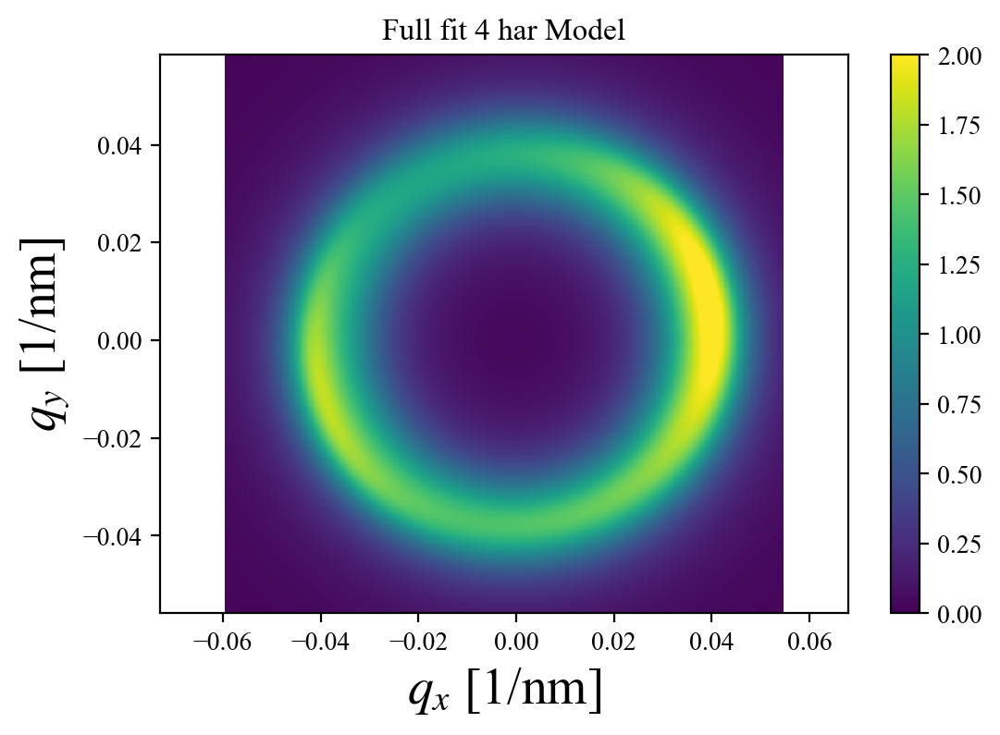

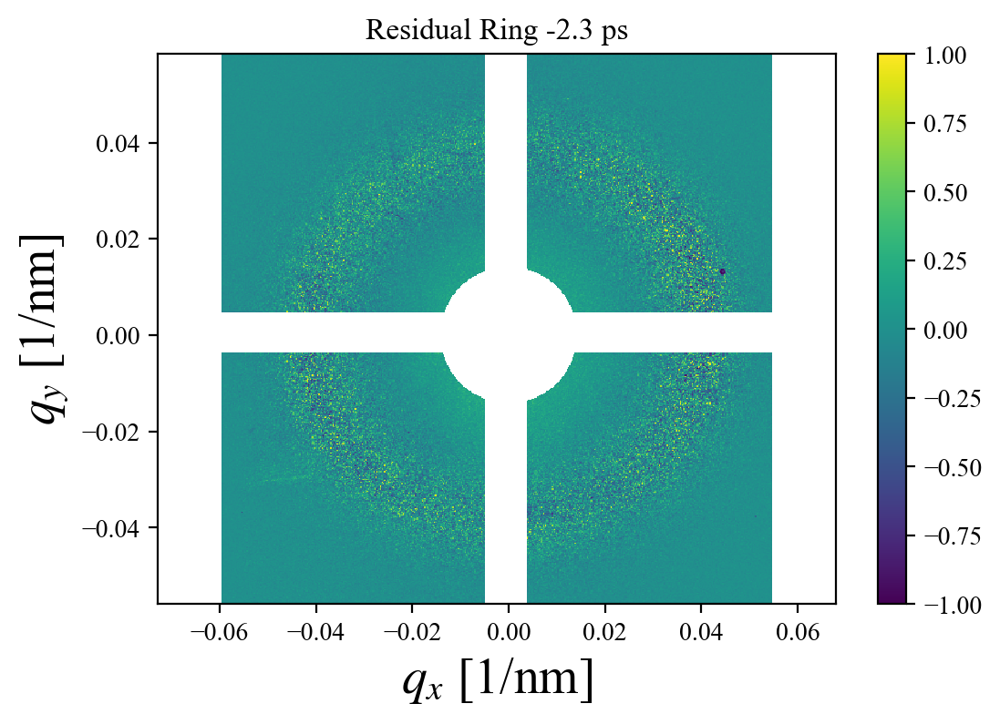

In [86]:
# Parameters
index_images = 0
parameters = [popt_list[index_images][0], popt_list[index_images][1], popt_list[index_images][2], popt_list[index_images][3],\
              popt_list[index_images][4], popt_list[index_images][5], popt_list[index_images][6], popt_list[index_images][7], popt_list[index_images][8],\
             popt_list[index_images][9], popt_list[index_images][10], popt_list[index_images][11], popt_list[index_images][12], popt_list[index_images][13]]

# Compute final fit
Fit_fourHar = Lorentzian2D_FourHarmPlot(qxx, qyy,'all', *parameters)

%matplotlib inline
plt.rcParams['figure.dpi']= 200
# Plot the final fit
#plt.pcolormesh(qx, qy, Fit_fourHar, vmin=0, vmax=2, shading='auto')
plt.pcolormesh(qx, qy, Fit_fourHar, vmin=0, vmax=2.0, shading='auto')
plt.colorbar()
plt.axis('equal')
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.xlabel('$q_x$ [1/nm]',fontsize=20)
plt.ylabel('$q_y$ [1/nm]',fontsize=20)
plt.title('Full fit 4 har Model')
#plt.title('2nd + 4th')
plt.show()

image_masked = np.array(data_im_avged[index_images, :, :]*mask_nan*ring_mask)

# Plot final residual
#plt.pcolormesh(qx, qy, image_masked - Fit_fourHar, vmin=-0.5, vmax=0.5, shading='auto')
plt.pcolormesh(qx, qy, image_masked - Fit_fourHar, vmin=-1, vmax=1, shading='auto')
plt.colorbar()
plt.axis('equal')
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.xlabel('$q_x$ [1/nm]',fontsize=20)
plt.ylabel('$q_y$ [1/nm]',fontsize=20)
plt.title('Residual Ring -2.3 ps')
plt.show()

## Plotting figure for manuscript

In [87]:
# %matplotlib inline
plt.rcParams['figure.figsize'] = (25, 14)

In [88]:
# ticksize = {'xtick': 20, 'ytick' : 20}
# labelsize = {'xlabel': 24, 'ylabel' : 24}

# legend_size = 20
# title_size = 24
# text_caption_size = 24
# lbl_ln_fnt_sze = 20

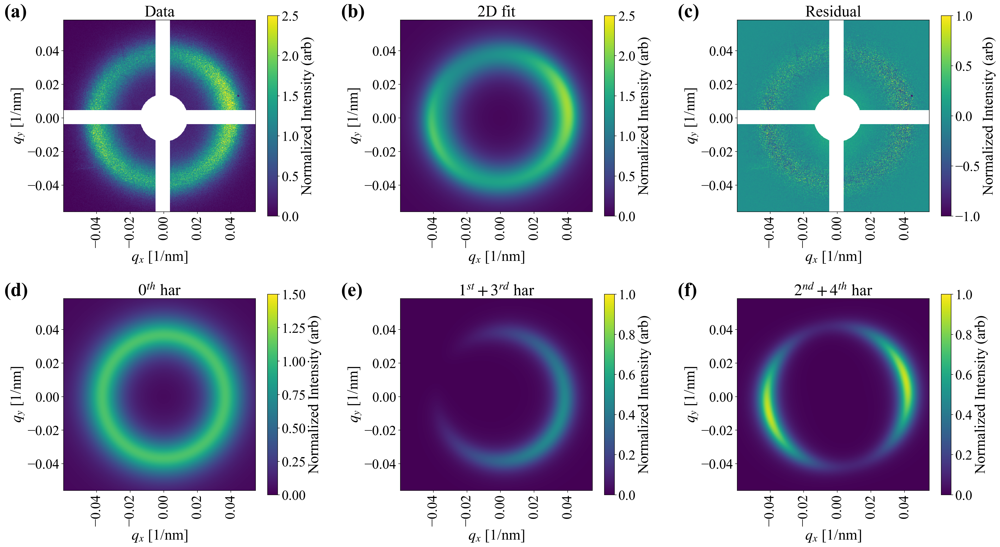

In [89]:
# Figure for manuscript
# Parameters
index_images = 0
parameters = [popt_list[index_images][0], popt_list[index_images][1], popt_list[index_images][2], popt_list[index_images][3],\
              popt_list[index_images][4], popt_list[index_images][5], popt_list[index_images][6], popt_list[index_images][7], popt_list[index_images][8],\
             popt_list[index_images][9], popt_list[index_images][10], popt_list[index_images][11], popt_list[index_images][12], popt_list[index_images][13]]

# Compute final fit
Fit_fourHar = Lorentzian2D_FourHarmPlot(qxx, qyy,'all', *parameters)
Fit_ring = Lorentzian2D_FourHarmPlot(qxx, qyy,'ring', *parameters)
Fit_odd = Lorentzian2D_FourHarmPlot(qxx, qyy,'odd', *parameters)
Fit_even = Lorentzian2D_FourHarmPlot(qxx, qyy,'even', *parameters)
# Masked raw data
image_masked = np.array(data_im_avged[index_images, :, :]*mask_nan*ring_mask)

tick_font_size = 24
label_font_size = 26
title_font_size = 28
text_label_font_size = 34
###############################################################################################################################
# Plotting data
plt.subplot(2, 3, 1) # row 1, column 2, count 3
plt.pcolormesh(qx, qy, image_masked, vmin=0, vmax=2.5, shading='auto')
cbar = plt.colorbar()
cbar.set_label(label='Normalized Intensity (arb)',size=label_font_size)
cbar.ax.tick_params(labelsize=tick_font_size)
plt.gca().set_aspect('equal', 'box')
plt.xticks(fontsize=tick_font_size, rotation = 90)
plt.yticks(fontsize=tick_font_size)
plt.xlabel('$q_x$ [1/nm]',fontsize=label_font_size)
plt.ylabel('$q_y$ [1/nm]',fontsize=label_font_size)
plt.title(f'Data', fontsize = title_font_size)
plt.text(-0.095, 0.06, "(a)", fontsize = text_label_font_size, fontweight = 'bold')

###############################################################################################################################
# Plotting fit
plt.subplot(2, 3, 2) # row 1, column 2, count 3
plt.pcolormesh(qx, qy, Fit_fourHar, vmin=0, vmax=2.5, shading='auto')#, cmap = sns.color_palette("coolwarm", as_cmap=True))
cbar = plt.colorbar()
cbar.set_label(label='Normalized Intensity (arb)',size=label_font_size)
cbar.ax.tick_params(labelsize=tick_font_size)
plt.gca().set_aspect('equal', 'box')
plt.xticks(fontsize=tick_font_size, rotation = 90)
plt.yticks(fontsize=tick_font_size)
plt.xlabel('$q_x$ [1/nm]',fontsize=label_font_size)
plt.ylabel('$q_y$ [1/nm]',fontsize=label_font_size)
plt.title('2D fit', fontsize = title_font_size)
plt.text(-0.095, 0.06, "(b)", fontsize = text_label_font_size, fontweight = 'bold')

###############################################################################################################################
# Plotting residual
plt.subplot(2, 3, 3) # row 1, column 2, count 3
plt.pcolormesh(qx, qy, image_masked - Fit_fourHar, vmin=-1, vmax=1, shading='auto')#, cmap = sns.color_palette("coolwarm", as_cmap=True))
cbar = plt.colorbar()
cbar.set_label(label='Normalized Intensity (arb)',size=label_font_size)
cbar.ax.tick_params(labelsize=tick_font_size)
plt.gca().set_aspect('equal', 'box')
plt.xticks(fontsize=tick_font_size, rotation = 90)
plt.yticks(fontsize=tick_font_size)
plt.xlabel('$q_x$ [1/nm]',fontsize=label_font_size)
plt.ylabel('$q_y$ [1/nm]',fontsize=label_font_size)
plt.title(f'Residual', fontsize = title_font_size)
plt.text(-0.095, 0.06, "(c)", fontsize = text_label_font_size, fontweight = 'bold')

###############################################################################################################################
# Plotting fit ring
plt.subplot(2, 3, 4) # row 1, column 2, count 3
plt.pcolormesh(qx, qy, Fit_ring, vmin=0, vmax=1.5, shading='auto')#, cmap = sns.color_palette("coolwarm", as_cmap=True))
cbar = plt.colorbar()
cbar.set_label(label='Normalized Intensity (arb)',size=label_font_size)
cbar.ax.tick_params(labelsize=tick_font_size)
plt.gca().set_aspect('equal', 'box')
plt.xticks(fontsize=tick_font_size, rotation = 90)
plt.yticks(fontsize=tick_font_size)
plt.xlabel('$q_x$ [1/nm]',fontsize=label_font_size)
plt.ylabel('$q_y$ [1/nm]',fontsize=label_font_size)
plt.title('$0^{th}$ har', fontsize = title_font_size)
plt.text(-0.095, 0.06, "(d)", fontsize = text_label_font_size, fontweight = 'bold')

###############################################################################################################################
# Plotting fit odd
plt.subplot(2, 3, 5) # row 1, column 2, count 3
plt.pcolormesh(qx, qy, Fit_odd, vmin=0, vmax=1.0, shading='auto')#, cmap = sns.color_palette("coolwarm", as_cmap=True))
cbar = plt.colorbar()
cbar.set_label(label='Normalized Intensity (arb)',size=label_font_size)
cbar.ax.tick_params(labelsize=tick_font_size)
plt.gca().set_aspect('equal', 'box')
plt.xticks(fontsize=tick_font_size, rotation = 90)
plt.yticks(fontsize=tick_font_size)
plt.xlabel('$q_x$ [1/nm]',fontsize=label_font_size)
plt.ylabel('$q_y$ [1/nm]',fontsize=label_font_size)
plt.title('$1^{st}+3^{rd}$ har', fontsize = title_font_size)
plt.text(-0.095, 0.06, "(e)", fontsize = text_label_font_size, fontweight = 'bold')

###############################################################################################################################
# Plotting fit even
plt.subplot(2, 3, 6) # row 1, column 2, count 3
plt.pcolormesh(qx, qy, Fit_even, vmin=0, vmax=1.0, shading='auto')#, cmap = sns.color_palette("coolwarm", as_cmap=True))
cbar = plt.colorbar()
cbar.set_label(label='Normalized Intensity (arb)',size=label_font_size)
cbar.ax.tick_params(labelsize=tick_font_size)
plt.gca().set_aspect('equal', 'box')
plt.xticks(fontsize=tick_font_size, rotation = 90)
plt.yticks(fontsize=tick_font_size)
plt.xlabel('$q_x$ [1/nm]',fontsize=label_font_size)
plt.ylabel('$q_y$ [1/nm]',fontsize=label_font_size)
plt.title('$2^{nd}+4^{th}$ har', fontsize = title_font_size)
plt.text(-0.095, 0.06, "(f)", fontsize = text_label_font_size, fontweight = 'bold')

plt.tight_layout(pad=3.5)

save_fig_bool = False
# Saving figure
fig_name1 = 'SFig3_all.pdf'
fig_name2 = 'SFig3_all.png'
if save_fig_bool == True:
    #plt.savefig(concat_2.format(save_fig_dir, fig_name1), dpi = 300, bbox_inches = "tight")
    plt.savefig(concat_2.format(save_fig_dir, fig_name2), dpi = 400, bbox_inches = "tight")
else:
    pass

plt.show()

save_fig_bool = False

In [90]:
plt.rcParams['figure.figsize'] = (7, 6)

## Intigrating the residual

In [91]:
# Azimuthal integration
residual = image_masked - Fit_fourHar
Intensity_Avg1, Intensity_Int1, _, im_sum1 = pp.Integrator(qxx, qyy, q, residual, residual*0, ax_size,0,0,shell_width,0, 1)

d:\Beamtimes\Fermi_beamtime\Export\PostProcessing.py:198: RuntimeWarning: invalid value encountered in true_divide
  Intensity[idR] = np.nansum(Probe.flatten()/(Shell_sum-Shell_mask_sum))


<function matplotlib.pyplot.show(close=None, block=None)>

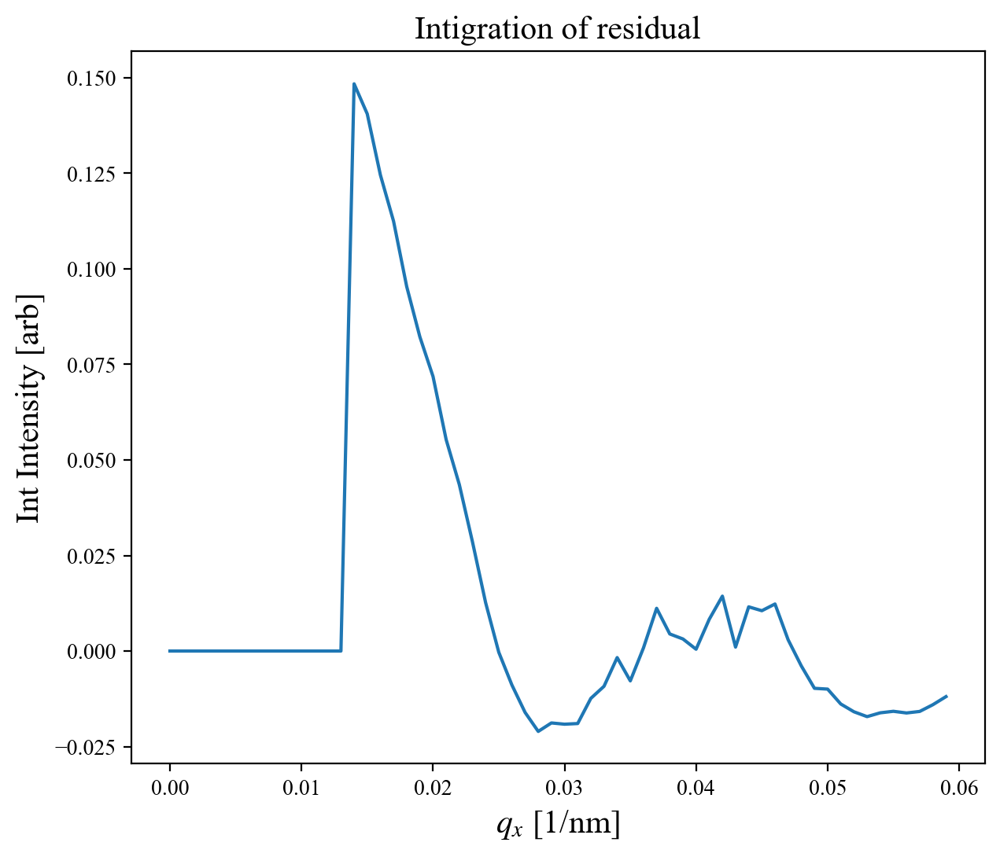

In [92]:
# Plotting integrated intensity of residual
plt.plot(q, Intensity_Avg1)
#plt.ylim(-0.05, 0.05)
#plt.legend()
plt.xlabel('$q_x$ [1/nm]',fontsize=15)
plt.ylabel('Int Intensity [arb]',fontsize=15)
plt.title('Intigration of residual',fontsize=15)
plt.show

# Plotting all fit parameters

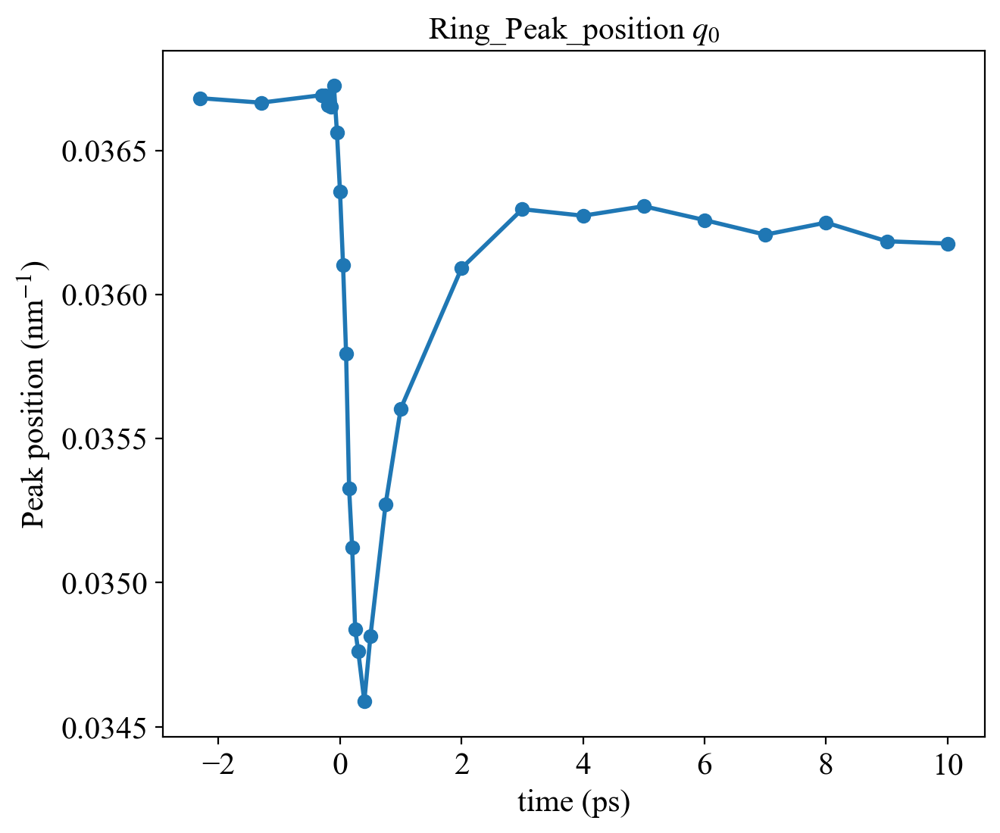

In [93]:
# Plot
#plt.figure(figsize=(12, 8))
plt.errorbar(final_delay_time, popt_list[:, 1], perr_list[:, 1],linewidth=2,marker='o')
#plt.errorbar(final_delay_time, popt_list[:, 1], perr_list[:, 1],linewidth=2,marker='o')

#plt.errorbar(final_delay_time[0, :], popt_list[:, 1]/popt_list[0, 1], perr_list[:, 1],linewidth=2,marker='o')
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('time (ps)',fontsize=15)

plt.ylabel('Peak position (nm$^{-1}$)',fontsize=15)
#plt.ylabel('Norm_Peak position $q_0$ (nm$^{-1}$)',fontsize=20)
#plt.xlim(-0.5, 10)
#plt.ylim(0.032, 0.0326)

plt.title('Ring_Peak_position $q_0$',fontsize=15)
#plt.title('Norm_Ring_Peak_position',fontsize=20)
plt.show()

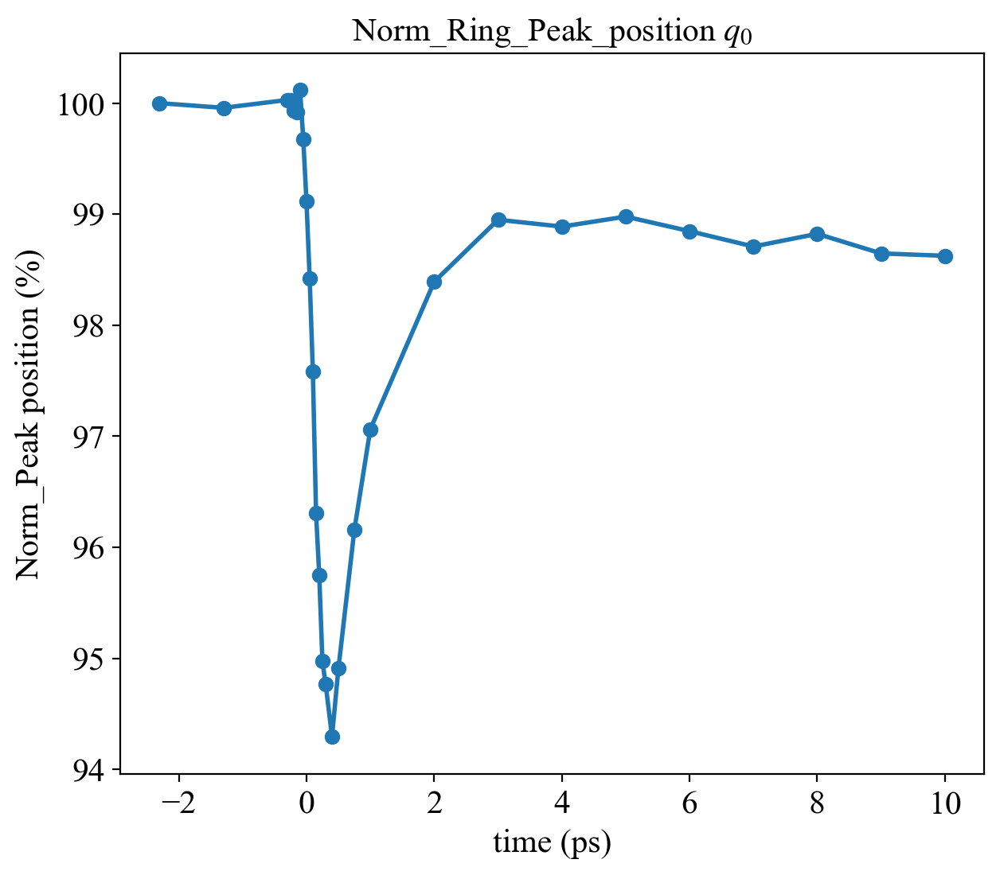

In [94]:
# Plot
#plt.figure(figsize=(12, 8))
#plt.errorbar(final_delay_time[0, :], popt_list[:, 1], perr_list[:, 1],linewidth=2,marker='o')
plt.errorbar(final_delay_time, popt_list[:, 1]/popt_list[0, 1]*100, perr_list[:, 1]/abs(popt_list[0, 1])*100, linewidth=2, marker='o')
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('time (ps)',fontsize=15)

#plt.ylabel('Peak position $q_0$ (nm$^{-1}$)',fontsize=20)
plt.ylabel('Norm_Peak position (%)',fontsize=15)
#plt.xlim(-0.5, 10)
#plt.ylim(0.032, 0.0326)

#plt.title('Ring_Peak_position',fontsize=20)
plt.title('Norm_Ring_Peak_position $q_0$',fontsize=15)
plt.show()

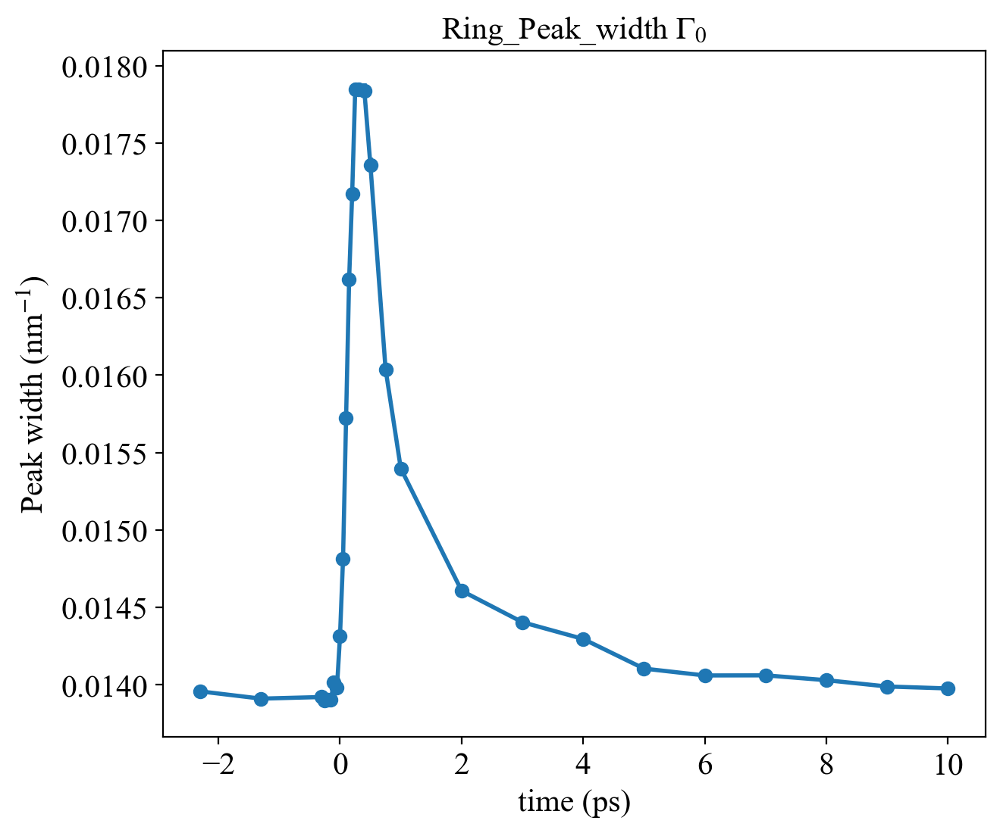

In [95]:
# Plot
#plt.figure(figsize=(12, 8))
plt.errorbar(final_delay_time, popt_list[:, 2], perr_list[:, 2],linewidth=2,marker='o')
#plot_errorbars(final_delay_time, popt_list[:, 2], perr_list[:, 2], linewidth=2)

#plt.errorbar(final_delay_time[0, :], popt_list[:, 2]/popt_list[0, 2], perr_list[:, 2],linewidth=2,marker='o')
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('time (ps)',fontsize=15)

plt.ylabel('Peak width (nm$^{-1}$)',fontsize=15)
#plt.ylabel('Norm_Peak width (nm$^{-1}$)',fontsize=20)
#plt.xlim(-0.5, 10)
#plt.ylim(0.032, 0.0326)

plt.title('Ring_Peak_width $\u0393_0$',fontsize=15)
#plt.title('Norm_Ring_Peak_width $Gamma_0$',fontsize=20)
plt.show()

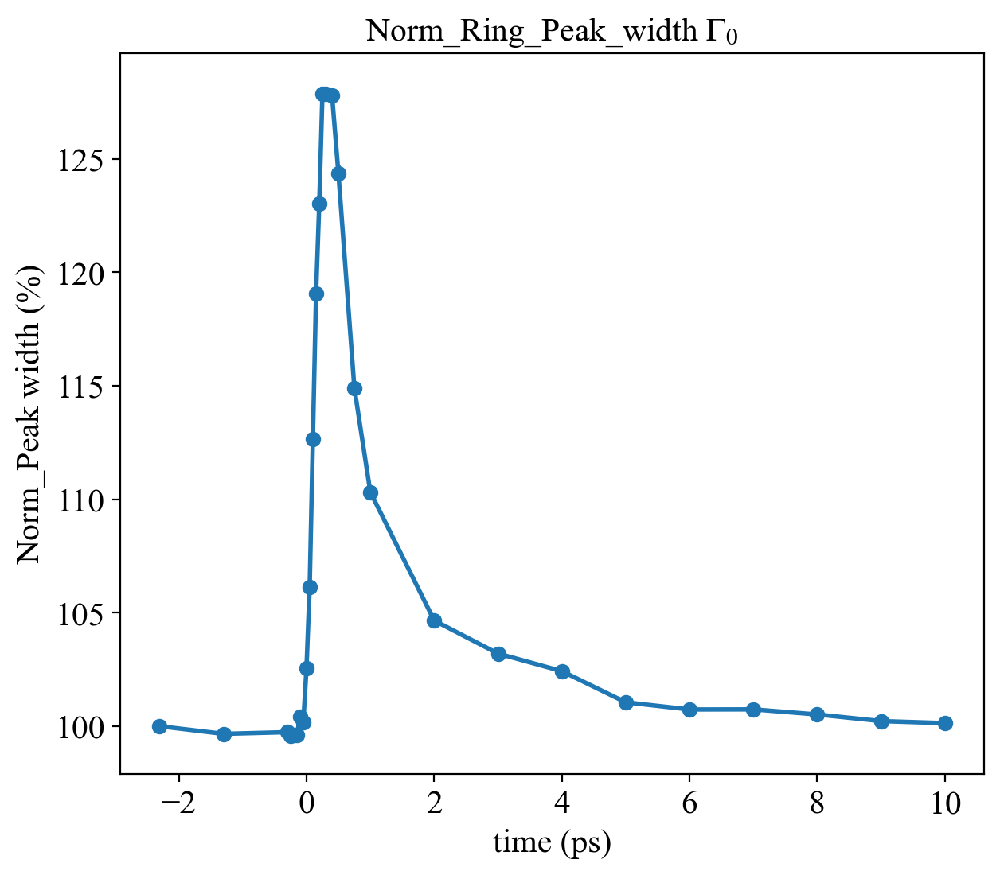

In [96]:
# Plot
#plt.figure(figsize=(12, 8))
#plt.errorbar(final_delay_time[0, :], popt_list[:, 2], perr_list[:, 2],linewidth=2,marker='o')
plt.errorbar(final_delay_time, popt_list[:, 2]/popt_list[0, 2]*100, perr_list[:, 2]/abs(popt_list[0, 2])*100, linewidth=2, marker='o')
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('time (ps)',fontsize=15)

#plt.ylabel('Peak width $Gamma_0$ (nm$^{-1}$)',fontsize=20)
plt.ylabel('Norm_Peak width (%)',fontsize=15)
#plt.xlim(-0.5, 10)
#plt.ylim(0.032, 0.0326)

#plt.title('Ring_Peak_width',fontsize=20)
plt.title('Norm_Ring_Peak_width $\u0393_0$',fontsize=15)
plt.show()

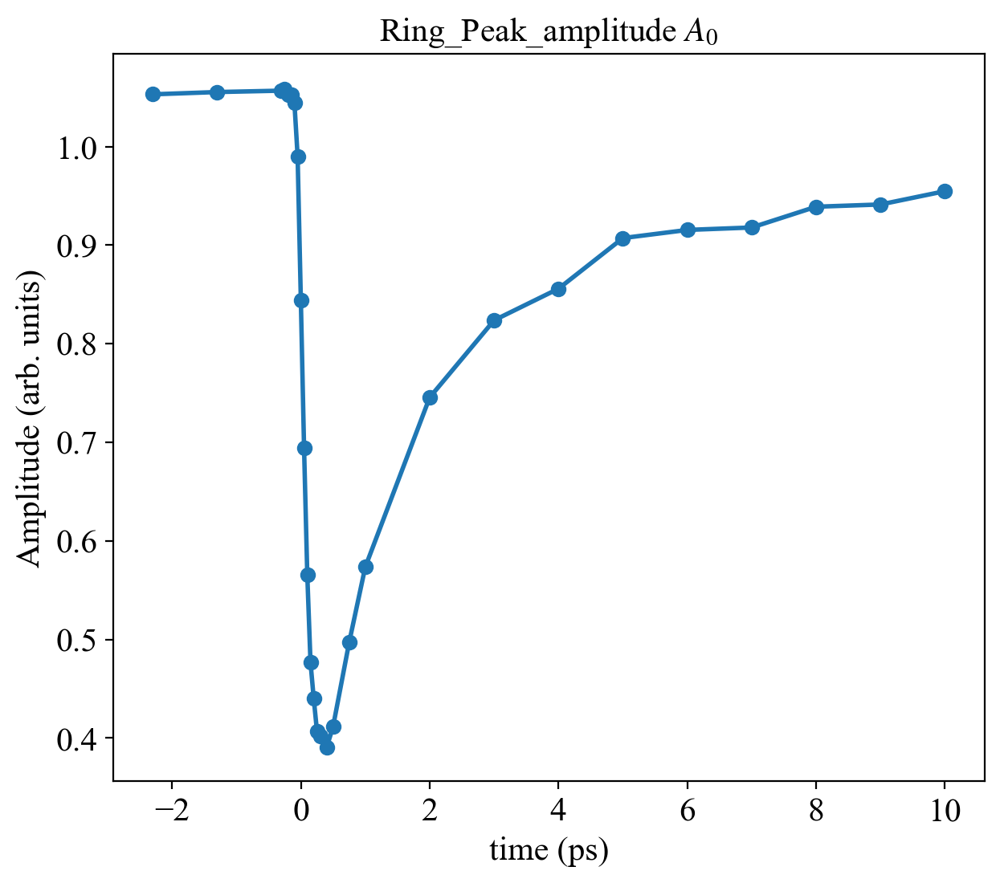

In [97]:
# Plot
#plt.figure(figsize=(12, 8))
plt.errorbar(final_delay_time, popt_list[:, 3], perr_list[:, 3], linewidth=2, marker='o')
#plt.errorbar(final_delay_time[0, :], popt_list[:, 3]/popt_list[0, 3], perr_list[:, 3],linewidth=2,marker='o')

plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('time (ps)',fontsize=15)

plt.ylabel('Amplitude (arb. units)',fontsize=15)
#plt.ylabel('Norm_Peak amplitude (arb. units)',fontsize=20)
#plt.xlim(-0.5, 10)
#plt.ylim(0.032, 0.0326)

plt.title('Ring_Peak_amplitude $A_0$',fontsize=15)
#plt.title('Norm_Ring_Peak_amplitude $A_0$',fontsize=20)
plt.show()

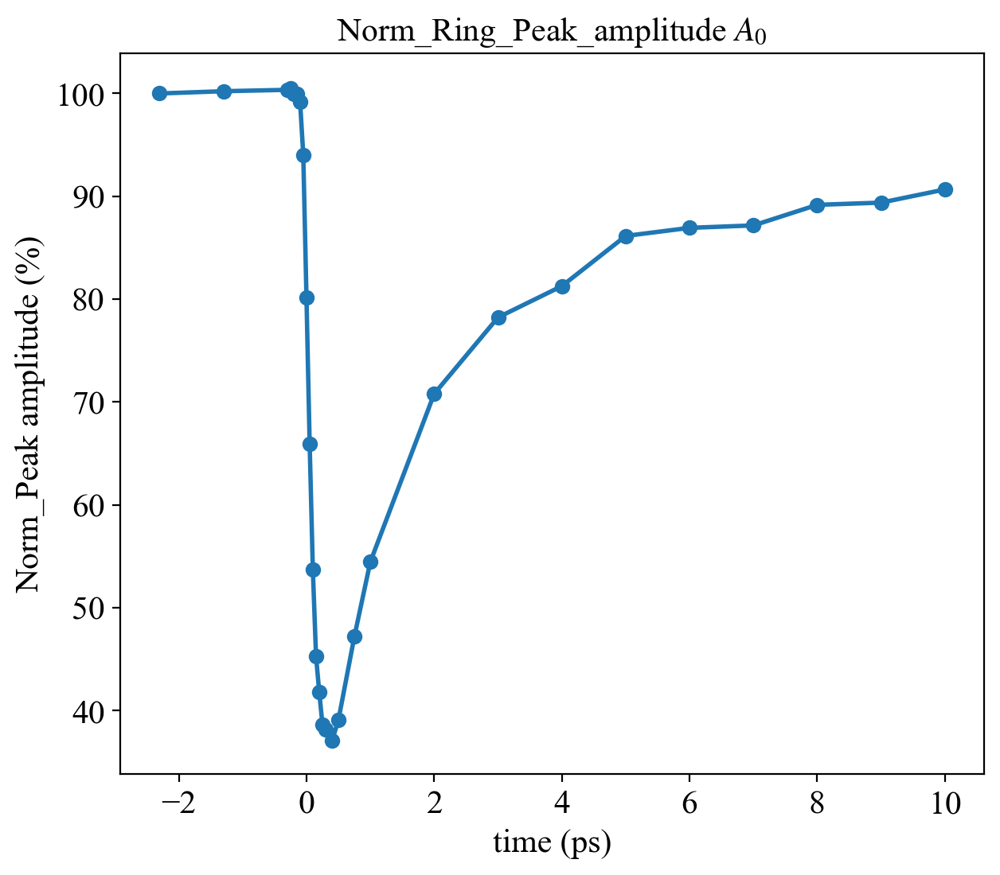

In [98]:
# Plot
#plt.figure(figsize=(12, 8))
#plt.errorbar(final_delay_time[0, :], popt_list[:, 3], perr_list[:, 3],linewidth=2,marker='o')
plt.errorbar(final_delay_time, popt_list[:, 3]/popt_list[0, 3]*100, perr_list[:, 3]/abs(popt_list[0, 3])*100, linewidth=2, marker='o')

plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('time (ps)',fontsize=15)

#plt.ylabel('Peak amplitude $A_0$ (arb. units)',fontsize=20)
plt.ylabel('Norm_Peak amplitude (%)',fontsize=15)
#plt.xlim(-0.5, 10)
#plt.ylim(0.032, 0.0326)

#plt.title('Ring_Peak_amplitude',fontsize=20)
plt.title('Norm_Ring_Peak_amplitude $A_0$',fontsize=15)
plt.show()

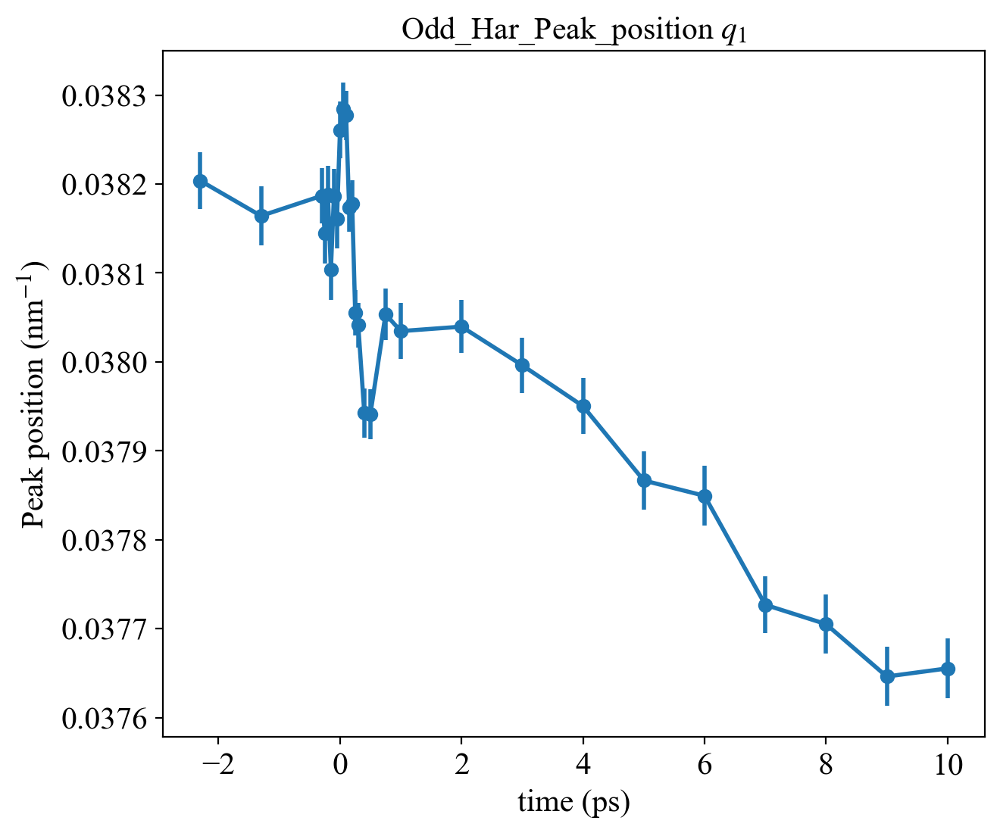

In [99]:
# Plot
#plt.figure(figsize=(12, 8))
plt.errorbar(final_delay_time, popt_list[:, 4], perr_list[:, 4], linewidth=2, marker='o')
#plt.errorbar(final_delay_time[0, :], popt_list[:, 4]/popt_list[0, 4], perr_list[:, 4],linewidth=2,marker='o')

plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('time (ps)',fontsize=15)

plt.ylabel('Peak position (nm$^{-1}$)',fontsize=15)
#plt.ylabel('Norm_Peak position (nm$^{-1}$)',fontsize=20)
#plt.xlim(-0.5, 10)
#plt.ylim(0.032, 0.0326)

plt.title('Odd_Har_Peak_position $q_1$',fontsize=15)
#plt.title('Norm_Lobe_Peak_position $q_1$',fontsize=20)
plt.show()

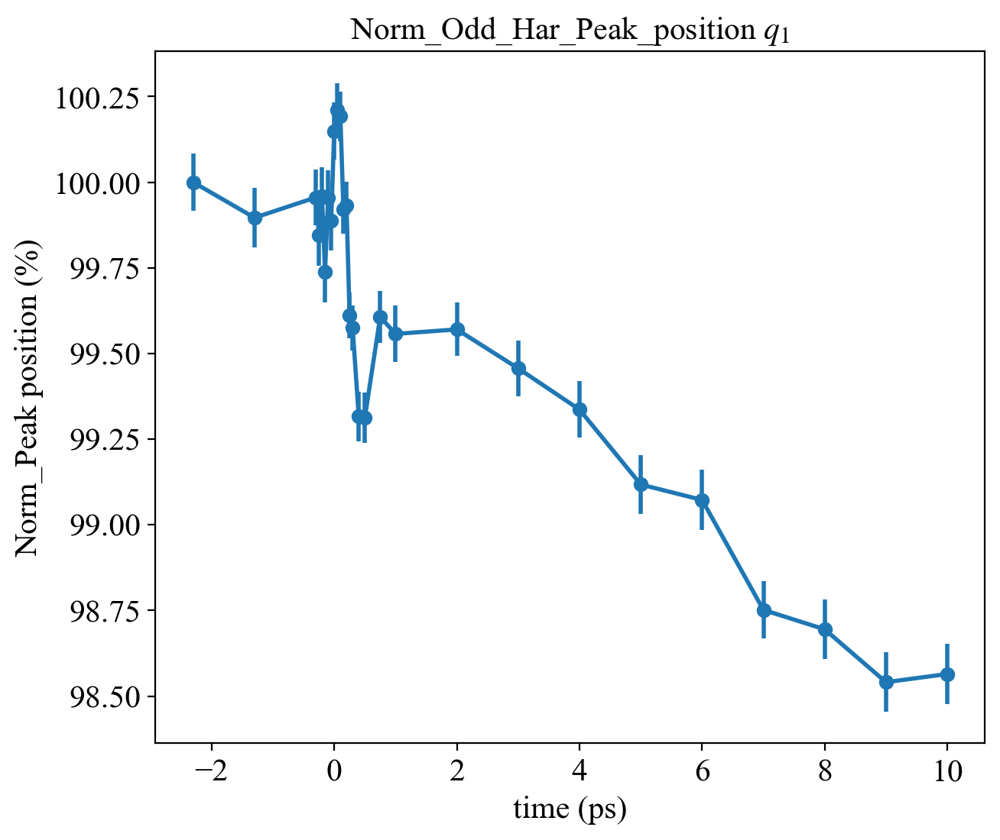

In [100]:
# Plot
#plt.figure(figsize=(12, 8))
#plt.errorbar(final_delay_time[0, :], popt_list[:, 4], perr_list[:, 4],linewidth=2,marker='o')
plt.errorbar(final_delay_time, popt_list[:, 4]/popt_list[0, 4]*100, perr_list[:, 4]/abs(popt_list[0, 4])*100, linewidth=2, marker='o')

plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('time (ps)',fontsize=15)

#plt.ylabel('Peak position $q_1$ (nm$^{-1}$)',fontsize=20)
plt.ylabel('Norm_Peak position (%)',fontsize=15)
#plt.xlim(-0.5, 10)
#plt.ylim(0.032, 0.0326)

#plt.title('Lobe_Peak_position',fontsize=20)
plt.title('Norm_Odd_Har_Peak_position $q_1$',fontsize=15)
plt.show()

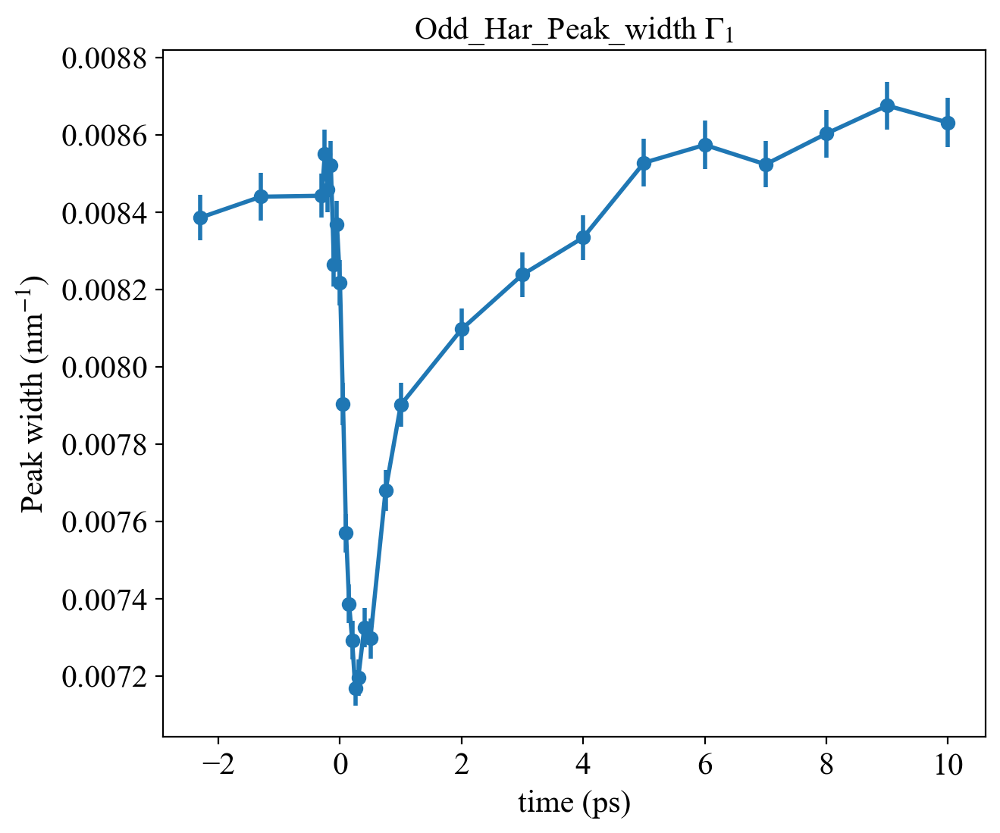

In [101]:
# Plot
#plt.figure(figsize=(12, 8))
plt.errorbar(final_delay_time, popt_list[:, 5], perr_list[:, 5], linewidth=2, marker='o')
#plt.errorbar(final_delay_time[0, :], popt_list[:, 5]/popt_list[0, 5], perr_list[:, 5],linewidth=2,marker='o')

plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('time (ps)',fontsize=15)

plt.ylabel('Peak width (nm$^{-1}$)',fontsize=15)
#plt.ylabel('Norm_Peak width (nm$^{-1}$)',fontsize=20)
#plt.xlim(-0.5, 10)
#plt.ylim(0.032, 0.0326)

plt.title('Odd_Har_Peak_width $\u0393_1$',fontsize=15)
#plt.title('Norm_Lobe_Peak_width $Gamma_1$',fontsize=20)
plt.show()

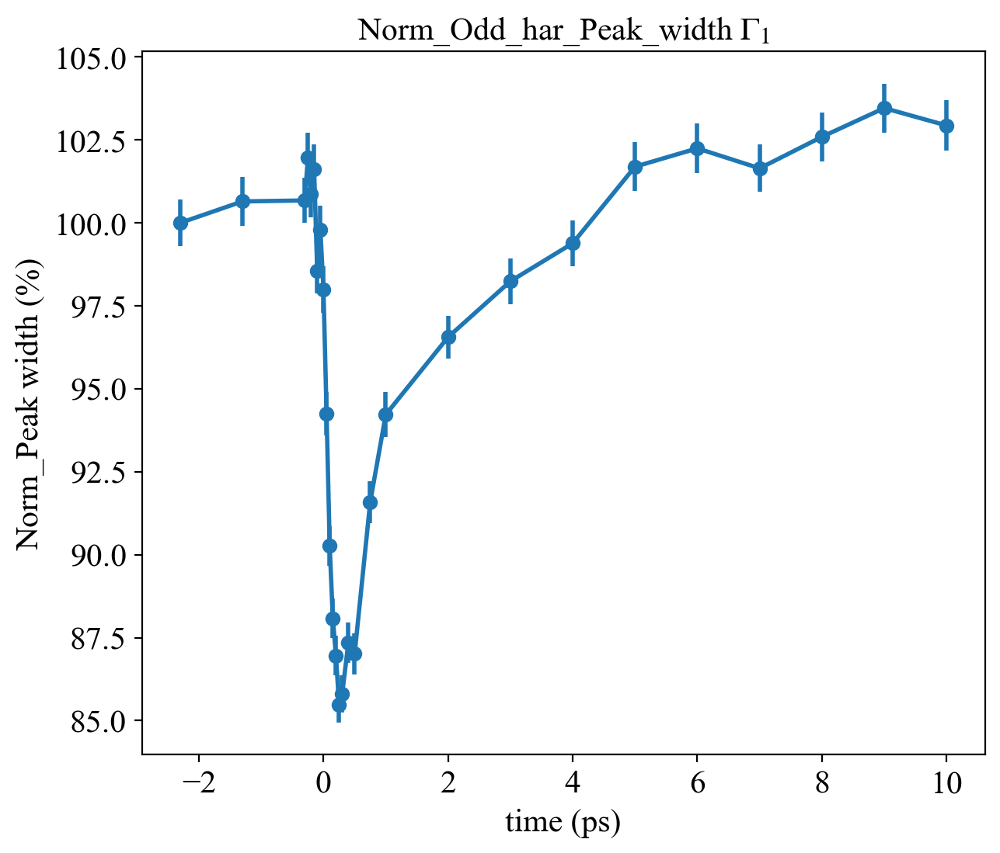

In [102]:
# Plot
#plt.figure(figsize=(12, 8))
#plt.errorbar(final_delay_time[0, :], popt_list[:, 5], perr_list[:, 5],linewidth=2,marker='o')
plt.errorbar(final_delay_time, popt_list[:, 5]/popt_list[0, 5]*100, perr_list[:, 5]/abs(popt_list[0, 5])*100, linewidth=2, marker='o')

plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('time (ps)',fontsize=15)

#plt.ylabel('Peak width $Gamma_1$ (nm$^{-1}$)',fontsize=20)
plt.ylabel('Norm_Peak width (%)',fontsize=15)
#plt.xlim(-0.5, 10)
#plt.ylim(0.032, 0.0326)

#plt.title('Lobe_Peak_width',fontsize=20)
plt.title('Norm_Odd_har_Peak_width $\u0393_1$',fontsize=15)
plt.show()

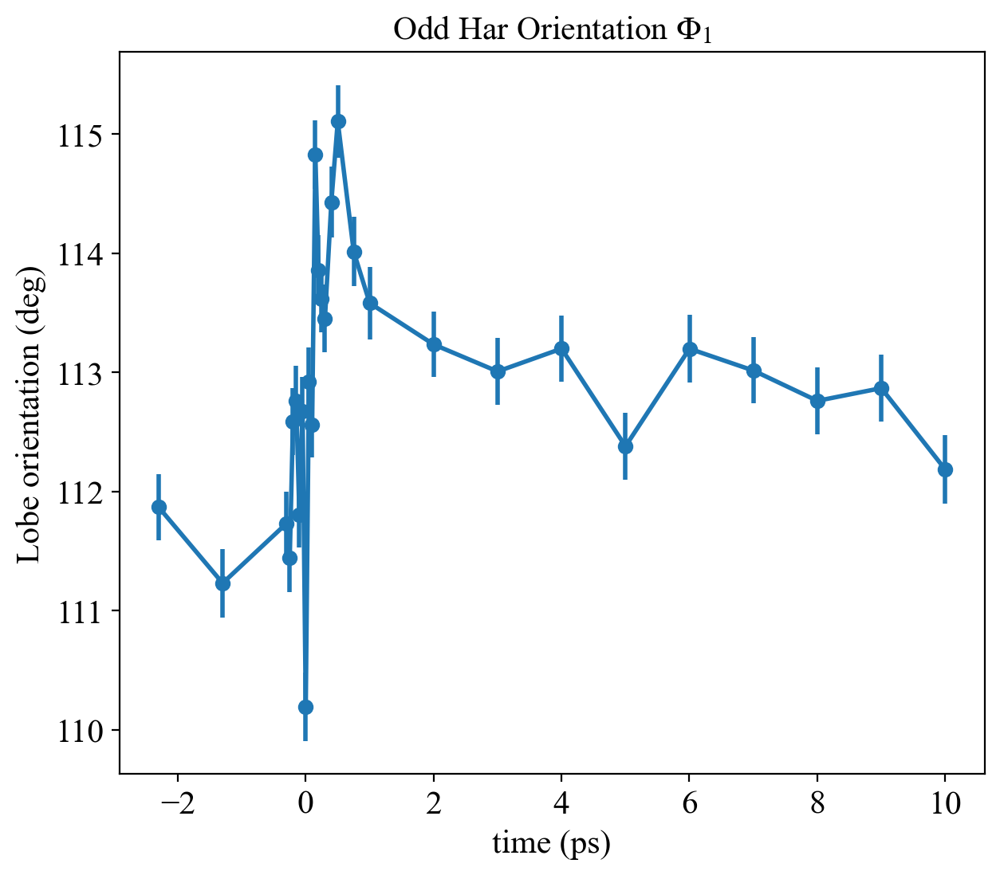

In [103]:
# Plot
#plt.figure(figsize=(12, 8))
plt.errorbar(final_delay_time, np.degrees(popt_list[:, 8]), np.degrees(perr_list[:, 8]),linewidth=2,marker='o')
#plt.errorbar(final_delay_time[0, :], np.degrees(popt_list[:, 8])/np.degrees(popt_list[0, 8]), perr_list[:, 8],linewidth=2,marker='o')

plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('time (ps)',fontsize=15)

plt.ylabel('Lobe orientation (deg)',fontsize=15)
#plt.ylabel('Norm Lobe orientation (deg)',fontsize=20)
#plt.xlim(-0.5, 10)
#plt.ylim(0.032, 0.0326)

plt.title('Odd Har Orientation $\u03A6_1$',fontsize=15)
#plt.title('Norm Lobe Orientation Phi',fontsize=20)
plt.show()

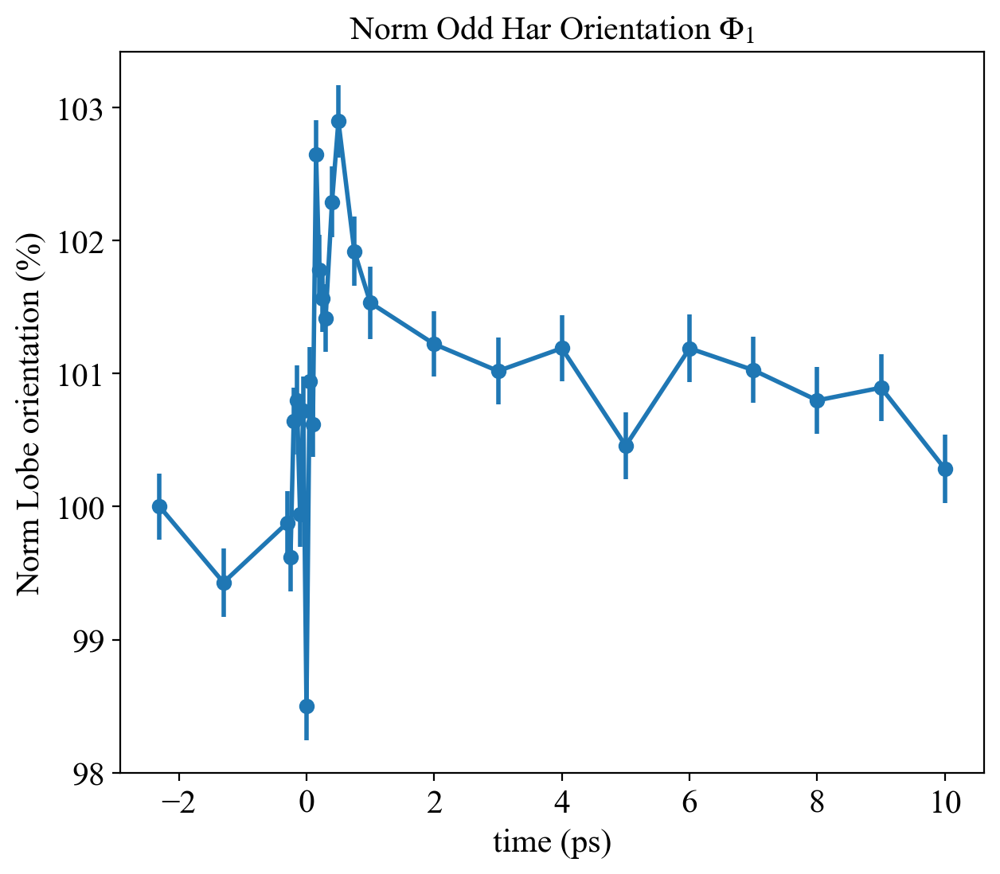

In [104]:
# Plot
#plt.figure(figsize=(12, 8))
#plt.errorbar(final_delay_time[0, :], np.degrees(popt_list[:, 8]), perr_list[:, 8],linewidth=2,marker='o')
plt.errorbar(final_delay_time, np.degrees(popt_list[:, 8])/np.degrees(popt_list[0, 8])*100, abs(np.degrees(perr_list[:, 8])/np.degrees(popt_list[0, 8])*100),linewidth=2,marker='o')

plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('time (ps)',fontsize=15)

#plt.ylabel('Lobe orientation $phi$ (deg)',fontsize=20)
plt.ylabel('Norm Lobe orientation (%)',fontsize=15)
#plt.xlim(-0.5, 10)
#plt.ylim(0.032, 0.0326)

#plt.title('Lobe Orientation Phi',fontsize=20)
plt.title('Norm Odd Har Orientation $\u03A6_1$',fontsize=15)
plt.show()

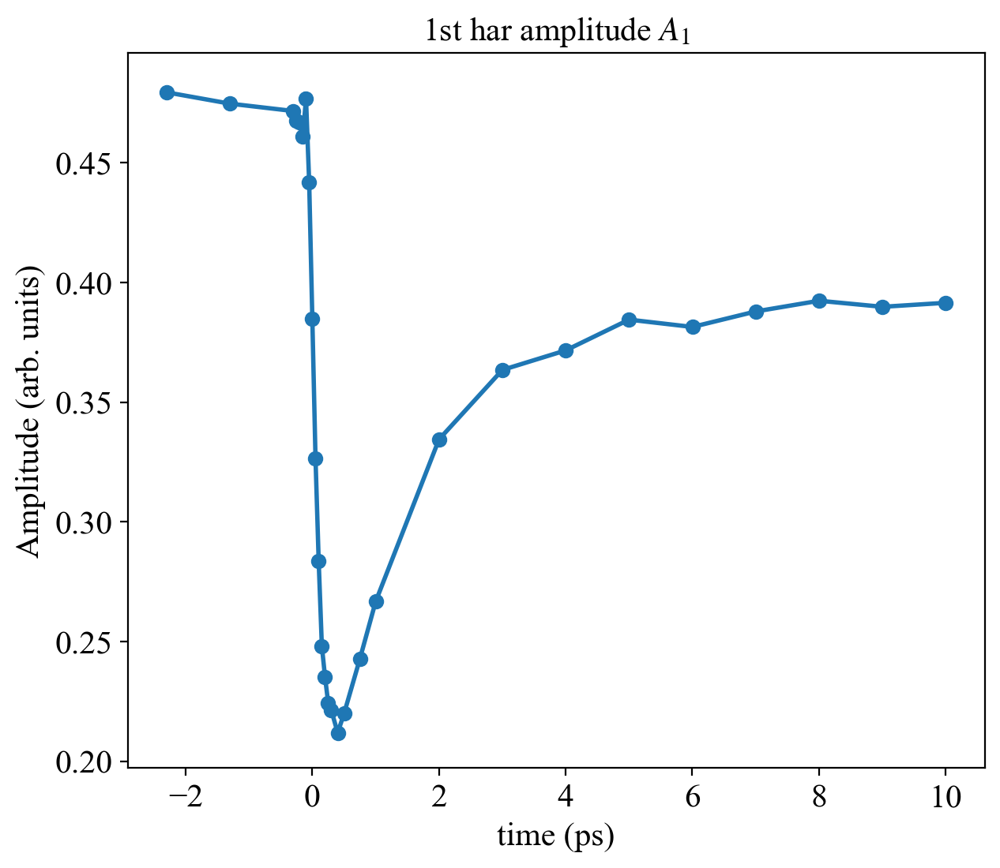

In [105]:
# Plot
#plt.figure(figsize=(12, 8))
plt.errorbar(final_delay_time, popt_list[:, 6], perr_list[:, 6],linewidth=2,marker='o')
#plt.errorbar(final_delay_time[0, :], popt_list[:, 6]/popt_list[0, 6], perr_list[:, 6],linewidth=2,marker='o')

plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('time (ps)',fontsize=15)

plt.ylabel('Amplitude (arb. units)',fontsize=15)
#plt.ylabel('Norm_2nd har amplitude (arb. units)',fontsize=20)
#plt.xlim(-0.5, 10)
#plt.ylim(0.032, 0.0326)

plt.title('1st har amplitude $A_1$',fontsize=15)
#plt.title('Norm 2nd har amplitude $A_1$',fontsize=20)
plt.show()

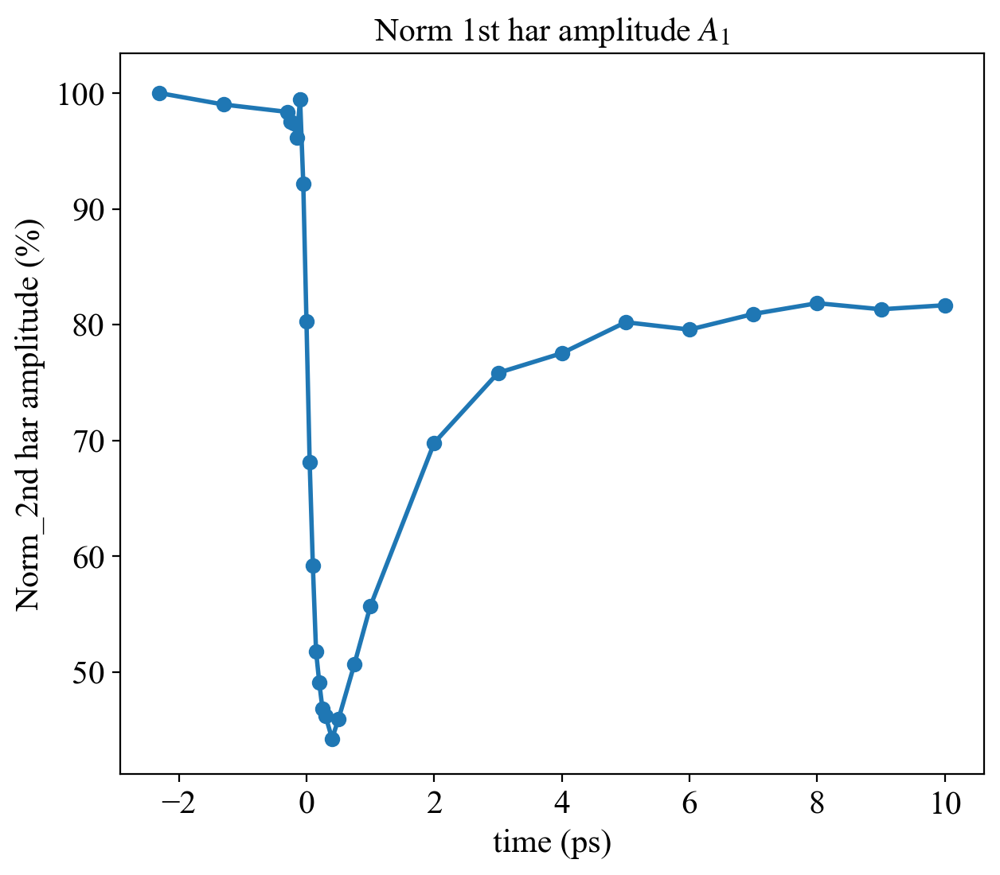

In [106]:
# Plot
#plt.figure(figsize=(12, 8))
#plt.errorbar(final_delay_time[0, :], popt_list[:, 6], perr_list[:, 6],linewidth=2,marker='o')
plt.errorbar(final_delay_time, popt_list[:, 6]/popt_list[0, 6]*100, perr_list[:, 6]/abs(popt_list[0, 6])*100, linewidth=2, marker='o')

plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('time (ps)',fontsize=15)

#plt.ylabel('2nd har amplitude $A_1$ (arb. units)',fontsize=20)
plt.ylabel('Norm_2nd har amplitude (%)',fontsize=15)
#plt.xlim(-0.5, 10)
#plt.ylim(0.032, 0.0326)

#plt.title('2nd har amplitude $A_1$',fontsize=20)
plt.title('Norm 1st har amplitude $A_1$',fontsize=15)
plt.show()

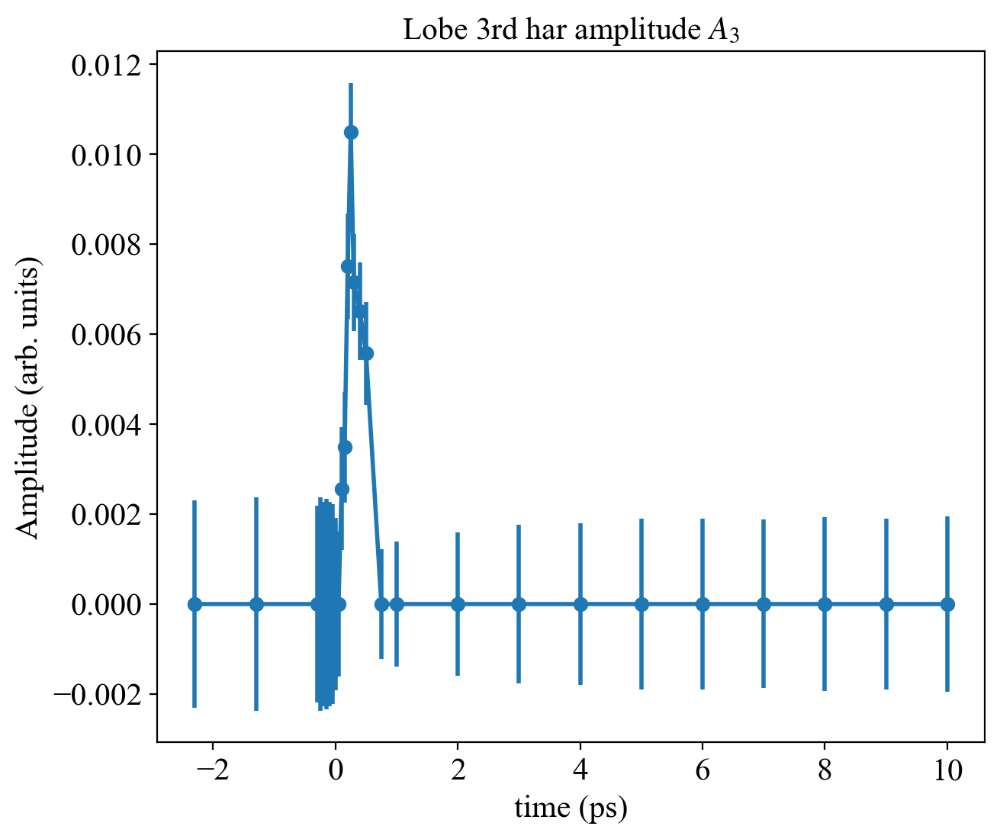

In [107]:
# Plot
#plt.figure(figsize=(12, 8))
plt.errorbar(final_delay_time, popt_list[:, 7], perr_list[:, 7], linewidth=2, marker='o')
#plt.errorbar(final_delay_time[0, :], popt_list[:, 7]/popt_list[0, 7], perr_list[:, 7],linewidth=2,marker='o')

plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('time (ps)',fontsize=15)

plt.ylabel('Amplitude (arb. units)',fontsize=15)
#plt.ylabel('Norm 4th har amplitude (arb. units)',fontsize=20)
#plt.xlim(-0.5, 10)
#plt.ylim(0.032, 0.0326)

plt.title('Lobe 3rd har amplitude $A_3$',fontsize=15)
#plt.title('Norm 4th har amplitude $A_2$',fontsize=20)
plt.show()

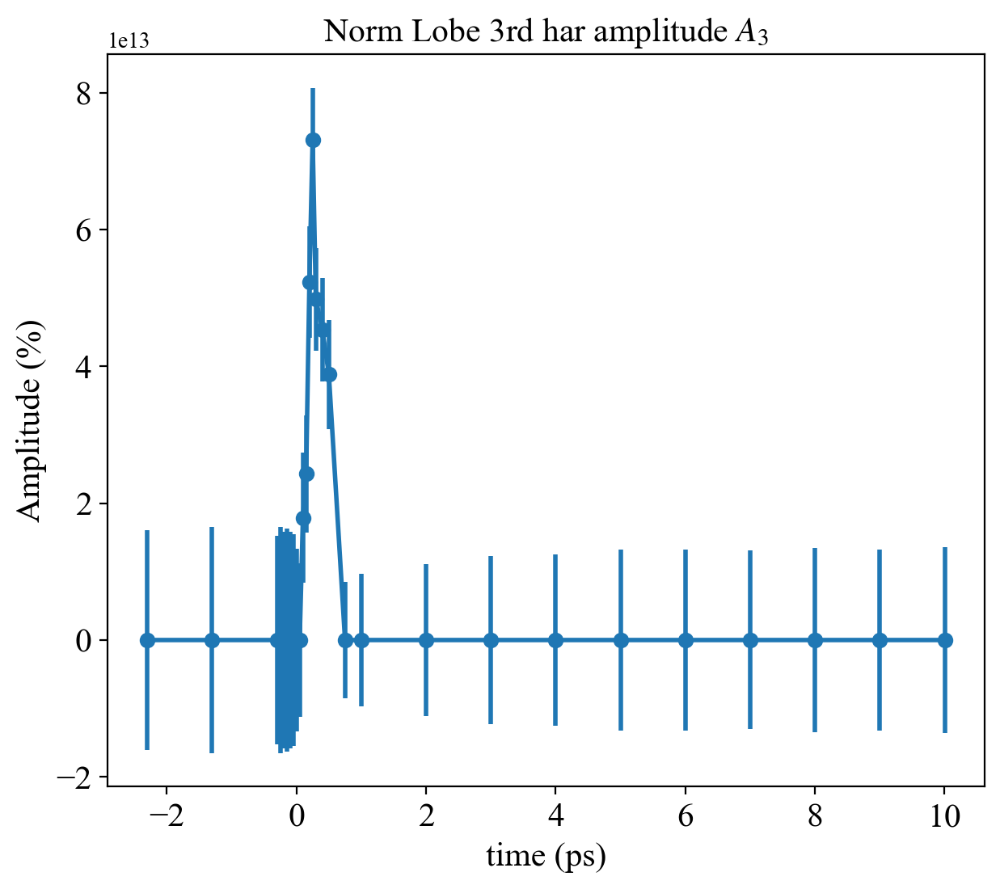

In [108]:
# Plot
#plt.figure(figsize=(12, 8))
#plt.errorbar(final_delay_time[0, :], popt_list[:, 7], perr_list[:, 7],linewidth=2,marker='o')
plt.errorbar(final_delay_time, popt_list[:, 7]/popt_list[0, 7]*100, perr_list[:, 7]/abs(popt_list[0, 7])*100, linewidth=2, marker='o')

plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('time (ps)',fontsize=15)

#plt.ylabel('4th har amplitude (arb. units)',fontsize=20)
plt.ylabel('Amplitude (%)',fontsize=15)
#plt.xlim(-0.5, 10)
#plt.ylim(0.032, 0.0326)

#plt.title('4th har amplitude $A_2$',fontsize=20)
plt.title('Norm Lobe 3rd har amplitude $A_3$',fontsize=15)
plt.show()

## Plotting 2nd and 4th harmoics

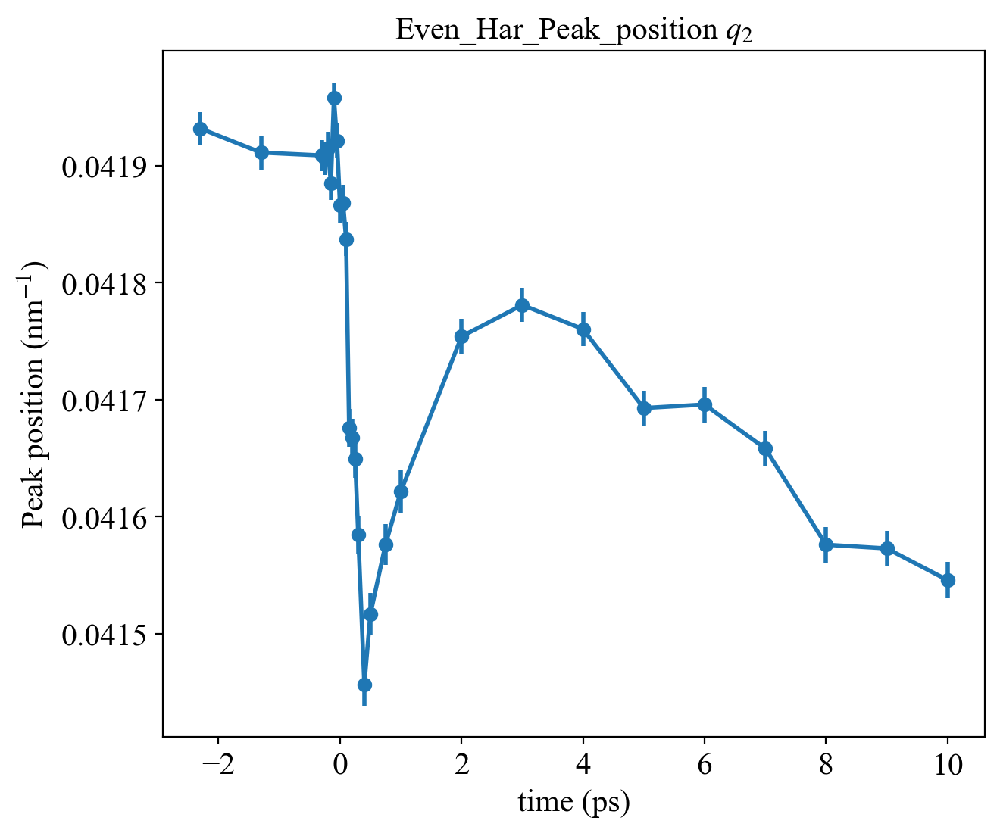

In [109]:
# Plot
#plt.figure(figsize=(12, 8))
plt.errorbar(final_delay_time, popt_list[:, 9], perr_list[:, 9], linewidth=2, marker='o')
#plt.errorbar(final_delay_time[0, :], popt_list[:, 4]/popt_list[0, 4], perr_list[:, 4],linewidth=2,marker='o')

plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('time (ps)',fontsize=15)

plt.ylabel('Peak position (nm$^{-1}$)',fontsize=15)
#plt.ylabel('Norm_Peak position (nm$^{-1}$)',fontsize=20)
#plt.xlim(-0.5, 10)
#plt.ylim(0.032, 0.0326)

plt.title('Even_Har_Peak_position $q_2$',fontsize=15)
#plt.title('Norm_Lobe_Peak_position $q_1$',fontsize=20)
plt.show()

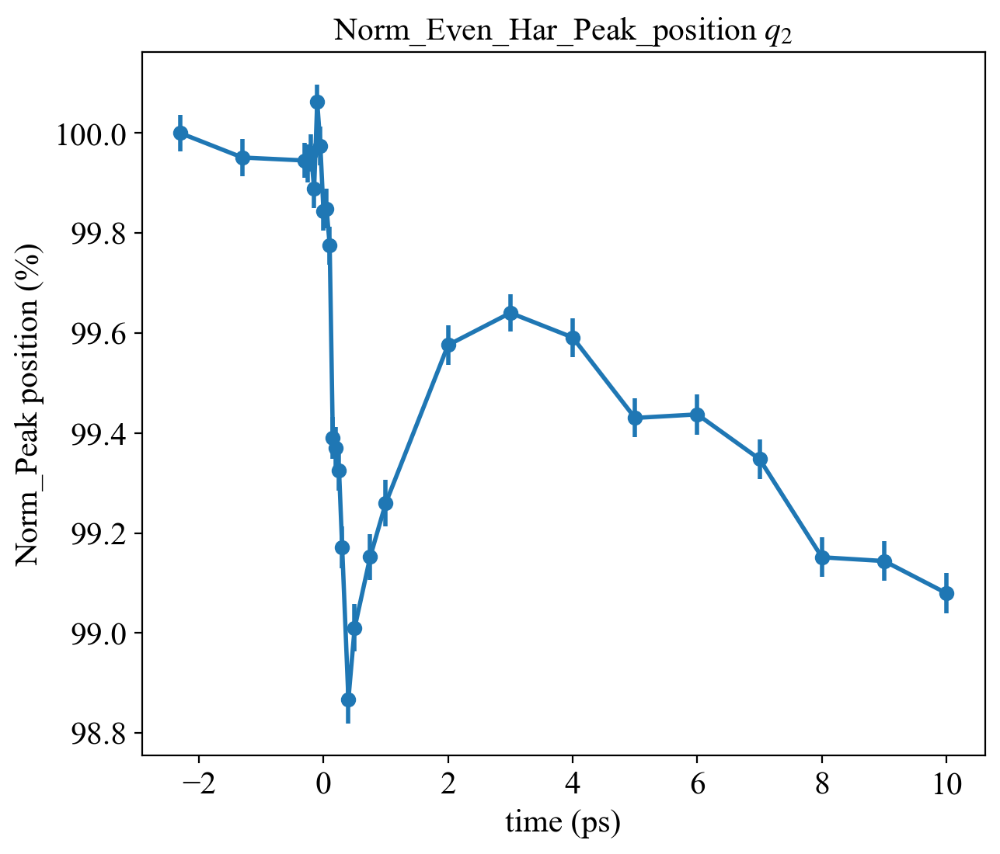

In [110]:
# Plot
#plt.figure(figsize=(12, 8))
#plt.errorbar(final_delay_time[0, :], popt_list[:, 4], perr_list[:, 4],linewidth=2,marker='o')
plt.errorbar(final_delay_time, popt_list[:, 9]/popt_list[0, 9]*100, perr_list[:, 9]/abs(popt_list[0, 4])*100, linewidth=2, marker='o')

plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('time (ps)',fontsize=15)

#plt.ylabel('Peak position $q_1$ (nm$^{-1}$)',fontsize=20)
plt.ylabel('Norm_Peak position (%)',fontsize=15)
#plt.xlim(-0.5, 10)
#plt.ylim(0.032, 0.0326)

#plt.title('Lobe_Peak_position',fontsize=20)
plt.title('Norm_Even_Har_Peak_position $q_2$',fontsize=15)
plt.show()

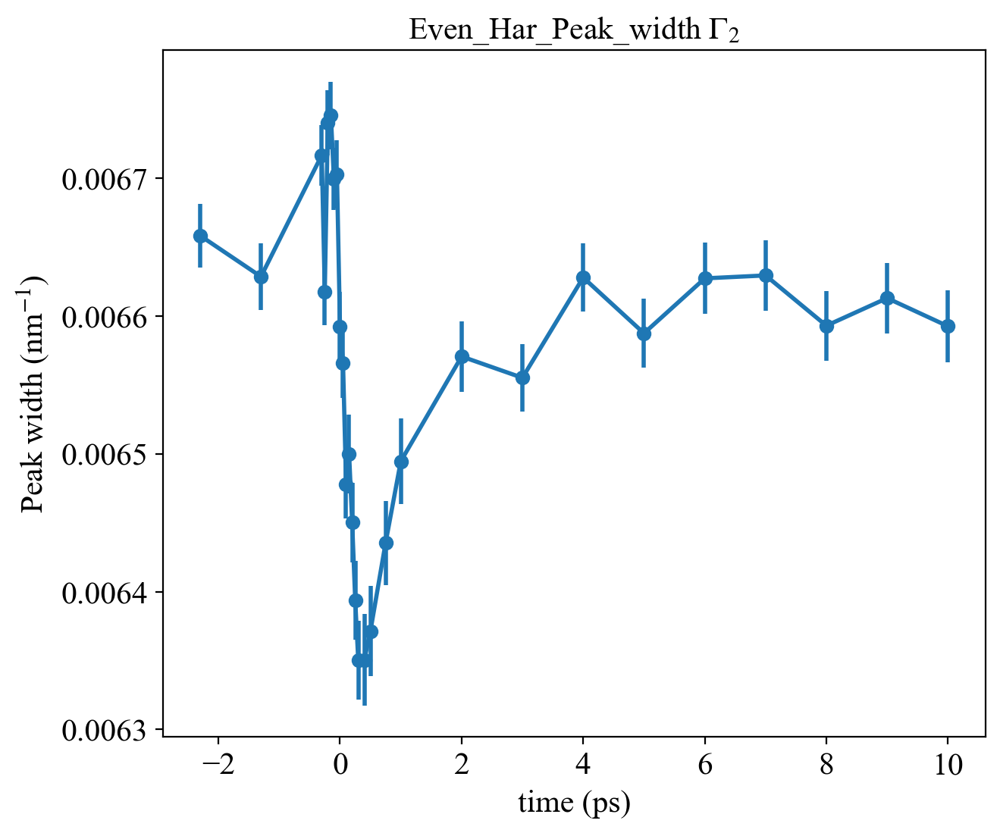

In [111]:
# Plot
#plt.figure(figsize=(12, 8))
plt.errorbar(final_delay_time, popt_list[:, 10], perr_list[:, 10], linewidth=2, marker='o')
#plt.errorbar(final_delay_time[0, :], popt_list[:, 5]/popt_list[0, 5], perr_list[:, 5],linewidth=2,marker='o')

plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('time (ps)',fontsize=15)

plt.ylabel('Peak width (nm$^{-1}$)',fontsize=15)
#plt.ylabel('Norm_Peak width (nm$^{-1}$)',fontsize=20)
#plt.xlim(-0.5, 10)
#plt.ylim(0.032, 0.0326)

plt.title('Even_Har_Peak_width $\u0393_2$',fontsize=15)
#plt.title('Norm_Lobe_Peak_width $Gamma_1$',fontsize=20)
plt.show()

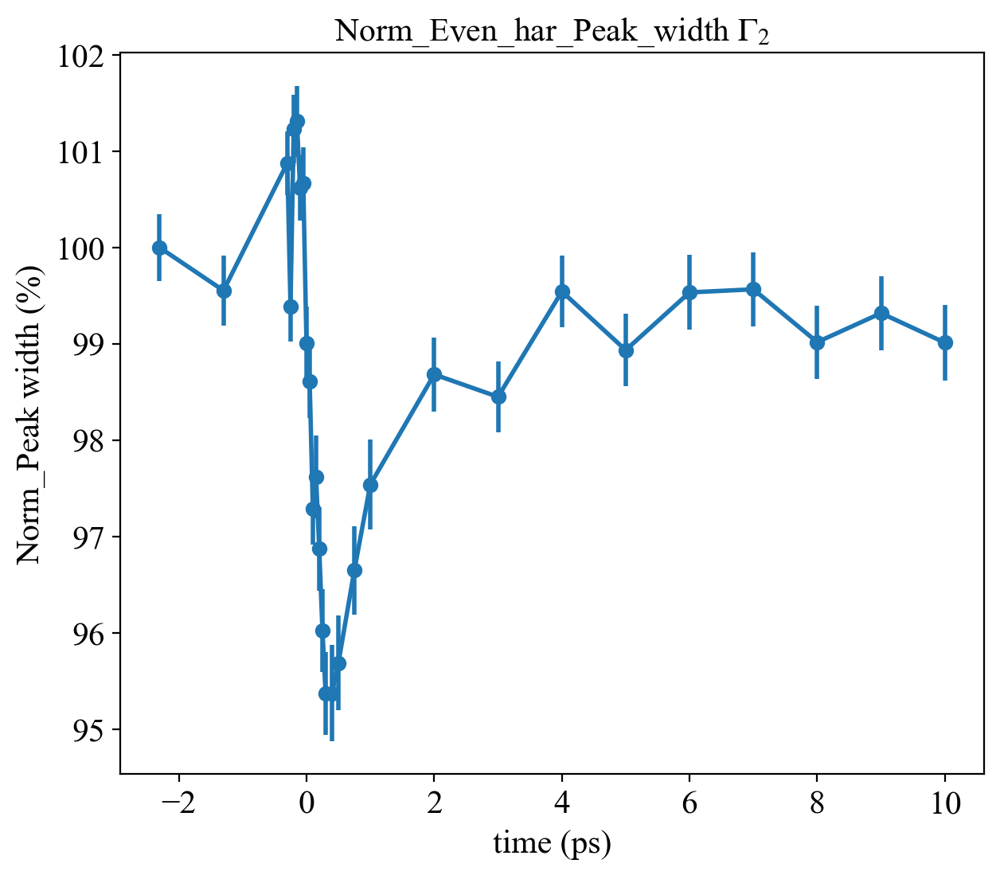

In [112]:
# Plot
#plt.figure(figsize=(12, 8))
#plt.errorbar(final_delay_time[0, :], popt_list[:, 5], perr_list[:, 5],linewidth=2,marker='o')
plt.errorbar(final_delay_time, popt_list[:, 10]/popt_list[0, 10]*100, perr_list[:, 10]/abs(popt_list[0, 10])*100, linewidth=2, marker='o')

plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('time (ps)',fontsize=15)

#plt.ylabel('Peak width $Gamma_1$ (nm$^{-1}$)',fontsize=20)
plt.ylabel('Norm_Peak width (%)',fontsize=15)
#plt.xlim(-0.5, 10)
#plt.ylim(0.032, 0.0326)

#plt.title('Lobe_Peak_width',fontsize=20)
plt.title('Norm_Even_har_Peak_width $\u0393_2$',fontsize=15)
plt.show()

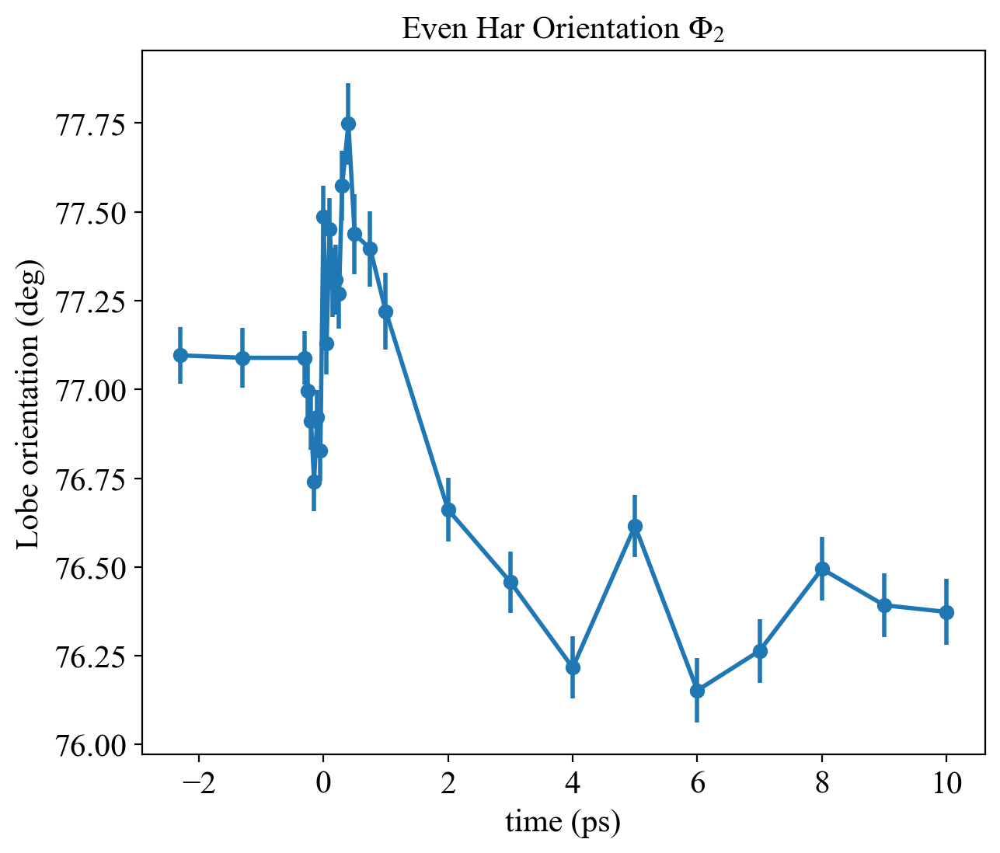

In [113]:
# Plot
#plt.figure(figsize=(12, 8))
plt.errorbar(final_delay_time, np.degrees(popt_list[:, 13]), np.degrees(perr_list[:, 13]),linewidth=2,marker='o')
#plt.errorbar(final_delay_time[0, :], np.degrees(popt_list[:, 8])/np.degrees(popt_list[0, 8]), perr_list[:, 8],linewidth=2,marker='o')

plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('time (ps)',fontsize=15)

plt.ylabel('Lobe orientation (deg)',fontsize=15)
#plt.ylabel('Norm Lobe orientation (deg)',fontsize=20)
#plt.xlim(-0.5, 10)
#plt.ylim(0.032, 0.0326)

plt.title('Even Har Orientation $\u03A6_2$',fontsize=15)
#plt.title('Norm Lobe Orientation Phi',fontsize=20)
plt.show()

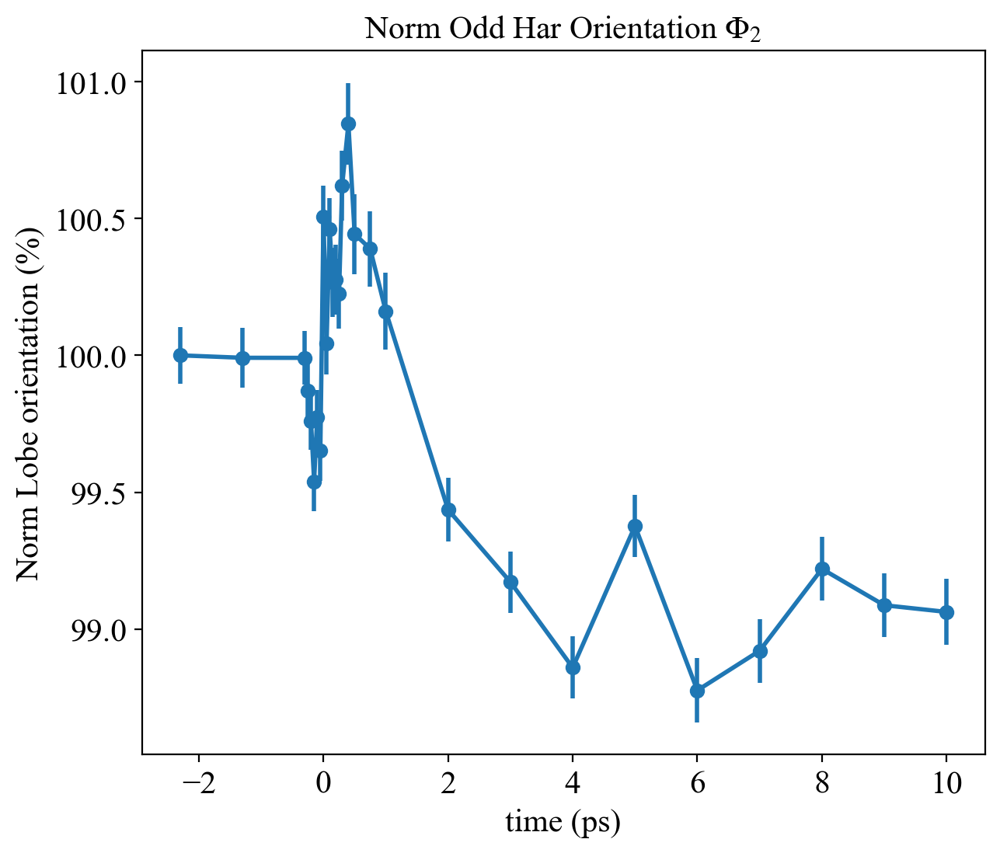

In [114]:
# Plot
#plt.figure(figsize=(12, 8))
#plt.errorbar(final_delay_time[0, :], np.degrees(popt_list[:, 8]), perr_list[:, 8],linewidth=2,marker='o')
plt.errorbar(final_delay_time, np.degrees(popt_list[:, 13])/np.degrees(popt_list[0, 13])*100, abs(np.degrees(perr_list[:, 13])/np.degrees(popt_list[0, 13])*100),linewidth=2,marker='o')

plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('time (ps)',fontsize=15)

#plt.ylabel('Lobe orientation $phi$ (deg)',fontsize=20)
plt.ylabel('Norm Lobe orientation (%)',fontsize=15)
#plt.xlim(-0.5, 10)
#plt.ylim(0.032, 0.0326)

#plt.title('Lobe Orientation Phi',fontsize=20)
plt.title('Norm Odd Har Orientation $\u03A6_2$',fontsize=15)
plt.show()

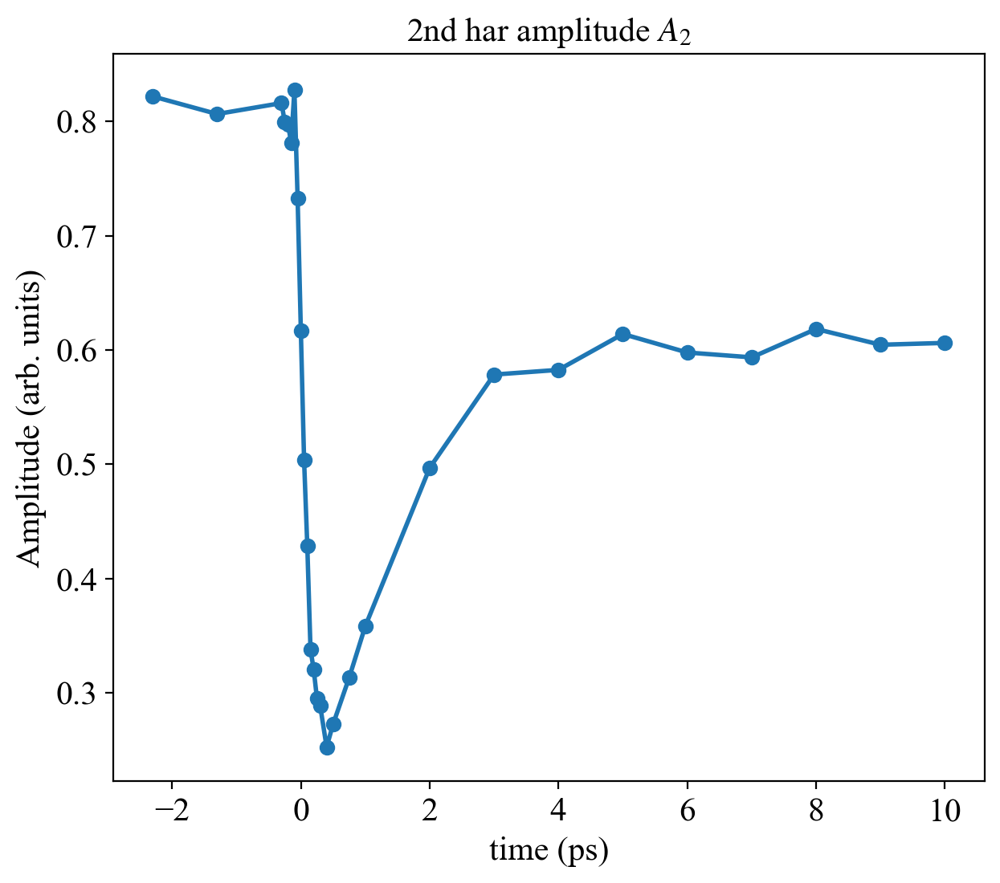

In [115]:
# Plot
#plt.figure(figsize=(12, 8))
plt.errorbar(final_delay_time, popt_list[:, 11], perr_list[:, 11],linewidth=2,marker='o')
#plt.errorbar(final_delay_time[0, :], popt_list[:, 6]/popt_list[0, 6], perr_list[:, 6],linewidth=2,marker='o')

plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('time (ps)',fontsize=15)

plt.ylabel('Amplitude (arb. units)',fontsize=15)
#plt.ylabel('Norm_2nd har amplitude (arb. units)',fontsize=20)
#plt.xlim(-0.5, 10)
#plt.ylim(0.032, 0.0326)

plt.title('2nd har amplitude $A_2$',fontsize=15)
#plt.title('Norm 2nd har amplitude $A_1$',fontsize=20)
plt.show()

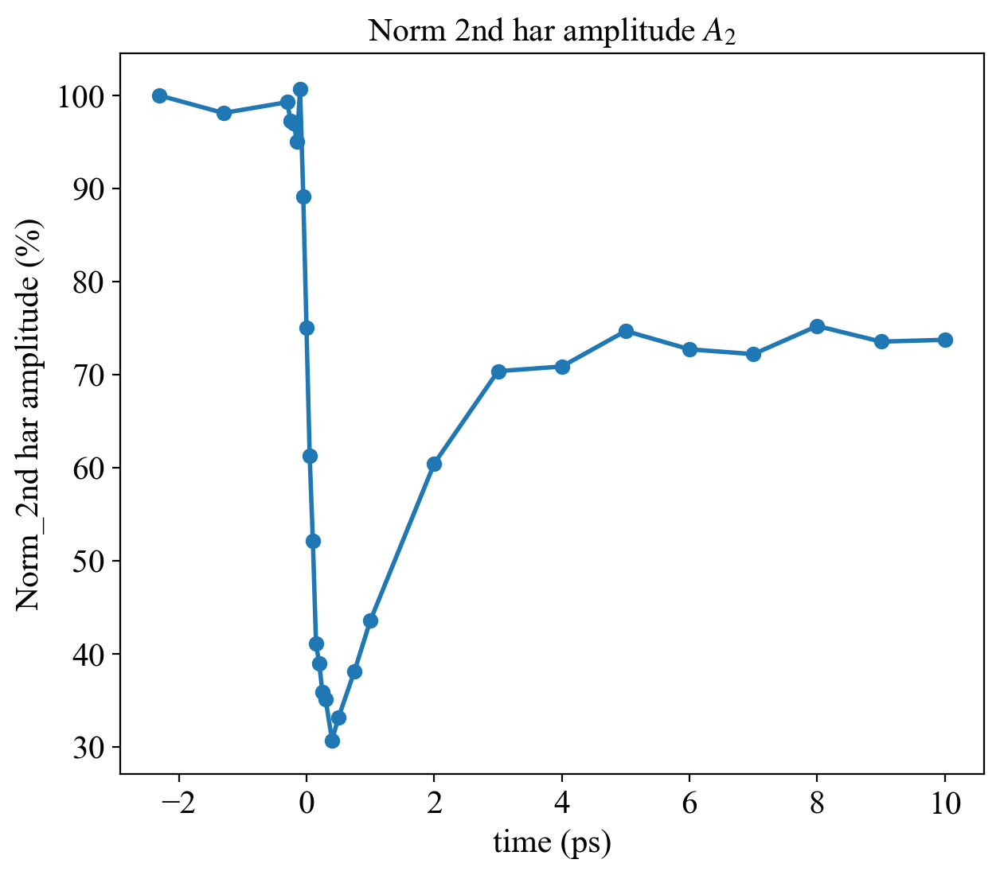

In [116]:
# Plot
#plt.figure(figsize=(12, 8))
#plt.errorbar(final_delay_time[0, :], popt_list[:, 6], perr_list[:, 6],linewidth=2,marker='o')
plt.errorbar(final_delay_time, popt_list[:, 11]/popt_list[0, 11]*100, perr_list[:, 11]/abs(popt_list[0, 11])*100, linewidth=2, marker='o')

plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('time (ps)',fontsize=15)

#plt.ylabel('2nd har amplitude $A_1$ (arb. units)',fontsize=20)
plt.ylabel('Norm_2nd har amplitude (%)',fontsize=15)
#plt.xlim(-0.5, 10)
#plt.ylim(0.032, 0.0326)

#plt.title('2nd har amplitude $A_1$',fontsize=20)
plt.title('Norm 2nd har amplitude $A_2$',fontsize=15)
plt.show()

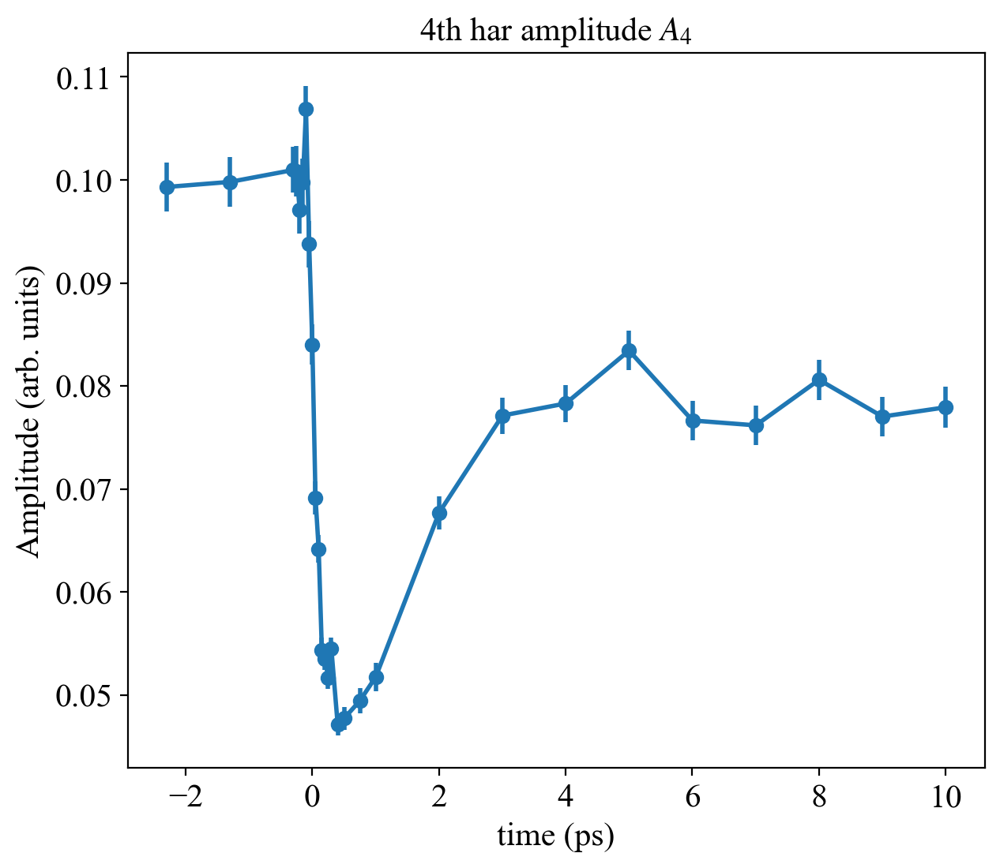

In [117]:
# Plot
#plt.figure(figsize=(12, 8))
plt.errorbar(final_delay_time, popt_list[:, 12], perr_list[:, 12], linewidth=2, marker='o')
#plt.errorbar(final_delay_time[0, :], popt_list[:, 7]/popt_list[0, 7], perr_list[:, 7],linewidth=2,marker='o')

plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('time (ps)',fontsize=15)

plt.ylabel('Amplitude (arb. units)',fontsize=15)
#plt.ylabel('Norm 4th har amplitude (arb. units)',fontsize=20)
#plt.xlim(-0.5, 10)
#plt.ylim(0.032, 0.0326)

plt.title('4th har amplitude $A_4$',fontsize=15)
#plt.title('Norm 4th har amplitude $A_2$',fontsize=20)
plt.show()

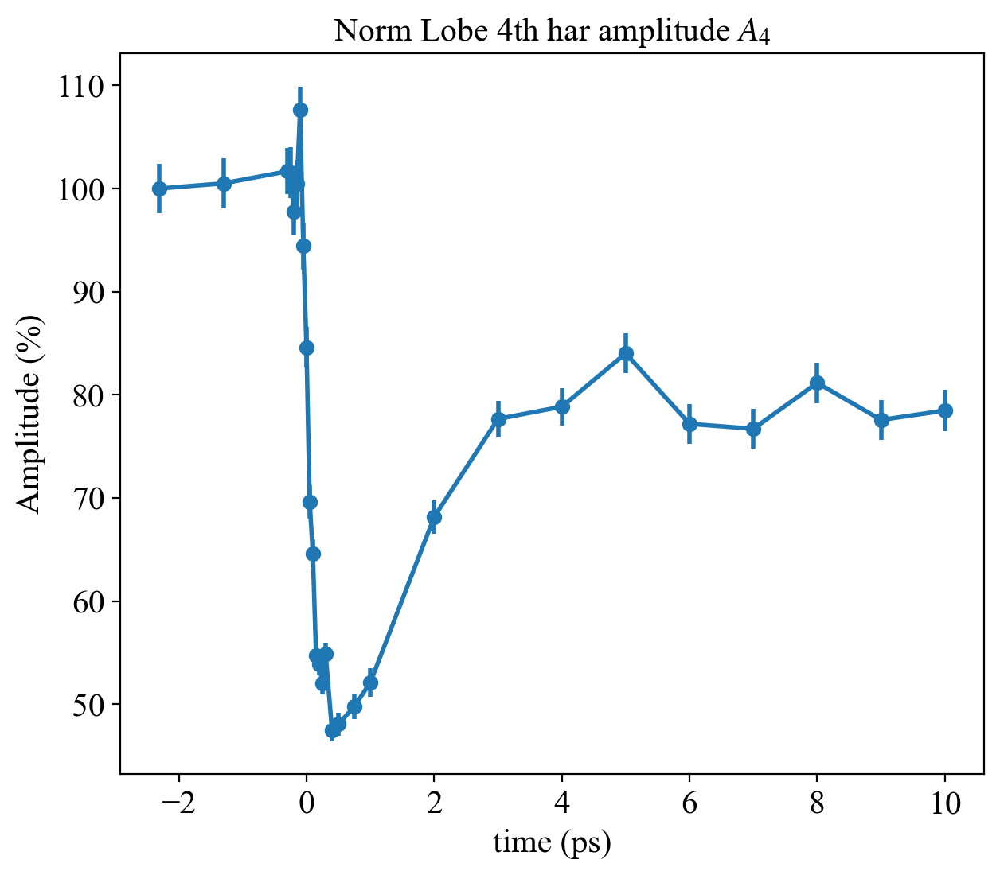

In [118]:
# Plot
#plt.figure(figsize=(12, 8))
#plt.errorbar(final_delay_time[0, :], popt_list[:, 7], perr_list[:, 7],linewidth=2,marker='o')
plt.errorbar(final_delay_time, popt_list[:, 12]/popt_list[0, 12]*100, perr_list[:, 12]/abs(popt_list[0, 12])*100, linewidth=2, marker='o')

plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('time (ps)',fontsize=15)

#plt.ylabel('4th har amplitude (arb. units)',fontsize=20)
plt.ylabel('Amplitude (%)',fontsize=15)
#plt.xlim(-0.5, 10)
#plt.ylim(0.032, 0.0326)

#plt.title('4th har amplitude $A_2$',fontsize=20)
plt.title('Norm Lobe 4th har amplitude $A_4$',fontsize=15)
plt.show()

## Plotting Domain periodicity and correlation lenght

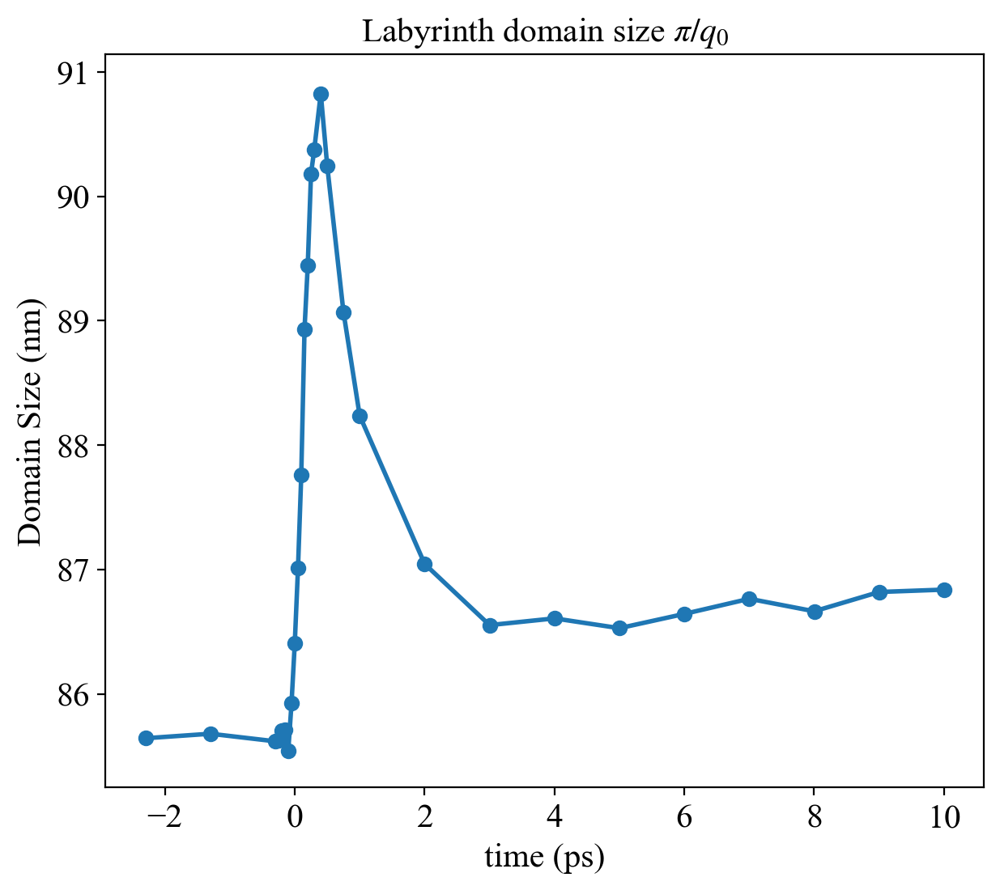

In [119]:
# Plot
#plt.figure(figsize=(12, 8))

error = abs(np.pi/popt_list[:, 1])*np.sqrt((perr_list[:, 1]/popt_list[:, 1])**2)
plt.errorbar(final_delay_time, np.pi/popt_list[:, 1], error,linewidth=2,marker='o')
#plt.errorbar(final_delay_time[0, :], 2*np.pi/popt_list[:, 1]/(2*np.pi/popt_list[0, 1]), perr_list[:, 1],linewidth=2,marker='o')

plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('time (ps)',fontsize=15)

plt.ylabel('Domain Size (nm)',fontsize=15)
#plt.ylabel('Norm Domain periodicity (nm)',fontsize=20)
#plt.xlim(-0.5, 10)
#plt.ylim(0.032, 0.0326)

plt.title('Labyrinth domain size $\u03C0/q_0$',fontsize=15)
#plt.title('Norm Labyrinth domain periodicity $2pi/q_0$',fontsize=20)
plt.show()

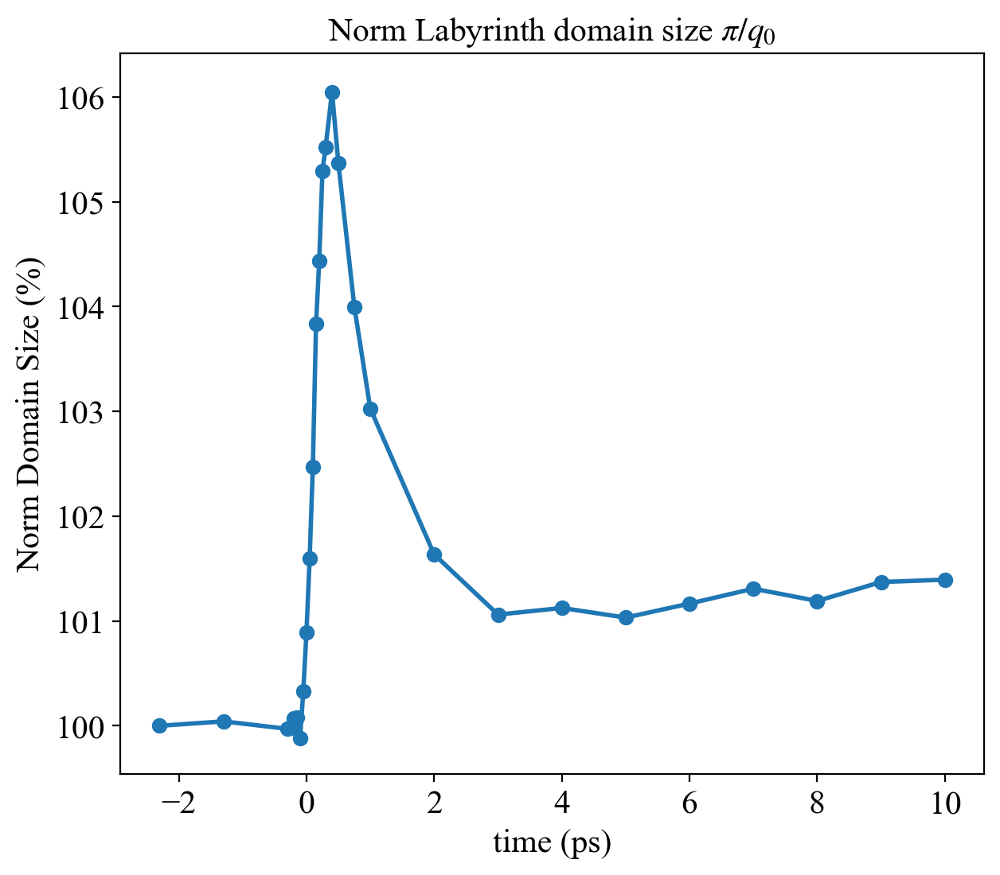

In [120]:
# Plot
#plt.figure(figsize=(12, 8))

#plt.errorbar(final_delay_time[0, :], 2*np.pi/popt_list[:, 1], perr_list[:, 1],linewidth=2,marker='o')
error = abs(np.pi/popt_list[:, 1])*np.sqrt((perr_list[:, 1]/popt_list[:, 1])**2)/abs(np.pi/popt_list[0, 1])
plt.errorbar(final_delay_time, np.pi/popt_list[:, 1]/(np.pi/popt_list[0, 1])*100, error*100,linewidth=2,marker='o')

plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('time (ps)',fontsize=15)

#plt.ylabel('Domain periodicity (nm)',fontsize=20)
plt.ylabel('Norm Domain Size (%)',fontsize=15)
#plt.xlim(-0.5, 10)
#plt.ylim(0.032, 0.0326)

#plt.title('Labyrinth domain periodicity $2pi/q_0$',fontsize=20)
plt.title('Norm Labyrinth domain size $\u03C0/q_0$',fontsize=15)
plt.show()

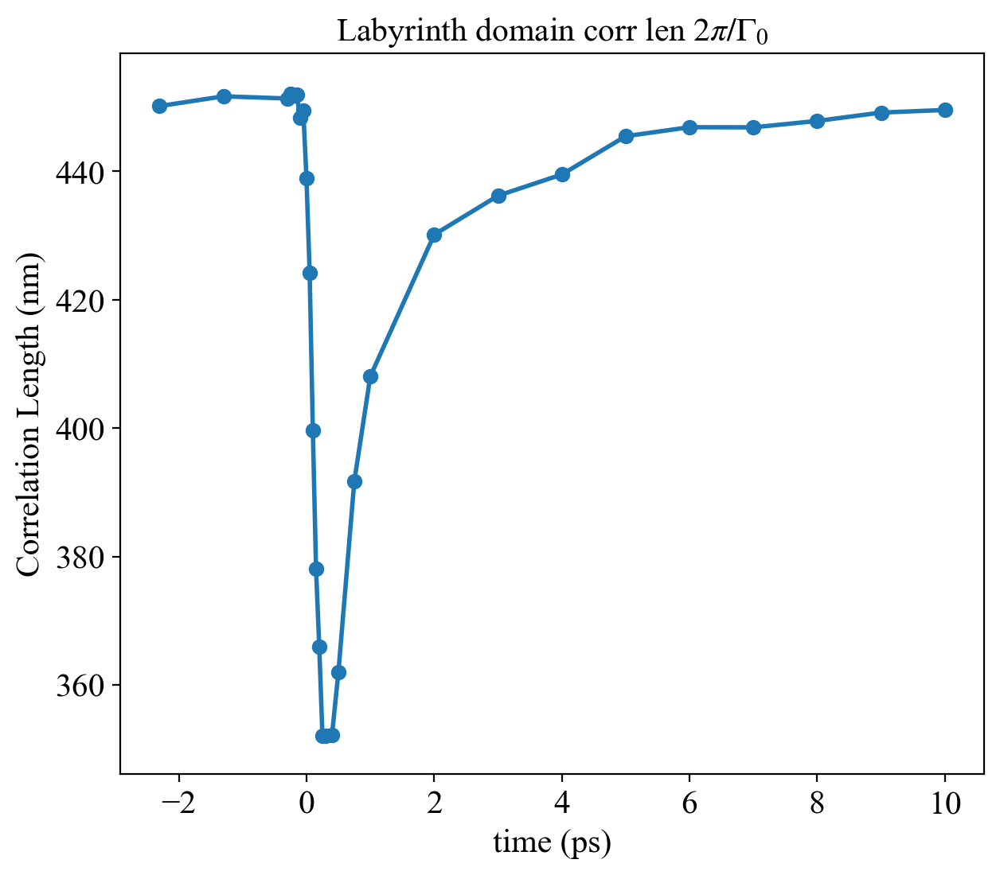

In [121]:
# Plot
#plt.figure(figsize=(12, 8))
error = abs(2*np.pi/popt_list[:, 2])*np.sqrt((perr_list[:, 2]/popt_list[:, 2])**2)
plt.errorbar(final_delay_time, 2*np.pi/popt_list[:, 2], error,linewidth=2,marker='o')
#plt.errorbar(final_delay_time[0, :], 2*np.pi/popt_list[:, 2]/(2*np.pi/popt_list[0, 2]), perr_list[:, 2],linewidth=2,marker='o')

plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('time (ps)',fontsize=15)

plt.ylabel('Correlation Length (nm)',fontsize=15)
#plt.ylabel('Norm Domain corr len (nm)',fontsize=20)
#plt.xlim(-0.5, 10)
#plt.ylim(0.032, 0.0326)

plt.title('Labyrinth domain corr len $2\u03C0/\u0393_0$',fontsize=15)
#plt.title('Norm Lab domain corr len $2pi/Gamma_0$',fontsize=20)
plt.show()

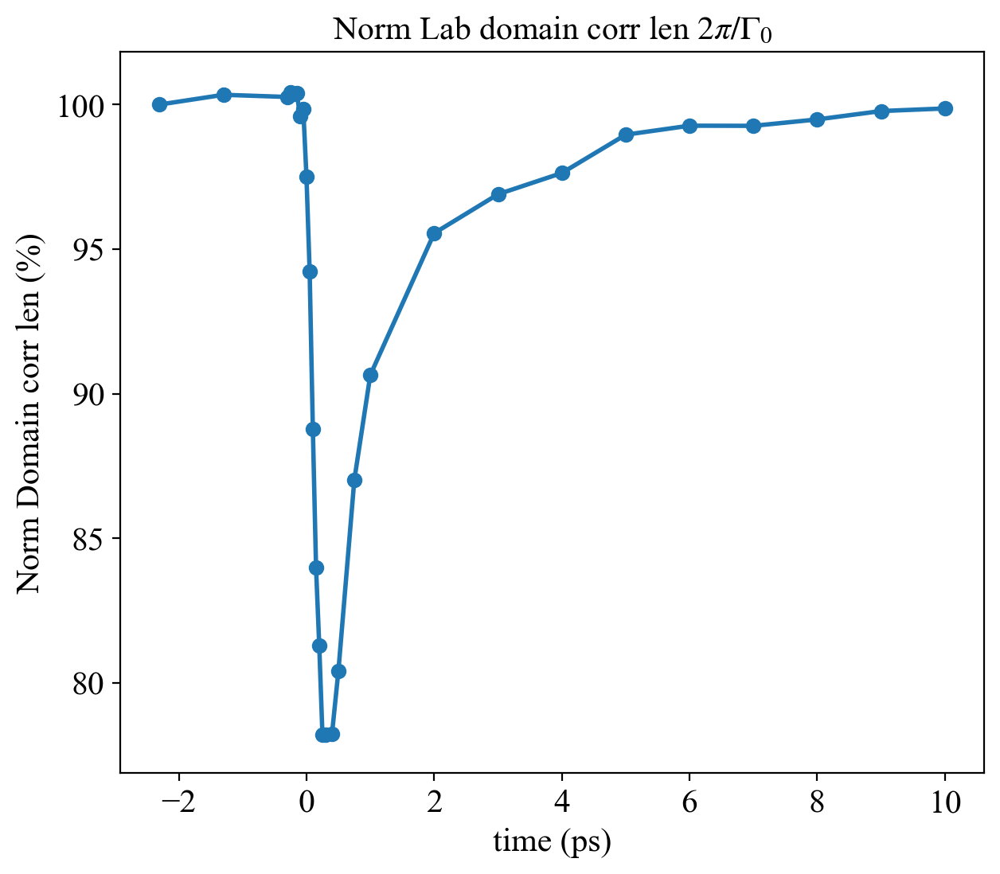

In [122]:
# Plot
#plt.figure(figsize=(12, 8))
#plt.errorbar(final_delay_time[0, :], 2*np.pi/popt_list[:, 2], perr_list[:, 2],linewidth=2,marker='o')
error = abs(2*np.pi/popt_list[:, 2])*np.sqrt((perr_list[:, 2]/popt_list[:, 2])**2)/abs(2*np.pi/popt_list[0, 2])
plt.errorbar(final_delay_time, 2*np.pi/popt_list[:, 2]/(2*np.pi/popt_list[0, 2])*100, error*100,linewidth=2,marker='o')

plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('time (ps)',fontsize=15)

#plt.ylabel('Domain corr len (nm)',fontsize=20)
plt.ylabel('Norm Domain corr len (%)',fontsize=15)
#plt.xlim(-0.5, 10)
#plt.ylim(0.032, 0.0326)

#plt.title('Labyrinth domain corr len $2pi/Gamma_0$',fontsize=20)
plt.title('Norm Lab domain corr len $2\u03C0/\u0393_0$',fontsize=15)
plt.show()

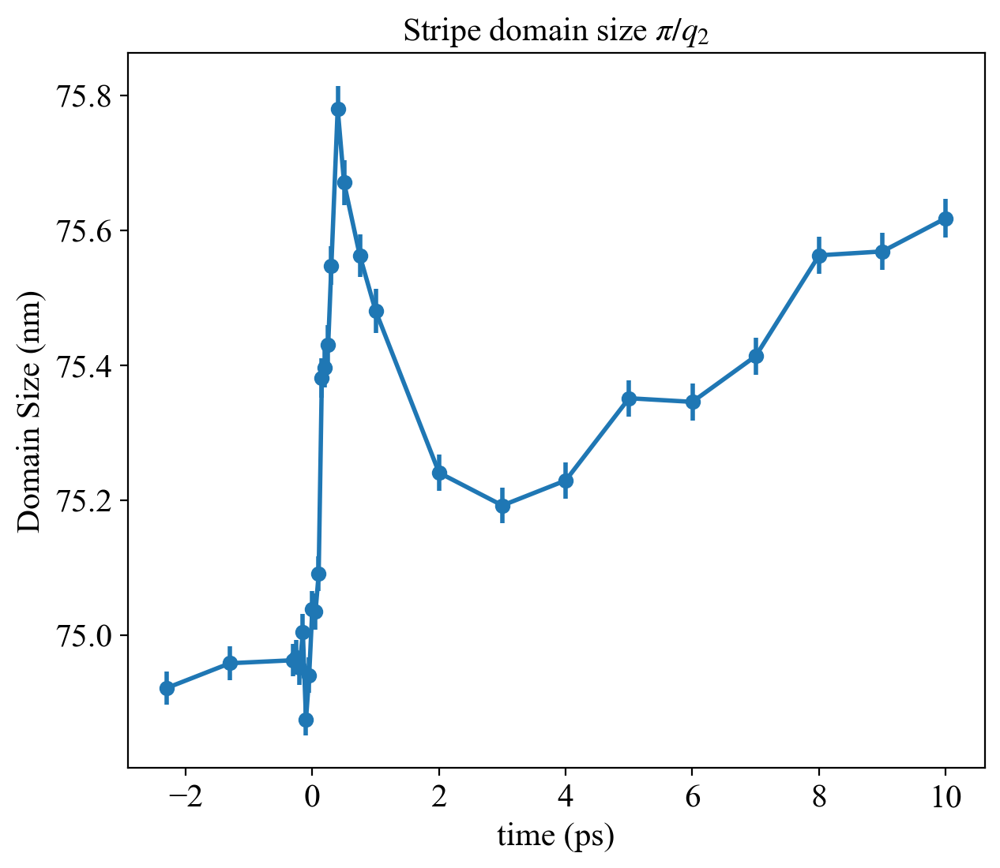

In [123]:
# Plot
#plt.figure(figsize=(12, 8))
error = abs(np.pi/popt_list[:, 9])*np.sqrt((perr_list[:, 9]/popt_list[:, 9])**2)
plt.errorbar(final_delay_time, np.pi/popt_list[:, 9], error,linewidth=2,marker='o')
#plt.errorbar(final_delay_time[0, :], 2*np.pi/popt_list[:, 4]/(2*np.pi/popt_list[0, 4]), perr_list[:, 4],linewidth=2,marker='o')

plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('time (ps)',fontsize=15)

plt.ylabel('Domain Size (nm)',fontsize=15)
#plt.ylabel('Norm Domain periodicity (nm)',fontsize=20)
#plt.xlim(-0.5, 10)
#plt.ylim(0.032, 0.0326)

plt.title('Stripe domain size $\u03C0/q_2$',fontsize=15)
#plt.title('Norm Strip periodicity $2pi/q_1$',fontsize=20)
plt.show()

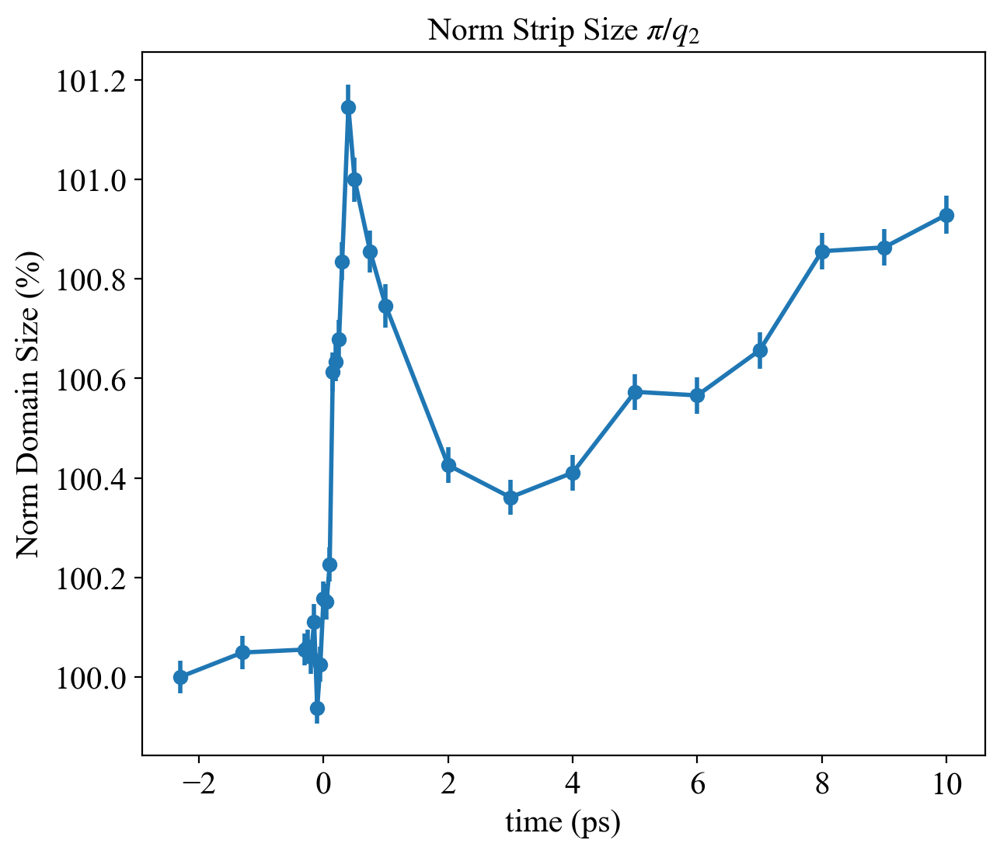

In [124]:
# Plot
#plt.figure(figsize=(12, 8))
#plt.errorbar(final_delay_time[0, :], 2*np.pi/popt_list[:, 4], perr_list[:, 4],linewidth=2,marker='o')
error = abs(np.pi/popt_list[:, 9])*np.sqrt((perr_list[:, 9]/popt_list[:, 9])**2)/abs(np.pi/popt_list[0, 9])
plt.errorbar(final_delay_time, np.pi/popt_list[:, 9]/(np.pi/popt_list[0, 9])*100, error*100,linewidth=2,marker='o')

plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('time (ps)',fontsize=15)

#plt.ylabel('Domain periodicity (nm)',fontsize=20)
plt.ylabel('Norm Domain Size (%)',fontsize=15)
#plt.xlim(-0.5, 10)
#plt.ylim(0.032, 0.0326)

#plt.title('Strip domain periodicity $2pi/q_1$',fontsize=20)
plt.title('Norm Strip Size $\u03C0/q_2$',fontsize=15)
plt.show()

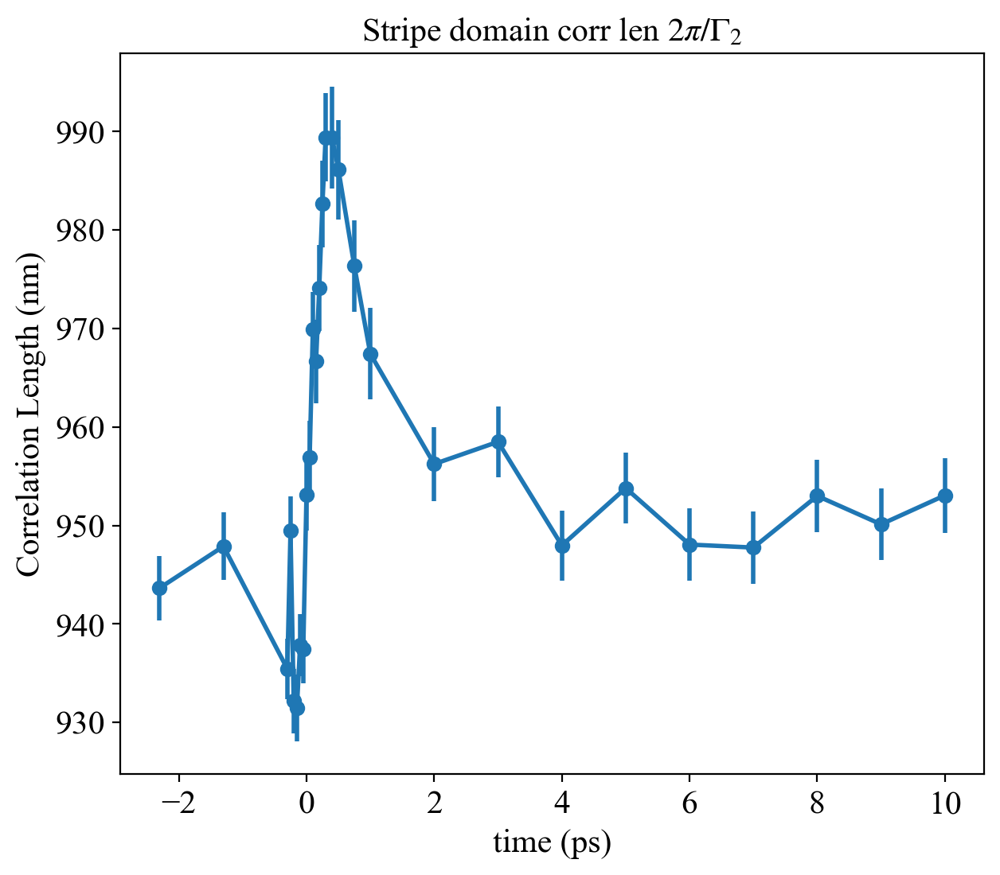

In [125]:
# Plot
#plt.figure(figsize=(12, 8))
error = abs(2*np.pi/popt_list[:, 10])*np.sqrt((perr_list[:, 10]/popt_list[:, 10])**2)
plt.errorbar(final_delay_time, 2*np.pi/popt_list[:, 10], error,linewidth=2,marker='o')
#plt.errorbar(final_delay_time[0, :], 2*np.pi/popt_list[:, 5]/(2*np.pi/popt_list[0, 5]), perr_list[:, 5],linewidth=2,marker='o')

plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('time (ps)',fontsize=15)

plt.ylabel('Correlation Length (nm)',fontsize=15)
#plt.ylabel('Norm Domain corr len (nm)',fontsize=20)
#plt.xlim(-0.5, 10)
#plt.ylim(0.032, 0.0326)

plt.title('Stripe domain corr len $2\u03C0/\u0393_2$',fontsize=15)
#plt.title('Norm Strip corr len $2pi/Gamma_1$',fontsize=20)
plt.show()

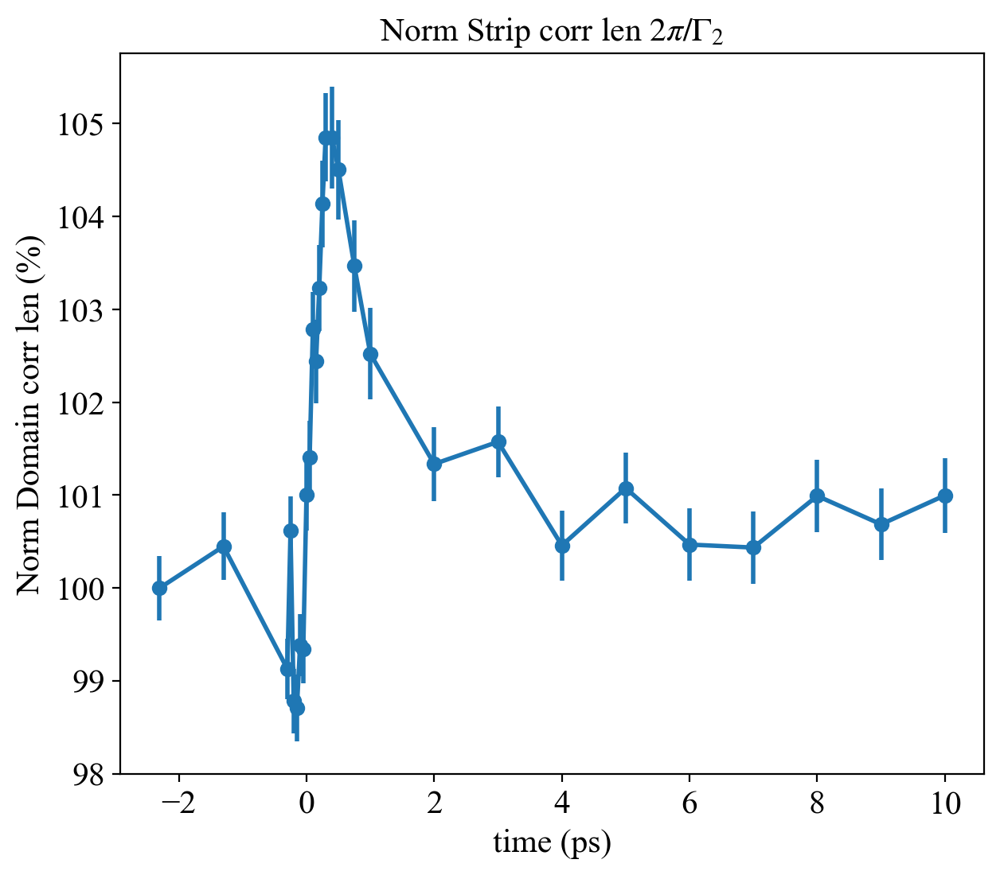

In [126]:
# Plot
#plt.figure(figsize=(12, 8))
#plt.errorbar(final_delay_time[0, :], 2*np.pi/popt_list[:, 5], perr_list[:, 5],linewidth=2,marker='o')
error = abs(2*np.pi/popt_list[:, 10])*np.sqrt((perr_list[:, 10]/popt_list[:, 10])**2)/abs(2*np.pi/popt_list[0, 10])
plt.errorbar(final_delay_time, 2*np.pi/popt_list[:, 10]/(2*np.pi/popt_list[0, 10])*100, error*100, linewidth=2, marker='o')

plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('time (ps)',fontsize=15)

#plt.ylabel('Domain corr len (nm)',fontsize=20)
plt.ylabel('Norm Domain corr len (%)',fontsize=15)
#plt.xlim(-0.5, 10)
#plt.ylim(0.032, 0.0326)

#plt.title('Strip domain corr len $2pi/Gamma_1$',fontsize=20)
plt.title('Norm Strip corr len $2\u03C0/\u0393_2$',fontsize=15)
plt.show()

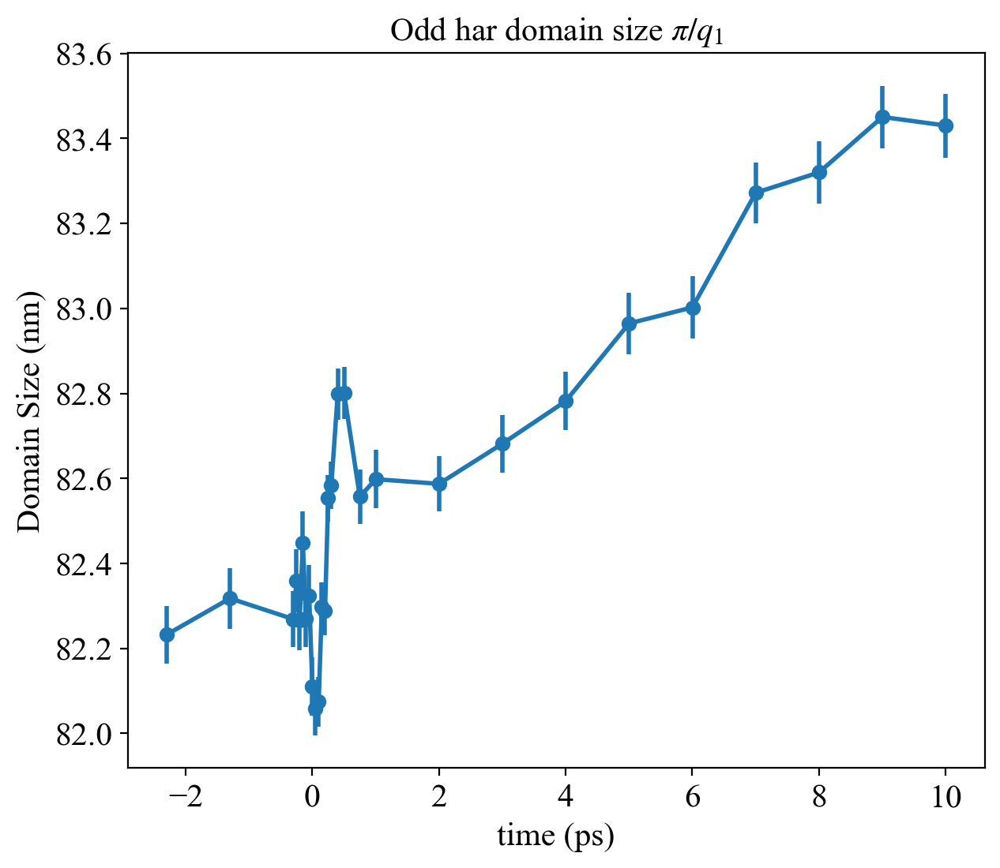

In [127]:
# Plot
#plt.figure(figsize=(12, 8))

error = abs(np.pi/popt_list[:, 4])*np.sqrt((perr_list[:, 4]/popt_list[:, 4])**2)
plt.errorbar(final_delay_time, np.pi/popt_list[:, 4], error,linewidth=2,marker='o')
#plt.errorbar(final_delay_time[0, :], 2*np.pi/popt_list[:, 1]/(2*np.pi/popt_list[0, 1]), perr_list[:, 1],linewidth=2,marker='o')

plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('time (ps)',fontsize=15)

plt.ylabel('Domain Size (nm)',fontsize=15)
#plt.ylabel('Norm Domain periodicity (nm)',fontsize=20)
#plt.xlim(-0.5, 10)
#plt.ylim(0.032, 0.0326)

plt.title('Odd har domain size $\u03C0/q_1$',fontsize=15)
#plt.title('Norm Labyrinth domain periodicity $2pi/q_0$',fontsize=20)
plt.show()

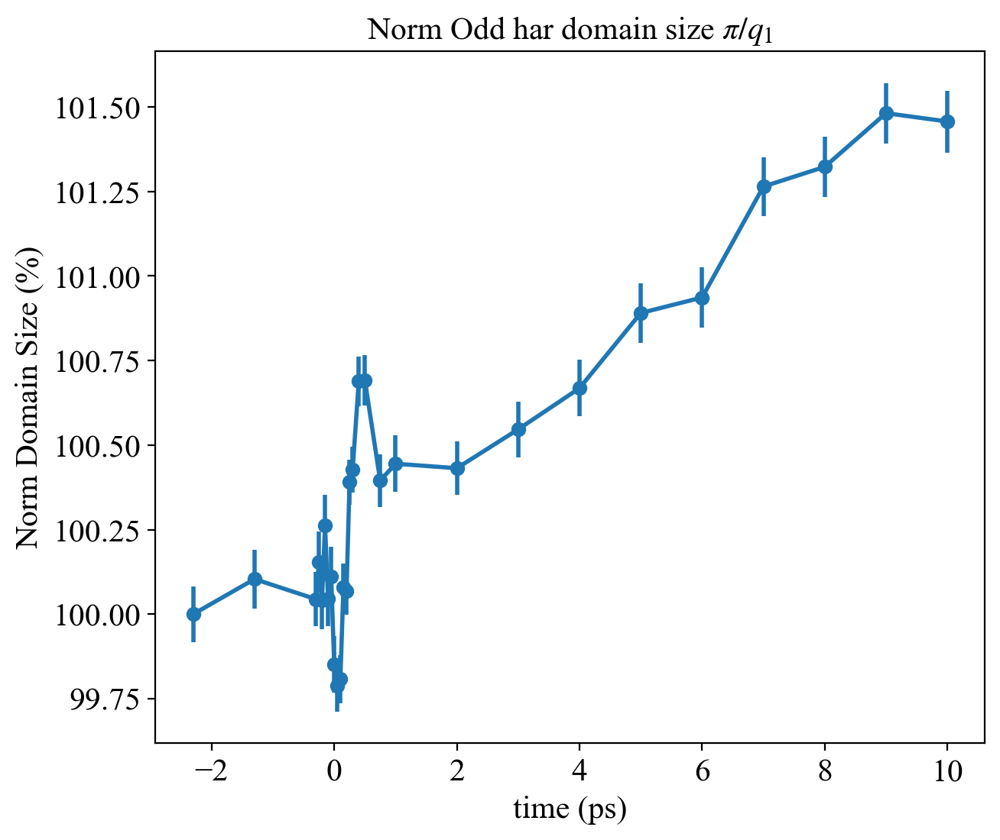

In [128]:
# Plot
#plt.figure(figsize=(12, 8))

#plt.errorbar(final_delay_time[0, :], 2*np.pi/popt_list[:, 1], perr_list[:, 1],linewidth=2,marker='o')
error = abs(np.pi/popt_list[:, 4])*np.sqrt((perr_list[:, 4]/popt_list[:, 4])**2)/abs(np.pi/popt_list[0, 4])
plt.errorbar(final_delay_time, np.pi/popt_list[:, 4]/(np.pi/popt_list[0, 4])*100, error*100,linewidth=2,marker='o')

plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('time (ps)',fontsize=15)

#plt.ylabel('Domain periodicity (nm)',fontsize=20)
plt.ylabel('Norm Domain Size (%)',fontsize=15)
#plt.xlim(-0.5, 10)
#plt.ylim(0.032, 0.0326)

#plt.title('Labyrinth domain periodicity $2pi/q_0$',fontsize=20)
plt.title('Norm Odd har domain size $\u03C0/q_1$',fontsize=15)
plt.show()

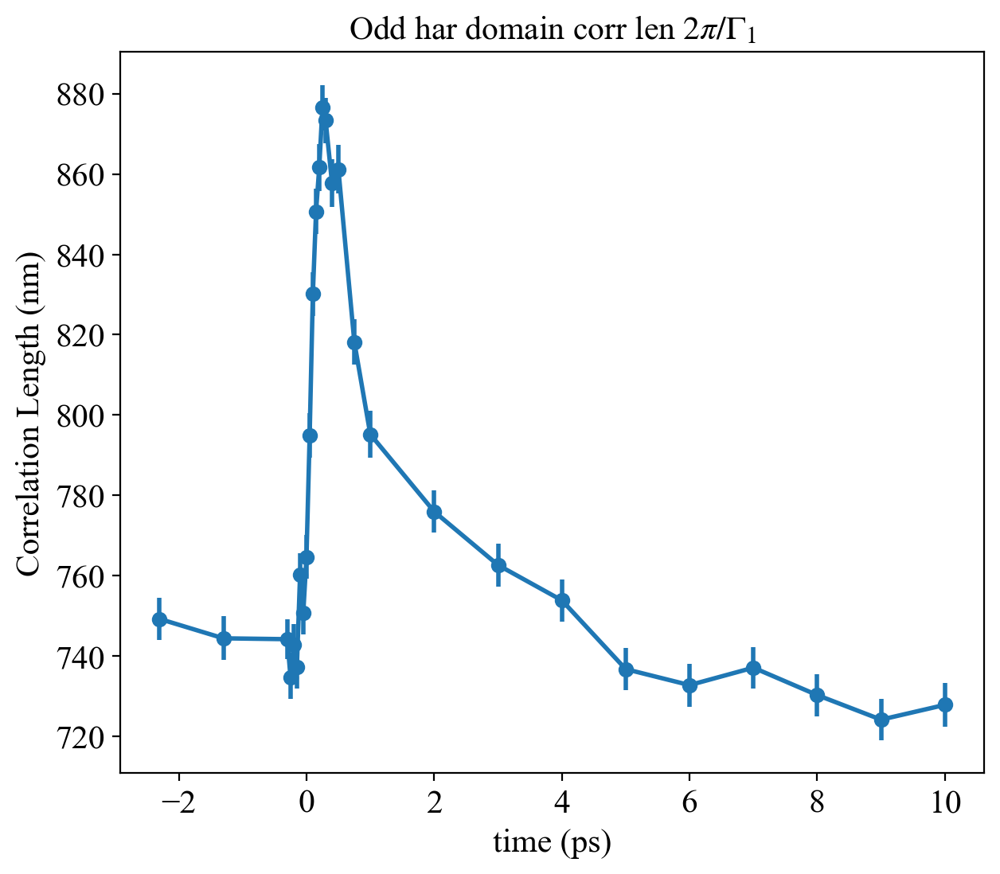

In [129]:
# Plot
#plt.figure(figsize=(12, 8))
error = abs(2*np.pi/popt_list[:, 5])*np.sqrt((perr_list[:, 5]/popt_list[:, 5])**2)
plt.errorbar(final_delay_time, 2*np.pi/popt_list[:, 5], error,linewidth=2,marker='o')
#plt.errorbar(final_delay_time[0, :], 2*np.pi/popt_list[:, 2]/(2*np.pi/popt_list[0, 2]), perr_list[:, 2],linewidth=2,marker='o')

plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('time (ps)',fontsize=15)

plt.ylabel('Correlation Length (nm)',fontsize=15)
#plt.ylabel('Norm Domain corr len (nm)',fontsize=20)
#plt.xlim(-0.5, 10)
#plt.ylim(0.032, 0.0326)

plt.title('Odd har domain corr len $2\u03C0/\u0393_1$',fontsize=15)
#plt.title('Norm Lab domain corr len $2pi/Gamma_0$',fontsize=20)
plt.show()

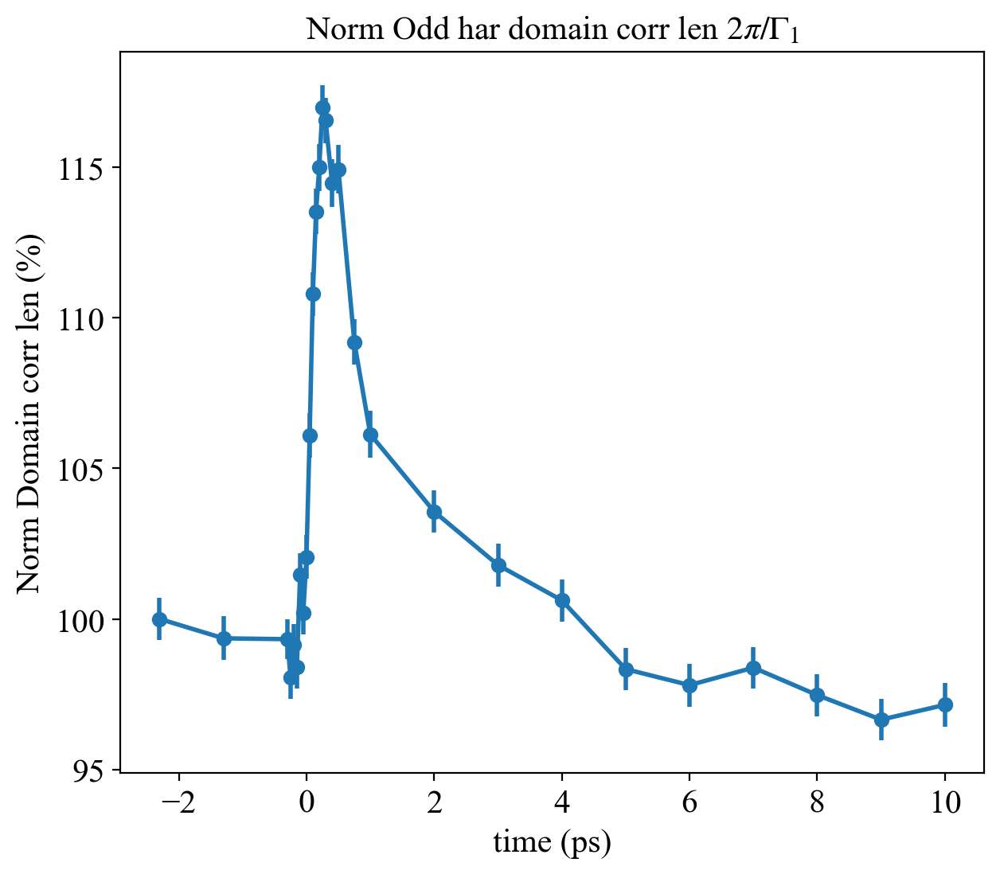

In [130]:
# Plot
#plt.figure(figsize=(12, 8))
#plt.errorbar(final_delay_time[0, :], 2*np.pi/popt_list[:, 2], perr_list[:, 2],linewidth=2,marker='o')
error = abs(2*np.pi/popt_list[:, 5])*np.sqrt((perr_list[:, 5]/popt_list[:, 5])**2)/abs(2*np.pi/popt_list[0, 5])
plt.errorbar(final_delay_time, 2*np.pi/popt_list[:, 5]/(2*np.pi/popt_list[0, 5])*100, error*100,linewidth=2,marker='o')

plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('time (ps)',fontsize=15)

#plt.ylabel('Domain corr len (nm)',fontsize=20)
plt.ylabel('Norm Domain corr len (%)',fontsize=15)
#plt.xlim(-0.5, 10)
#plt.ylim(0.032, 0.0326)

#plt.title('Labyrinth domain corr len $2pi/Gamma_0$',fontsize=20)
plt.title('Norm Odd har domain corr len $2\u03C0/\u0393_1$',fontsize=15)
plt.show()

# Save fit parameters

In [131]:
# Build tag string to be added to end of filenames
filedate = datetime.datetime.now()
fdstring = filedate.strftime('_%b%d_%Hh%Mm')


savedir = '2D_fit_results'
fit_name = 'Four_Har_fit'

In [132]:
# Store Integrated data
#file = savedir + '/' + user + '/IntegInten_pumped_TimeDept_Run' + f'{run_nr}' + '_' + user + 'Nov%d_%dh_%dm.h5' % (filedate.day,filedate.hour,filedate.minute) 
file_1 = savedir + 'Fit_params\\' + f'{fluence}uJ_' + f'{scan_im}_' + fit_name + '_' + 'Nov%d_%dh_%dm' % (filedate.day,filedate.hour,filedate.minute)
file_2 = savedir + 'Fit_error\\' + f'{fluence}uJ_' + f'{scan_im}_' + fit_name + '_' + 'Nov%d_%dh_%dm' % (filedate.day,filedate.hour,filedate.minute)
file_3 = savedir + 'Fit_cov\\' + f'{fluence}uJ_' + f'{scan_im}_' + fit_name + '_' + 'Nov%d_%dh_%dm' % (filedate.day,filedate.hour,filedate.minute)

In [133]:
file_1

'2D_fit_resultsFit_params\\16.0uJ_WX15_Y16_Scan041_Four_Har_fit_Nov28_20h_25m.h5'

In [134]:
# Adding dt to the first column of fit paramenters
final_params_fit = np.insert(popt_list, 0, final_delay_time, axis = 1)
final_params_error = np.insert(perr_list, 0, final_delay_time, axis = 1)

#      'B'       'q0'       'Gamma0'      'A0'      'q1'     'Gamma1'        'A1'        'A3'         'phi1'        'q2'         'Gamma2'        'A2'         'A4'        'phi2'
# Defining the column names for the fit parameters
col_names = ('delay_time [ps]', 'B', 'q0', 'Gamma0', 'A0', 'q1', 'Gamma1', 'A1', 'A3', 'phi1', 'q2', 'Gamma2', 'A2', 'A4', 'phi2')


In [135]:
# Uncomment the lines below to save fit parameters

# np.save(file_1, final_params_fit)

# np.save(file_2, final_params_error)

# np.save(file_3, pcov_list)